# E-Commerce Capstone Project

**Problem Statement**: ElecKart is a leading e-commerce chain based in Ontario, Canada, specialising in electronic products. It sells all major electronic items such as TVs, cameras, OLED screens, and microwaves.

The brand has shown commendable growth in just a few years of its operation. However, over the last one year, ElecKart has faced a revenue dip even after spending a significant amount of money on marketing and promotions. There was a high customer churn ratio because the company was failing to understand customer demographics and cater to the needs of their customers.

There was no mobile app for a satisfactory shopping experience and the website had a confusing interface with incomplete product details making it difficult for the customers to easily locate what they are looking for. The budgets planned were not as impactful as expected, and the CFO was quite unhappy with the turnover rates. Now, the CFO wants a root cause analysis done to understand what went wrong in the process and why they were unable to hit the desired profit levels. The company would like to optimise its operations in order to ensure better cost efficiencies and not lose the existing customer base due to lack of planning and operational flaws.

**We will be creating market mix models for three product subcategories: Camera Accessory, Home Audio, and Gaming Accessory and providing recommendation to the business.**

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [5]:
!pip install python-docx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
!pip install squarify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
# Importing required libraries

import pandas as pd, numpy as np
from docx import Document
import calendar, re, squarify, matplotlib
import matplotlib.pyplot as plt, seaborn as sns

#Display all the columns
pd.pandas.set_option('display.max_columns',None)
pd.pandas.set_option('display.max_rows',None)

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

## Step 1: Reading the datasets

In [8]:
# Reading ConsumerElectronics dataset

consumer_elec_df = pd.read_csv("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/ConsumerElectronics.csv")

In [9]:
# Display the first five rows
consumer_elec_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


### As the Media data and other information excel file contains data in different sheets we will be storing each sheet in different dataframe.

In [10]:
# Reading Product List sheetProducts from Media data and other information dataset
prod_list_df = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name="Product List", skiprows=1, usecols=range(1,4))

# Renaming the first column
prod_list_df.columns.values[0] = "Products"

# Display first five rows
prod_list_df.head()

,Products,Frequency,Percent
0,\N,5828.0,0.353464
1,AmplifierReceiver,4056.0,0.245994
2,AudioMP3Player,112892.0,6.846819
3,Binoculars,14599.0,0.885419
4,BoomBox,2879.0,0.174609


In [11]:
# Reading Media Investment dataset 
media_inv_df = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name="Media Investment", skiprows=2, usecols=range(1,13))

# Display first five rows
media_inv_df.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [12]:
# Reading Special Sale calendar dataset
spc_sale_calendar = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name="Special Sale Calendar", usecols=range(1,3))

# Re naming the first column
spc_sale_calendar.columns.values[0] = "Sale_year"

# Filling the null values of column Sale year with previous value as the next rows represent the same year
spc_sale_calendar["Sale_year"] = spc_sale_calendar["Sale_year"].ffill()

spc_sale_calendar

,Sale_year,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [13]:
# Reading Monthly NPS score 
monthly_nps = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name = "Monthly NPS Score")

# Renameing the first column
monthly_nps.columns.values[0] = "Scores"

monthly_nps

,Scores,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [14]:
# Reading the Product Details word file
document = Document("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Product Details.docx")

In [15]:
# Converting the document into table
table = document.tables[0]

In [16]:
# Converting the table data to dataframe
data = [[cell.text for cell in row.cells] for row in table.rows]
product_df = pd.DataFrame(data)

# Formating the column names
product_df = product_df.rename(columns=product_df.iloc[0]).drop(product_df.index[0]).reset_index(drop=True)
product_df.head()

,super_category,category,sub_category,vertical
0,CE,Camera,Camera,Camcorders
1,CE,Camera,Camera,DSLR
2,CE,Camera,Camera,Instant Cameras
3,CE,Camera,Camera,Point & Shoot
4,CE,Camera,Camera,SportsAndAction


In [17]:
# Reading the Climate data for 2015

ontario_2015 = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/ONTARIO-2015.xlsx", skiprows=24)
ontario_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015.0,1.0,1.0,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015.0,1.0,2.0,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015.0,1.0,3.0,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015.0,1.0,4.0,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015.0,1.0,5.0,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [18]:
# Reading the Climate data

ontario_2016 = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/ONTARIO-2016.xlsx", skiprows=24)
ontario_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


So now we have read the following files and stored in dataframes:

1. ConsumerElectronics.csv - consumer_elec_df
2. Product List - prod_list_df
3. Media Investment - media_inv_df
4. Special Sale Calendar - spc_sale_calendar
5. Monthly NPS Score - monthly_nps
6. Product Details.docx - product_df
7. ONTARIO-2015.xlsx - ontario_2015
8. ONTARIO-2016.xlsx - ontario_2016

Now we will be proceeding with the data cleaning.


## Step 2: Data Cleaning, Preparation and Analysis

#### Cleaning consumer_elec_df 

In [19]:
consumer_elec_df.shape

(1648824, 20)

In [20]:
consumer_elec_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [21]:
consumer_elec_df.describe()

,Year,Month,order_id,order_item_id,units,sla,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06
mean,2.015519e+03,6.585650e+00,2.842445e+15,1.375628e+16,1.022087e+00,5.687832e+00,4.108309e+03,5.403451e+00
std,4.996557e-01,3.623351e+00,1.269134e+15,5.594598e+16,2.535318e-01,2.983336e+00,8.510918e+03,5.346618e+01
min,2.015000e+03,1.000000e+00,7.633152e+07,1.080165e+08,1.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00
25%,2.015000e+03,3.000000e+00,1.602589e+15,1.606725e+15,1.000000e+00,4.000000e+00,7.990000e+02,1.000000e+00
50%,2.016000e+03,6.000000e+00,2.611825e+15,2.619185e+15,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00
75%,2.016000e+03,1.000000e+01,3.610614e+15,4.397706e+15,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,3.000373e+17,5.000000e+01,1.006000e+03,2.999990e+05,1.000000e+03


In [22]:
consumer_elec_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1648824 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  object 
 9   deliverycdays                    1648824 non-null  object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

**From the above info we can see that there are few columns with invalid data types so we will be inspecting and correcting them.**

In [23]:
# Storing data value in new columns and converting to datetime type
consumer_elec_df["o_date"] = pd.to_datetime(pd.DatetimeIndex(consumer_elec_df.order_date).date)

# Storing time values in new column
consumer_elec_df["o_time"] = pd.DatetimeIndex(consumer_elec_df["order_date"]).time

# Dropping the order_date column
consumer_elec_df.drop("order_date", axis = 1, inplace=True)

In [24]:
consumer_elec_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 21 columns):
 #   Column                           Non-Null Count    Dtype         
---  ------                           --------------    -----         
 0   fsn_id                           1648824 non-null  object        
 1   Year                             1648824 non-null  int64         
 2   Month                            1648824 non-null  int64         
 3   order_id                         1648824 non-null  float64       
 4   order_item_id                    1648824 non-null  float64       
 5   gmv                              1648824 non-null  object        
 6   units                            1648824 non-null  int64         
 7   deliverybdays                    1648824 non-null  object        
 8   deliverycdays                    1648824 non-null  object        
 9   s1_fact.order_payment_type       1648824 non-null  object        
 10  sla                           

**As the requirement specifies we need to use the data from July 2015 to June 2016, we will be filetring the data.**

In [25]:
print("Start date :", min(consumer_elec_df.o_date))
print("End date :", max(consumer_elec_df.o_date))

Start date : 2015-05-19 00:00:00
End date : 2016-07-25 00:00:00


In [26]:
# Filetrig the data according to requirement

consumer_elec_df = consumer_elec_df[(consumer_elec_df["o_date"] >= "2015-07-01") & (consumer_elec_df["o_date"] <= "2016-06-30")]
consumer_elec_df.shape

(1648215, 21)

In [27]:
print("Start date :", min(consumer_elec_df.o_date))
print("End date :", max(consumer_elec_df.o_date))

Start date : 2015-07-01 00:00:00
End date : 2016-06-30 00:00:00


In [28]:
# Inspecting column gmv

consumer_elec_df.gmv.head(10)

0    6400
1    6900
2    1990
3    1690
4    1618
5    3324
6    3695
7    3695
8        
9    3695
Name: gmv, dtype: object

**In column gmv there are few values as spaces. So, we will be checking if any other column has missing values as spaces.**

In [29]:
# Display number of space values in each column

(consumer_elec_df == " ").sum(axis = 0)

fsn_id                                0
Year                                  0
Month                                 0
order_id                              0
order_item_id                         0
gmv                                4904
units                                 0
deliverybdays                         0
deliverycdays                         0
s1_fact.order_payment_type            0
sla                                   0
cust_id                            4904
pincode                            4904
product_analytic_super_category       0
product_analytic_category             0
product_analytic_sub_category         0
product_analytic_vertical             0
product_mrp                           0
product_procurement_sla               0
o_date                                0
o_time                                0
dtype: int64

In [30]:
# Replacing the spaces with null values
consumer_elec_df.gmv = consumer_elec_df.gmv.replace(" ", np.NaN)

# Coverting to numeric type
consumer_elec_df.gmv = pd.to_numeric(consumer_elec_df.gmv)

In [31]:
# Replacing the spaces with null values
consumer_elec_df.cust_id = consumer_elec_df.cust_id.replace(" ", np.NaN)

# Replacing the spaces with null values
consumer_elec_df.pincode = consumer_elec_df.pincode.replace(" ", np.NaN)

In [32]:
# Checking the missing values percentage

round(consumer_elec_df.isnull().sum()/ len(consumer_elec_df)*100,2)

fsn_id                             0.0
Year                               0.0
Month                              0.0
order_id                           0.0
order_item_id                      0.0
gmv                                0.3
units                              0.0
deliverybdays                      0.0
deliverycdays                      0.0
s1_fact.order_payment_type         0.0
sla                                0.0
cust_id                            0.3
pincode                            0.3
product_analytic_super_category    0.0
product_analytic_category          0.0
product_analytic_sub_category      0.0
product_analytic_vertical          0.0
product_mrp                        0.0
product_procurement_sla            0.0
o_date                             0.0
o_time                             0.0
dtype: float64

**As we can see that column gmv, cust_id and pincode has 0.3% of missing values which is very less we will be dropping the missing row.**

In [33]:
consumer_elec_df = consumer_elec_df[~consumer_elec_df["gmv"].isnull()]
consumer_elec_df.shape

(1643311, 21)

In [34]:
# Display number of space values in each column
print((consumer_elec_df == " ").sum(axis = 0))

# Re-checking the missing values percentage
round(consumer_elec_df.isnull().sum()/ len(consumer_elec_df)*100,2)

fsn_id                             0
Year                               0
Month                              0
order_id                           0
order_item_id                      0
gmv                                0
units                              0
deliverybdays                      0
deliverycdays                      0
s1_fact.order_payment_type         0
sla                                0
cust_id                            0
pincode                            0
product_analytic_super_category    0
product_analytic_category          0
product_analytic_sub_category      0
product_analytic_vertical          0
product_mrp                        0
product_procurement_sla            0
o_date                             0
o_time                             0
dtype: int64


fsn_id                             0.0
Year                               0.0
Month                              0.0
order_id                           0.0
order_item_id                      0.0
gmv                                0.0
units                              0.0
deliverybdays                      0.0
deliverycdays                      0.0
s1_fact.order_payment_type         0.0
sla                                0.0
cust_id                            0.0
pincode                            0.0
product_analytic_super_category    0.0
product_analytic_category          0.0
product_analytic_sub_category      0.0
product_analytic_vertical          0.0
product_mrp                        0.0
product_procurement_sla            0.0
o_date                             0.0
o_time                             0.0
dtype: float64

In [35]:
# Inspecting the delivery days column

consumer_elec_df.deliverybdays.head()

0    \N
1    \N
2    \N
3    \N
4    \N
Name: deliverybdays, dtype: object

**We can see that the delivery days column has "\\N" as the values. So, we will be checking the percentage of such values.**

In [36]:
# Inspecting deliverybdays column where value is not equal to "\\N"
print(consumer_elec_df.deliverybdays[consumer_elec_df.deliverybdays != "\\N"].head())

print("\nPercentage of invalid values :", round(len(consumer_elec_df.deliverybdays[consumer_elec_df.deliverybdays == "\\N"])/len(consumer_elec_df.deliverybdays)*100,2))

706       5
9726      5
11094     4
11693    12
12883     6
Name: deliverybdays, dtype: object

Percentage of invalid values : 79.59


In [37]:
# Inspecting deliverycdays column where value is not equal to "\\N"
print(consumer_elec_df.deliverycdays[consumer_elec_df.deliverycdays != "\\N"].head())

print("\nPercentage of invalid values :", round(len(consumer_elec_df.deliverycdays[consumer_elec_df.deliverycdays == "\\N"])/len(consumer_elec_df.deliverycdays)*100,2))

706       6
9726      6
11094     5
11693    14
12883     7
Name: deliverycdays, dtype: object

Percentage of invalid values : 79.59


**As the percentage of invalid values are almost 80% we will be imputing those with 0.**

In [38]:
# Replacing the invalid value with 0
consumer_elec_df.deliverybdays = consumer_elec_df.deliverybdays.replace("\\N", 0)

# Coverting to numeric type
consumer_elec_df.deliverybdays = pd.to_numeric(consumer_elec_df.deliverybdays)

In [39]:
# Replacing the invalid value with 0
consumer_elec_df.deliverycdays = consumer_elec_df.deliverycdays.replace("\\N", 0)

# Coverting to numeric type
consumer_elec_df.deliverycdays = pd.to_numeric(consumer_elec_df.deliverycdays)

In [40]:
# Inspecting delivery days columns

print("max deliverybdays :", max(consumer_elec_df.deliverybdays))
print("min deliverybdays :", min(consumer_elec_df.deliverybdays))

print("max deliverycdays :", max(consumer_elec_df.deliverycdays))
print("min deliverycdays :", min(consumer_elec_df.deliverycdays))

print("min sla :", min(consumer_elec_df.sla))
print("max sla :", max(consumer_elec_df.sla))

print("min product_procurement_sla :", min(consumer_elec_df.product_procurement_sla))
print("max product_procurement_sla :", max(consumer_elec_df.product_procurement_sla))

max deliverybdays : 238
min deliverybdays : -98
max deliverycdays : 278
min deliverycdays : -5345
min sla : 0
max sla : 1006
min product_procurement_sla : -1
max product_procurement_sla : 1000


In [41]:
# Inspecting deliverybdays which are negative

print(consumer_elec_df[consumer_elec_df["deliverybdays"] < 0 ].shape)

(38, 21)


In [42]:
# Filtering records having deliverybdays which are non negative

consumer_elec_df = consumer_elec_df[consumer_elec_df["deliverybdays"] >= 0]

In [43]:
# Inspecting deliverybdays which are negative 

print(consumer_elec_df[consumer_elec_df["deliverycdays"] < 0 ].shape)

(1, 21)


In [44]:
# Filtering records having deliverycdays which are non negative

consumer_elec_df = consumer_elec_df[consumer_elec_df["deliverycdays"] >= 0]

In [45]:
# Filetring non negative records from product_procurement_sla  column

consumer_elec_df = consumer_elec_df[~consumer_elec_df["product_procurement_sla"] < 0]

In [46]:
consumer_elec_df.shape

(1567675, 21)

In [47]:
# Coverting the order_id and order_item_id to object type

consumer_elec_df[["order_id","order_item_id"]] = consumer_elec_df[["order_id","order_item_id"]].astype(object)

In [48]:
# Inspecting the categorical columns

categorical_data = consumer_elec_df.select_dtypes(exclude=np.number)
for col in categorical_data.columns:
  if categorical_data[col].nunique() <= 100:
    print(categorical_data[col].value_counts())
    print("---------------------------------------------")

COD        1133381
Prepaid     434294
Name: s1_fact.order_payment_type, dtype: int64
---------------------------------------------
CE    1567675
Name: product_analytic_super_category, dtype: int64
---------------------------------------------
EntertainmentSmall    894093
CameraAccessory       249346
GamingHardware        225864
GameCDDVD             106798
Camera                 91574
Name: product_analytic_category, dtype: int64
---------------------------------------------
Speaker                500157
CameraAccessory        231552
GamingAccessory        197559
TVVideoSmall           142478
HomeAudio              120113
AudioMP3Player         111426
Game                   106701
Camera                  91574
GamingConsole           28305
CameraStorage           17794
AudioAccessory          11635
HomeTheatre              4241
AmplifierReceiver        4043
GameMembershipCards        97
Name: product_analytic_sub_category, dtype: int64
---------------------------------------------
Mobi

**There are no duplicate values due to spelling mistake.**

**As we can see product_analytic_super_category has only one value we will be dropping it as it is the insignificant categorical column**

**We will also be renaming the column s1_fact.order_payment_type to s1_fact_order_payment_type.**

In [49]:
consumer_elec_df.drop(columns="product_analytic_super_category", axis=1, inplace=True)

In [50]:
# Renaming the s1_fact.order_payment_type column

consumer_elec_df.rename(columns={"s1_fact.order_payment_type":"order_payment_type"}, inplace=True)

In [51]:
# Checking if the year o_date is same as the Year

len(consumer_elec_df[consumer_elec_df["Year"] != consumer_elec_df["o_date"].dt.year])

0

In [52]:
# Checking if the year o_date is same as the Year
len(consumer_elec_df[consumer_elec_df["Month"] != consumer_elec_df["o_date"].dt.month])

0

In [53]:
# Converting the Year column to object type

consumer_elec_df["Year"] = consumer_elec_df["Year"].astype("object")

In [54]:
# Converting the interger type month column to month abrrevation

#consumer_elec_df["Month"] = consumer_elec_df["Month"].apply(lambda x: calendar.month_abbr[x])
#consumer_elec_df.head()

In [55]:
# Inspecting column gmv, units and product_mrp

consumer_elec_df[["gmv","units","product_mrp"]].head()

,gmv,units,product_mrp
0,6400.0,1,7190
1,6900.0,1,7190
2,1990.0,1,2099
3,1690.0,1,2099
4,1618.0,1,2099


In [56]:
# Checking the total percentage of records where value of columns gmv, units and product mrp is 0

round(len(consumer_elec_df[(consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0)]) / len(consumer_elec_df) * 100, 1)

0.1

**As we can see that 0.4% of data contains 0 in column gmv, units and product mrp we will be dropping such rows as these columns cannot be 0.**

In [57]:
# Filtering records having 0 in gmv, units or product mrp columns

consumer_elec_df = consumer_elec_df[~((consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0))]
consumer_elec_df.shape

(1566691, 20)

In [58]:
# Re-checking the total percentage of records where value of columns gmv, units and product mrp is 0

round(len(consumer_elec_df[(consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0)]) / len(consumer_elec_df) * 100, 1)

0.0

**GMV means gross merchandise value or gross merchandise volume, usually referring to the total value of merchandise sold over a given period of time through a customer-to-customer (C2C) exchange site. We will be checking if units*product_mrp is greater than the gmv. As a product can have discount but can't be charge higher price.**

In [59]:
# Checking the total percenatage of records having invalid gmv value

round((consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] < consumer_elec_df["gmv"]].shape[0]) / consumer_elec_df.shape[0]*100,2)

2.0

**As we can 2% of data contains invalid gmv value so we will be excluding such records from our analysis.**

In [60]:
# Filtering rows having gmv greater than units*product_mrp 

consumer_elec_df = consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] >= consumer_elec_df["gmv"]]

In [61]:
consumer_elec_df.shape

(1535391, 20)

In [62]:
# Re-checking the total percenatage of records having invalid gmv value

round((consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] < consumer_elec_df["gmv"]].shape[0]) / consumer_elec_df.shape[0]*100,2)

0.0

In [63]:
# Checking for duplicate data

print(consumer_elec_df.duplicated().value_counts())

print("Percentage of duplicate data", round(consumer_elec_df.duplicated().value_counts()[1]/ consumer_elec_df.shape[0]*100,2))

False    1439490
True       95901
dtype: int64
Percentage of duplicate data 6.25


In [64]:
# Dropping the duplicate data

consumer_elec_df.drop_duplicates(keep="first", inplace=True)
consumer_elec_df.shape

(1439490, 20)

### Feature Engineering

In [65]:
# Creating a new column week

consumer_elec_df["week"] = consumer_elec_df["o_date"].dt.week

In [66]:
# Updating the year as 2015 for the week whose week# is 53 but belongs to 2016 for consistency with the other data sets

# Updating the month as 12 for the above rows for consistency

# Dropping rows (less in number) with week# 27 as it belongs to the weeks in June 2015

consumer_elec_df.loc[(consumer_elec_df.Year == '2016') & (consumer_elec_df.week == 53), 'Year'] = '2015'

consumer_elec_df.loc[(consumer_elec_df.Year == '2015') & (consumer_elec_df.week == 53), 'Month'] = 12

consumer_elec_df.drop(consumer_elec_df[consumer_elec_df['week'] == 27].index, inplace = True)

In [67]:
# Creating a new column week_of_day

consumer_elec_df["day_of_week"] = consumer_elec_df["o_date"].dt.weekday

In [68]:
# Creating a new column day

consumer_elec_df["day"] = consumer_elec_df["o_date"].dt.day

In [69]:
consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,43,0,19
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,43,1,20
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,42,2,14
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,42,5,17


#### Creating separate columns for Pay Date (if the first or fifteenth of the month).

In [70]:
# Creating anew column pay_date 

consumer_elec_df['pay_date'] = consumer_elec_df["day"].apply(lambda x : 1 if x in (1,15) else 0)
consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17,0
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,43,0,19,0
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,43,1,20,0
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,42,2,14,0
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,42,5,17,0


#### Creating a separte column holidays by creating a flag as a 0 or 1.


We will get the holiday list for 2015 and 2016 from below links

https://www.officeholidays.com/countries/canada/2015#:~:text=List%20of%20Holidays%20in%20Canada%20in%202015%20,Monday%20in%20February%20%2021%20more%20rows%20

https://www.officeholidays.com/countries/canada/2016#:~:text=List%20of%20Holidays%20in%20Canada%20in%202016%20,Statutory%20holida%20...%20%2023%20more%20rows%20


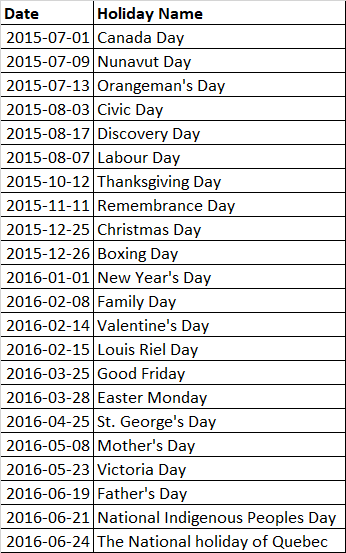

In [71]:
# Creating list of holidays
list_of_hoilday = ["2015-07-01","2015-07-09","2015-07-13","2015-08-03","2015-08-17","2015-08-07","2015-10-12","2015-11-11","2015-12-25","2015-12-26","2016-01-01","2016-02-08","2016-02-14","2016-02-15","2016-03-25","2016-03-28","2016-04-25","2016-05-08","2016-05-23","2016-06-19","2016-06-21","2016-06-24"]

# Creating new column holidays
consumer_elec_df["holiday"] = consumer_elec_df["o_date"].apply(lambda x : 1 if str(x)[:10] in list_of_hoilday else 0)

In [72]:
# Verifying the holiday column

consumer_elec_df[["o_date", "pay_date", "holiday"]][consumer_elec_df["holiday"]==1].head(10)

,o_date,pay_date,holiday
55,2015-10-12,0,1
77,2015-10-12,0,1
109,2015-10-12,0,1
119,2015-10-12,0,1
183,2015-10-12,0,1
184,2015-10-12,0,1
294,2015-10-12,0,1
334,2015-10-12,0,1
335,2015-10-12,0,1
336,2015-10-12,0,1


In [73]:
consumer_elec_df[consumer_elec_df['o_date'] == "2015-12-27"].iloc[0,-7:]

o_date         2015-12-27 00:00:00
o_time                    19:59:06
week                            52
day_of_week                      6
day                             27
pay_date                         0
holiday                          0
Name: 337640, dtype: object

In [74]:
# Display gmv data distribution

consumer_elec_df["gmv"].describe().apply(lambda x: format(x, 'f'))

count    1439226.000000
mean        2501.919194
std         5652.915512
min           10.000000
25%          349.000000
50%          797.000000
75%         1999.000000
max       226947.000000
Name: gmv, dtype: object

**As we can see that gmv value for 75% data is below 2000 we will list the products above 2000 as luxuary products.**

In [75]:
# Creating new column luxuary_product

consumer_elec_df["luxuary_product"] = consumer_elec_df["gmv"].apply(lambda x : 1 if x > 2000 else 0)

**GMV = Sales Price of products X No of products sold**

**Therefor, Sales Price = GMV / No of products**

In [76]:
# Creating a new column sales_price

consumer_elec_df.insert(7, "sales_price", consumer_elec_df["gmv"]/ consumer_elec_df["units"])

**Discount % = mrp price - sales price / mrp  price**

In [77]:
# Calculating a new column discount percentage

consumer_elec_df.insert(8, "discount", value = round(((consumer_elec_df["product_mrp"] - consumer_elec_df["sales_price"])/ consumer_elec_df["product_mrp"]*100),2))

In [78]:
consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17,0,0,1
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,6900.0,4.03,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,43,0,19,0,0,1
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,1990.0,5.19,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,43,1,20,0,0,0
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,42,2,14,0,0,0
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,1618.0,22.92,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,42,5,17,0,0,0


### Outlier Analysis

In [79]:
# Filtering the numerical columns

numeric_cols = consumer_elec_df.select_dtypes(include=np.number).columns
numeric_cols = numeric_cols[1:10]
numeric_cols

Index(['gmv', 'units', 'sales_price', 'discount', 'deliverybdays',
       'deliverycdays', 'sla', 'product_mrp', 'product_procurement_sla'],
      dtype='object')

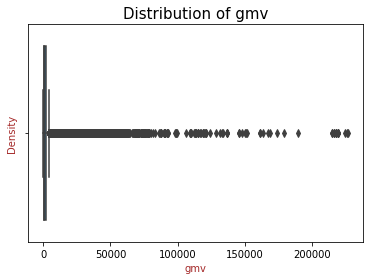

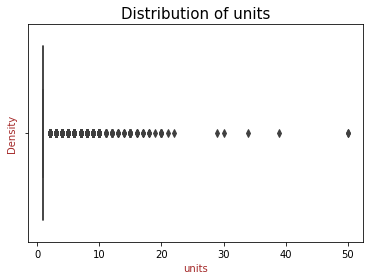

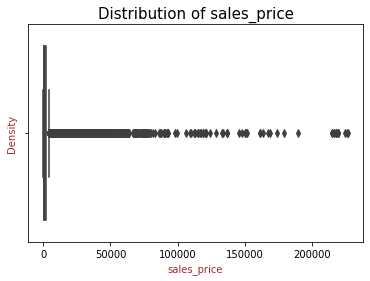

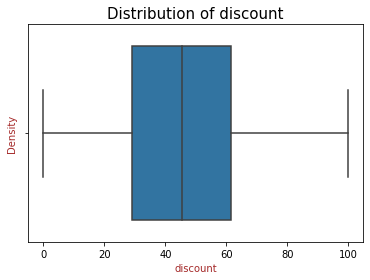

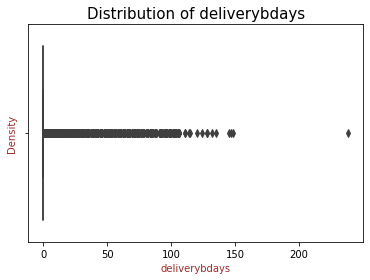

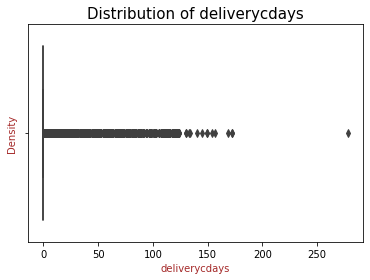

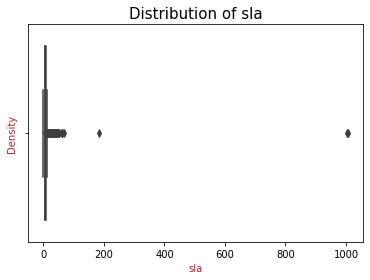

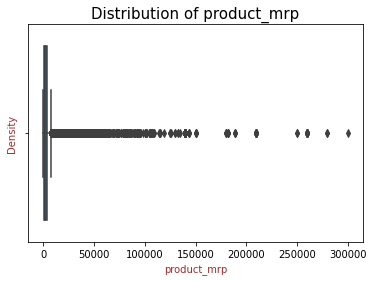

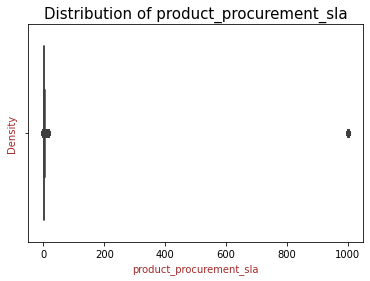

In [80]:
# Plotting a box plot

for col in numeric_cols:
  sns.boxplot(consumer_elec_df[col])
  plt.title("Distribution of "+str(col), {"fontsize":15, "fontweight":5, "color":"black"})
  plt.xlabel(col, fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.show()

**From above box plots we can see that all the columns except numeric variables are having outlier data.**

In [81]:
# Decribing the numeric column ditribution

consumer_elec_df[numeric_cols].describe(percentiles=[.25,.5,.75,.90,.95,.99]).apply(lambda s: s.apply('{0:.5f}'.format))

,gmv,units,sales_price,discount,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
count,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000
mean,2501.91919,1.02128,2469.00912,45.28916,1.03199,1.20194,5.74860,4271.54866,5.58290
std,5652.91551,0.25211,5570.78365,22.14466,2.48135,2.88934,2.99817,8710.14423,53.56984
min,10.00000,1.00000,10.00000,0.00000,0.00000,0.00000,0.00000,49.00000,0.00000
25%,349.00000,1.00000,349.00000,29.05000,0.00000,0.00000,4.00000,895.00000,2.00000
50%,797.00000,1.00000,782.00000,45.56000,0.00000,0.00000,6.00000,1700.00000,2.00000
75%,1999.00000,1.00000,1999.00000,61.58000,0.00000,0.00000,7.00000,3499.00000,3.00000
90%,4399.00000,1.00000,4300.00000,75.00000,5.00000,5.00000,9.00000,7490.00000,5.00000
95%,11699.00000,1.00000,11170.00000,81.35000,6.00000,7.00000,10.00000,18900.00000,5.00000
99%,30999.00000,2.00000,29990.00000,90.25000,8.00000,10.00000,13.00000,46500.00000,14.00000


In [82]:
# Caping the Outliers  to Upper and Lower quantile levels 

for col in numeric_cols:
    percentiles = consumer_elec_df[col].quantile([0.01, 0.99]).values
    consumer_elec_df[col][consumer_elec_df[col] <= percentiles[0]] = percentiles[0]
    consumer_elec_df[col][consumer_elec_df[col] >= percentiles[1]] = percentiles[1]

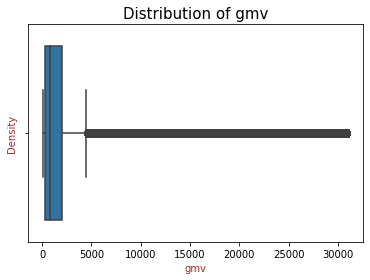

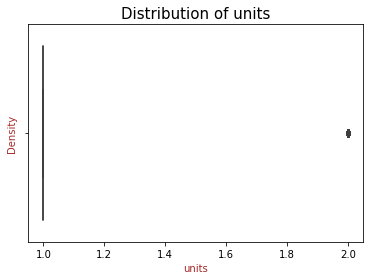

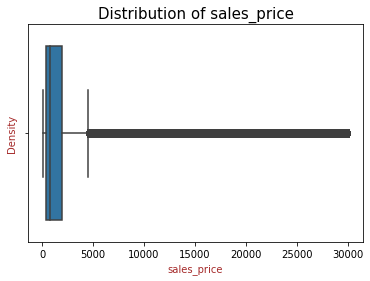

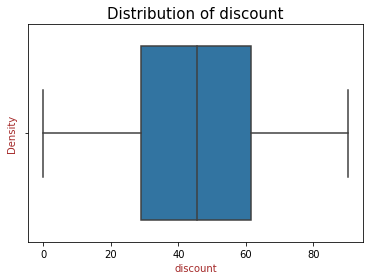

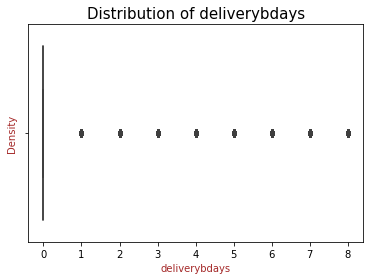

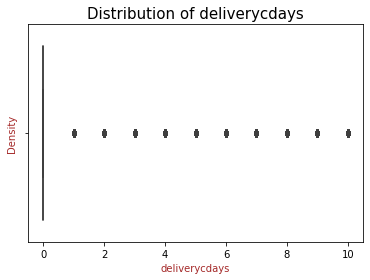

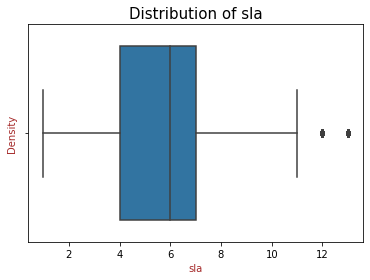

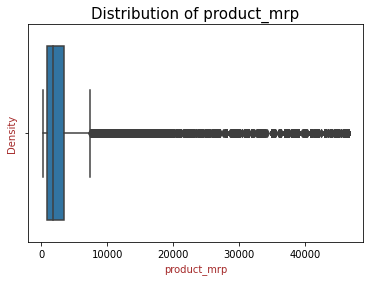

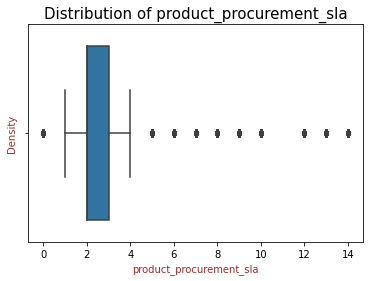

In [83]:
# Plotting a box plot

for col in numeric_cols:
  sns.boxplot(consumer_elec_df[col])
  plt.title("Distribution of "+str(col), {"fontsize":15, "fontweight":5, "color":"black"})
  plt.xlabel(col, fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.show()

In [84]:
# Re-checking the numeric column ditribution

consumer_elec_df[numeric_cols].describe(percentiles=[.25,.5,.75,.90,.95,.99]).apply(lambda s: s.apply('{0:.5f}'.format))

,gmv,units,sales_price,discount,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla
count,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000
mean,2442.07471,1.01432,2406.21395,45.24469,0.99359,1.16374,5.72826,4229.53077,2.72869
std,5217.08889,0.11879,5126.55352,22.04794,2.05938,2.41877,2.65898,8363.95008,1.85738
min,139.00000,1.00000,139.00000,0.00000,0.00000,0.00000,1.00000,299.00000,0.00000
25%,349.00000,1.00000,349.00000,29.05000,0.00000,0.00000,4.00000,895.00000,2.00000
50%,797.00000,1.00000,782.00000,45.56000,0.00000,0.00000,6.00000,1700.00000,2.00000
75%,1999.00000,1.00000,1999.00000,61.58000,0.00000,0.00000,7.00000,3499.00000,3.00000
90%,4399.00000,1.00000,4300.00000,75.00000,5.00000,5.00000,9.00000,7490.00000,5.00000
95%,11699.00000,1.00000,11170.00000,81.35000,6.00000,7.00000,10.00000,18900.00000,5.00000
99%,30999.00000,2.00000,29990.00000,90.25000,8.00000,10.00000,13.00000,46500.00000,14.00000


In [85]:
# Creating delivery status column

consumer_elec_df["delivery_time"] = consumer_elec_df["sla"] - (consumer_elec_df["deliverybdays"] + consumer_elec_df["deliverybdays"] + consumer_elec_df["product_procurement_sla"])

consumer_elec_df["delivery_status"] = consumer_elec_df["delivery_time"].apply(lambda x : "Delayed" if x<0 else ("On Time" if x==0 else "Early"))

In [86]:
consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17,0,0,1,5,Early
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,6900.0,4.03,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,43,0,19,0,0,1,7,Early
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,1990.0,5.19,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,43,1,20,0,0,0,7,Early
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,42,2,14,0,0,0,1,Early
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,1618.0,22.92,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,42,5,17,0,0,0,3,Early


In [87]:
# Saving the roecords having product_analytic_sub_category as CameraAccessory, GamingAccessory and HomeAudio

analysis_df = consumer_elec_df[(consumer_elec_df["product_analytic_sub_category"] == "CameraAccessory") | (consumer_elec_df["product_analytic_sub_category"] == "GamingAccessory") | (consumer_elec_df["product_analytic_sub_category"] == "HomeAudio")]

### Creating a week function

In [88]:


def WeekFinderFromYear(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)
            
        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [89]:
dict_number_2015, dict_name_2015 = WeekFinderFromYear(2015)
print(dict_number_2015)
print()
print(dict_name_2015)

print()

dict_number_2016, dict_name_2016 = WeekFinderFromYear(2016)
print(dict_number_2016)
print()
print(dict_name_2016)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}

{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}

{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27,

In [90]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

### Media Investment Cleaning

**Inspecting media Investment dataset.**

In [91]:
media_inv_df.shape

(16, 12)

In [92]:
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               12 non-null     float64
 1   Month              12 non-null     float64
 2   Total Investment   12 non-null     float64
 3   TV                 13 non-null     float64
 4   Digital            12 non-null     float64
 5   Sponsorship        12 non-null     float64
 6   Content Marketing  12 non-null     float64
 7   Online marketing   12 non-null     float64
 8    Affiliates        12 non-null     float64
 9   SEM                12 non-null     float64
 10  Radio              3 non-null      float64
 11  Other              3 non-null      float64
dtypes: float64(12)
memory usage: 1.6 KB


In [93]:
media_inv_df

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN
5,2015.0,12.0,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,NaN,NaN
6,2016.0,1.0,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000
7,2016.0,2.0,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN
8,2016.0,3.0,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545
9,2016.0,4.0,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,NaN,NaN


In [94]:
# Dropping the last four rows as they are junk records

media_inv_df = media_inv_df.iloc[:12]

In [95]:
# Converting the Year and Month column to categprical columns

media_inv_df[["Year", "Month"]] = media_inv_df[["Year", "Month"]].astype("int")

In [96]:
media_inv_df.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [97]:
# Checking the null values

media_inv_df.isnull().sum()

Year                 0
Month                0
Total Investment     0
TV                   0
Digital              0
Sponsorship          0
Content Marketing    0
Online marketing     0
 Affiliates          0
SEM                  0
Radio                9
Other                9
dtype: int64

**Column Radio and Other has null values present so we will be imputing them with 0.**

In [98]:
# Imputing the null values with 0

media_inv_df[["Radio", "Other"]] = media_inv_df[["Radio", "Other"]].replace(np.NaN, 0)

In [99]:
# Re-checking the null values

media_inv_df.isnull().sum()

Year                 0
Month                0
Total Investment     0
TV                   0
Digital              0
Sponsorship          0
Content Marketing    0
Online marketing     0
 Affiliates          0
SEM                  0
Radio                0
Other                0
dtype: int64

In [100]:
# Temp DataFrame

temp_media_inv_df = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

temp_media_inv_df.head(2)

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
# Creating weekly dataset for media investment using the dictionary created for 2015 and 2016

i = 0

for index, row in media_inv_df.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:
            
            temp_media_inv_df.iloc[i].Year = row.Year
            temp_media_inv_df.iloc[i].Month = row.Month
            temp_media_inv_df.iloc[i]['week'] = week
            temp_media_inv_df.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

    elif row.Year == 2016:
        
        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:
            
            temp_media_inv_df.iloc[i].Year = row.Year
            temp_media_inv_df.iloc[i].Month = row.Month
            temp_media_inv_df.iloc[i]['week'] = week
            temp_media_inv_df.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

temp_media_inv_df.head()

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [102]:
# Saving the temp created data in media investment dataset
media_inv_df = temp_media_inv_df

media_inv_df.head()

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [103]:
# Dropping Day and Date columns as they are no longer needed

media_inv_df.drop(columns=["Year", "Month"], axis=1, inplace=True)

In [104]:
media_inv_df.head()

,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [105]:
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   week               52 non-null     object
 1   Total Investment   52 non-null     object
 2   TV                 52 non-null     object
 3   Digital            52 non-null     object
 4   Sponsorship        52 non-null     object
 5   Content Marketing  52 non-null     object
 6   Online marketing   52 non-null     object
 7   Affiliates         52 non-null     object
 8   SEM                52 non-null     object
 9   Radio              52 non-null     object
 10  Other              52 non-null     object
dtypes: object(11)
memory usage: 4.6+ KB


In [106]:
# Converting the columns to numeric type

for col in media_inv_df.columns:
  media_inv_df[col] = media_inv_df[col].astype("float64")

media_inv_df["week"] = media_inv_df["week"].astype("int")
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   week               52 non-null     int64  
 1   Total Investment   52 non-null     float64
 2   TV                 52 non-null     float64
 3   Digital            52 non-null     float64
 4   Sponsorship        52 non-null     float64
 5   Content Marketing  52 non-null     float64
 6   Online marketing   52 non-null     float64
 7   Affiliates         52 non-null     float64
 8   SEM                52 non-null     float64
 9   Radio              52 non-null     float64
 10  Other              52 non-null     float64
dtypes: float64(10), int64(1)
memory usage: 4.6 KB


### NPS Cleaning

In [107]:
monthly_nps

,Scores,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


**As we can see the NPS dataset is in a monthly format we will be converting it into weekly format.**

In [108]:
# Taking the transpose of dataset 

monthly_nps = monthly_nps.T

In [109]:
# Adding index to new dataframe

monthly_nps.reset_index(drop=False, inplace=True)

In [110]:
# Dropping the first row and re-naming the columns

monthly_nps.drop(monthly_nps.index[0], inplace=True)

monthly_nps.columns = ['Month', 'NPS', 'Stock Index']

In [111]:
# Creating a temporary dataframe

temp_monthly_nps = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'week', 'NPS', 'Stock Index'])

temp_monthly_nps.head(1)

,Year,Month,week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN


In [112]:
# Creating weekly data from NPS using the dictionary created for 2015 and 2016

i = 0

for index, row in monthly_nps.iterrows():

    if '15' in row['Month']:
        
        month = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2015[month]:        
            
            temp_monthly_nps.iloc[i].Year = 2015
            temp_monthly_nps.iloc[i].Month = month
            temp_monthly_nps.iloc[i].week = week
            temp_monthly_nps.iloc[i].NPS = row['NPS']
            temp_monthly_nps.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1
        
    elif '16' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2016[month]:        
            
            temp_monthly_nps.iloc[i].Year = 2016
            temp_monthly_nps.iloc[i].Month = month
            temp_monthly_nps.iloc[i].week = week
            temp_monthly_nps.iloc[i].NPS = row['NPS']
            temp_monthly_nps.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1

temp_monthly_nps.head()

,Year,Month,week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [113]:
# Storing the temporary data into monthly_nps

monthly_nps = temp_monthly_nps
monthly_nps.head()

,Year,Month,week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [114]:
# Dropping Day and Date columns as they are no longer needed

monthly_nps.drop(columns=["Year", "Month"], axis=1, inplace=True)

In [115]:
monthly_nps.head()

,week,NPS,Stock Index
0,28,54.599588,1177.0
1,29,54.599588,1177.0
2,30,54.599588,1177.0
3,31,54.599588,1177.0
4,32,59.987101,1206.0


In [116]:
monthly_nps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   week         52 non-null     object
 1   NPS          52 non-null     object
 2   Stock Index  52 non-null     object
dtypes: object(3)
memory usage: 1.3+ KB


In [117]:
# Converting the columns to numeric type

for col in monthly_nps.columns:
  monthly_nps[col] = monthly_nps[col].astype("float64")

monthly_nps["week"] = monthly_nps["week"].astype("int")
monthly_nps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   week         52 non-null     int64  
 1   NPS          52 non-null     float64
 2   Stock Index  52 non-null     float64
dtypes: float64(2), int64(1)
memory usage: 1.3 KB


### Sales data cleaning

In [118]:
spc_sale_calendar

,Sale_year,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [119]:
# Converting the column year to int

spc_sale_calendar["Sale_year"] = spc_sale_calendar["Sale_year"].astype("int")

In [120]:
# Separating the dataframe for 2015, 2015-2016 and 2016

spc_sale_calendar_15 = spc_sale_calendar.iloc[:5]
spc_sale_calendar_1516 = spc_sale_calendar.iloc[5]
spc_sale_calendar_16 = spc_sale_calendar.iloc[6:]

In [121]:
# Removing the paranthesis from Sales Calendar column
spc_sale_calendar_15["Sales Calendar"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: (x.lstrip(" (")).rstrip(")"))

# Storing the start date day
spc_sale_calendar_15["start_date"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: x.split("-")[0])

# Storing the end date day
spc_sale_calendar_15["end_date"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: x.split("-")[1][:2])

In [122]:
# Creating a new column Month
spc_sale_calendar_15["Month"] = spc_sale_calendar_15["Sales Calendar"].apply(lambda x: x[-4:].strip())

spc_sale_calendar_15["Month"] = spc_sale_calendar_15["Month"].apply(lambda x: list(calendar.month_abbr).index(x[:3]))

In [123]:
# Creating column start date
spc_sale_calendar_15["start_date"] = spc_sale_calendar_15["Sale_year"].astype("str") + "-" + spc_sale_calendar_15["Month"].astype("str") + "-" + spc_sale_calendar_15["start_date"].astype("str")

# Creating column end date
spc_sale_calendar_15["end_date"] = spc_sale_calendar_15["Sale_year"].astype("str") + "-" + spc_sale_calendar_15["Month"].astype("str") + "-" + spc_sale_calendar_15["end_date"].astype("str")

In [124]:
spc_sale_calendar_15

,Sale_year,Sales Calendar,start_date,end_date,Month
0,2015,18-19th July,2015-7-18,2015-7-19,7
1,2015,15-17th Aug,2015-8-15,2015-8-17,8
2,2015,28-30th Aug,2015-8-28,2015-8-30,8
3,2015,15-17th Oct,2015-10-15,2015-10-17,10
4,2015,7-14th Nov,2015-11-7,2015-11-14,11


In [125]:
# Removing the paranthesis from Sales Calendar column
spc_sale_calendar_16["Sales Calendar"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: (x.lstrip(" (")).rstrip(")"))

# Storing the start date day
spc_sale_calendar_16["start_date"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: x.split("-")[0])

# Storing the end date day
spc_sale_calendar_16["end_date"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: x.split("-")[1][:2])

In [126]:
# Creating a new column Month
spc_sale_calendar_16["Month"] = spc_sale_calendar_16["Sales Calendar"].apply(lambda x: x[-4:].strip())

spc_sale_calendar_16["Month"] = spc_sale_calendar_16["Month"].apply(lambda x: list(calendar.month_abbr).index(x[:3]))

In [127]:
# Creating column start date
spc_sale_calendar_16["start_date"] = spc_sale_calendar_16["Sale_year"].astype("str") + "-" + spc_sale_calendar_16["Month"].astype("str") + "-" + spc_sale_calendar_16["start_date"].astype("str")

# Creating column end date
spc_sale_calendar_16["end_date"] = spc_sale_calendar_16["Sale_year"].astype("str") + "-" + spc_sale_calendar_16["Month"].astype("str") + "-" + spc_sale_calendar_16["end_date"].astype("str")

In [128]:
spc_sale_calendar_16

,Sale_year,Sales Calendar,start_date,end_date,Month
6,2016,20-22 Jan,2016-1-20,2016-1-22,1
7,2016,1-2 Feb,2016-2-1,2016-2-2,2
8,2016,20-21 Feb,2016-2-20,2016-2-21,2
9,2016,14-15 Feb,2016-2-14,2016-2-15,2
10,2016,7-9 Mar,2016-3-7,2016-3-9,3
11,2016,25-27 May,2016-5-25,2016-5-27,5


In [129]:
# Inserting 2015-2016 row data
spc_sale_calendar = pd.concat([spc_sale_calendar_15, spc_sale_calendar_16], axis = 0)

In [130]:
# Concatenating the datasets
spc_sale_calendar = pd.DataFrame(np.insert(spc_sale_calendar.values, 5, values=[2015, "(25th Dec'15 - 3rd Jan'16)", "2015-12-15", "2016-1-3", 12], axis=0))

In [131]:
# Adding column names

spc_sale_calendar.columns = ["Sale_year", "Sales Calendar", "start_date", "end_date", "Month"]

In [132]:
# Converting the date columns to date type

spc_sale_calendar["start_date"] = pd.to_datetime(spc_sale_calendar["start_date"])

spc_sale_calendar["end_date"] = pd.to_datetime(spc_sale_calendar["end_date"])

In [133]:
# Creating start week 

spc_sale_calendar["start_week"] = spc_sale_calendar["start_date"].dt.week

In [134]:
# Calculating number of sale days

spc_sale_calendar["no_of_days"] = (spc_sale_calendar["end_date"] - spc_sale_calendar["start_date"])

spc_sale_calendar["no_of_days"] = spc_sale_calendar["no_of_days"].dt.days + 1

In [135]:
# Keeping only week and no of sale days column as final dataframe

spc_sale_calendar = spc_sale_calendar[["start_week", "no_of_days"]]
spc_sale_calendar.rename(columns={"start_week":"week", "no_of_days":"sale_days"}, inplace=True)

spc_sale_calendar

,week,sale_days
0,29,2
1,33,3
2,35,3
3,42,3
4,45,8
5,51,20
6,3,3
7,5,2
8,7,2
9,6,2


In [136]:
spc_sale_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   week       12 non-null     int64
 1   sale_days  12 non-null     int64
dtypes: int64(2)
memory usage: 320.0 bytes


### Climate 2015 data cleaning

In [137]:
ontario_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015.0,1.0,1.0,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015.0,1.0,2.0,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015.0,1.0,3.0,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015.0,1.0,4.0,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015.0,1.0,5.0,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [138]:
ontario_2015.shape

(365, 27)

In [139]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    float64       
 2   Month                      365 non-null    float64       
 3   Day                        365 non-null    float64       
 4   Data Quality               229 non-null    object        
 5   Max Temp (°C)              216 non-null    float64       
 6   Max Temp Flag              13 non-null     object        
 7   Min Temp (°C)              190 non-null    float64       
 8   Min Temp Flag              39 non-null     object        
 9   Mean Temp (°C)             190 non-null    float64       
 10  Mean Temp Flag             39 non-null     object        
 11  Heat Deg Days (°C)         190 non-null    float64       
 12  Heat Deg

In [140]:
# Inspecting the value counts
single_value_cols = []

for col in ontario_2015.columns:
  if ontario_2015[col].nunique() ==1:
    print(ontario_2015[col].value_counts())
    print("---------------------------------------------")
    single_value_cols.append(col)

single_value_cols.remove("Year")

2015.0    365
Name: Year, dtype: int64
---------------------------------------------
†    229
Name: Data Quality, dtype: int64
---------------------------------------------
M    13
Name: Max Temp Flag, dtype: int64
---------------------------------------------
M    39
Name: Min Temp Flag, dtype: int64
---------------------------------------------
M    39
Name: Mean Temp Flag, dtype: int64
---------------------------------------------
M    39
Name: Heat Deg Days Flag, dtype: int64
---------------------------------------------
M    39
Name: Cool Deg Days Flag, dtype: int64
---------------------------------------------
T    7
Name: Total Rain Flag, dtype: int64
---------------------------------------------
T    9
Name: Total Snow Flag, dtype: int64
---------------------------------------------
T    12
Name: Total Precip Flag, dtype: int64
---------------------------------------------
T    2
Name: Snow on Grnd Flag, dtype: int64
---------------------------------------------


In [141]:
# Dropping the columns having signle unique value 

ontario_2015.drop(columns=single_value_cols, inplace=True)

In [142]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    float64       
 2   Month                      365 non-null    float64       
 3   Day                        365 non-null    float64       
 4   Max Temp (°C)              216 non-null    float64       
 5   Min Temp (°C)              190 non-null    float64       
 6   Mean Temp (°C)             190 non-null    float64       
 7   Heat Deg Days (°C)         190 non-null    float64       
 8   Cool Deg Days (°C)         190 non-null    float64       
 9   Total Rain (mm)            229 non-null    float64       
 10  Total Snow (cm)            229 non-null    float64       
 11  Total Precip (mm)          229 non-null    float64       
 12  Snow on 

In [143]:
# Checking the null value percentage 

round(ontario_2015.isnull().sum()/ ontario_2015.shape[0] * 100, 2)

Date/Time                      0.00
Year                           0.00
Month                          0.00
Day                            0.00
Max Temp (°C)                 40.82
Min Temp (°C)                 47.95
Mean Temp (°C)                47.95
Heat Deg Days (°C)            47.95
Cool Deg Days (°C)            47.95
Total Rain (mm)               37.26
Total Snow (cm)               37.26
Total Precip (mm)             37.26
Snow on Grnd (cm)             37.26
Dir of Max Gust (10s deg)    100.00
Dir of Max Gust Flag         100.00
Spd of Max Gust (km/h)       100.00
Spd of Max Gust Flag         100.00
dtype: float64

In [144]:
# Dropping the columns having all null values

ontario_2015.drop(columns=["Dir of Max Gust (10s deg)", "Dir of Max Gust Flag", "Spd of Max Gust (km/h)", "Spd of Max Gust Flag"], inplace=True)

In [145]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           365 non-null    datetime64[ns]
 1   Year                365 non-null    float64       
 2   Month               365 non-null    float64       
 3   Day                 365 non-null    float64       
 4   Max Temp (°C)       216 non-null    float64       
 5   Min Temp (°C)       190 non-null    float64       
 6   Mean Temp (°C)      190 non-null    float64       
 7   Heat Deg Days (°C)  190 non-null    float64       
 8   Cool Deg Days (°C)  190 non-null    float64       
 9   Total Rain (mm)     229 non-null    float64       
 10  Total Snow (cm)     229 non-null    float64       
 11  Total Precip (mm)   229 non-null    float64       
 12  Snow on Grnd (cm)   229 non-null    float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 37

In [146]:
# Dropping rows where all the columns are having null value

ontario_2015 = ontario_2015.dropna(how="all")

In [147]:
# Creating anew column week

ontario_2015["week"] = ontario_2015["Date/Time"].dt.week

In [148]:
# Filtering records from July to Dec 

ontario_2015 = ontario_2015[ontario_2015["Month"] >= 7]
ontario_2015.reset_index(drop=True, inplace=True)

ontario_2015.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2015-07-01,2015.0,7.0,1.0,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27
1,2015-07-02,2015.0,7.0,2.0,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0,27
2,2015-07-03,2015.0,7.0,3.0,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,27
3,2015-07-04,2015.0,7.0,4.0,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0,27
4,2015-07-05,2015.0,7.0,5.0,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,27


In [149]:
print("Min Month : ", ontario_2015["Month"].min())
print("Max Month : ", ontario_2015["Month"].max())

Min Month :  7.0
Max Month :  12.0


In [150]:
# Sorting the values by week

ontario_2015.sort_values(by=['week'], ascending = True, inplace = True)

In [151]:
ontario_2015.head(1)

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2015-07-01,2015.0,7.0,1.0,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27


In [152]:
# Creating a weekly data

ontario_2015 = ontario_2015.groupby(['week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

ontario_2015.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,28.0,10.0,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [153]:
# Dropping 27th week data as it belongs to June 2015

ontario_2015.drop(ontario_2015[ontario_2015['week'] == 27].index, inplace = True)

In [154]:
# Checking the null value percentage 

round(ontario_2015.isnull().sum()/ ontario_2015.shape[0] * 100, 2)

week                  0.0
Max Temp (°C)         0.0
Min Temp (°C)         0.0
Mean Temp (°C)        0.0
Heat Deg Days (°C)    0.0
Cool Deg Days (°C)    0.0
Total Rain (mm)       0.0
Total Snow (cm)       0.0
Total Precip (mm)     0.0
Snow on Grnd (cm)     0.0
dtype: float64

**Nowe the dataset has no null values and is created with weekly data**

### Cilmate 2016 data cleaning

In [155]:
ontario_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [156]:
ontario_2016.shape

(366, 27)

In [157]:
ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  366 non-null    datetime64[ns]
 1   Year                       366 non-null    float64       
 2   Month                      366 non-null    float64       
 3   Day                        366 non-null    float64       
 4   Data Quality               227 non-null    object        
 5   Max Temp (°C)              226 non-null    float64       
 6   Max Temp Flag              1 non-null      object        
 7   Min Temp (°C)              219 non-null    float64       
 8   Min Temp Flag              8 non-null      object        
 9   Mean Temp (°C)             219 non-null    float64       
 10  Mean Temp Flag             8 non-null      object        
 11  Heat Deg Days (°C)         219 non-null    float64       
 12  Heat Deg

In [158]:
# Inspecting the value counts
single_value_cols = []

for col in ontario_2016.columns:
  if ontario_2016[col].nunique() ==1:
    print(ontario_2016[col].value_counts())
    print("---------------------------------------------")
    single_value_cols.append(col)

single_value_cols.remove("Year")

2016.0    366
Name: Year, dtype: int64
---------------------------------------------
†    227
Name: Data Quality, dtype: int64
---------------------------------------------
M    1
Name: Max Temp Flag, dtype: int64
---------------------------------------------
M    8
Name: Min Temp Flag, dtype: int64
---------------------------------------------
M    8
Name: Mean Temp Flag, dtype: int64
---------------------------------------------
M    8
Name: Heat Deg Days Flag, dtype: int64
---------------------------------------------
M    8
Name: Cool Deg Days Flag, dtype: int64
---------------------------------------------
T    3
Name: Total Rain Flag, dtype: int64
---------------------------------------------
T    7
Name: Total Snow Flag, dtype: int64
---------------------------------------------
T    7
Name: Total Precip Flag, dtype: int64
---------------------------------------------
T    6
Name: Snow on Grnd Flag, dtype: int64
---------------------------------------------


In [159]:
# Dropping the columns having signle unique value 

ontario_2016.drop(columns=single_value_cols, inplace=True)

In [160]:
ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  366 non-null    datetime64[ns]
 1   Year                       366 non-null    float64       
 2   Month                      366 non-null    float64       
 3   Day                        366 non-null    float64       
 4   Max Temp (°C)              226 non-null    float64       
 5   Min Temp (°C)              219 non-null    float64       
 6   Mean Temp (°C)             219 non-null    float64       
 7   Heat Deg Days (°C)         219 non-null    float64       
 8   Cool Deg Days (°C)         219 non-null    float64       
 9   Total Rain (mm)            227 non-null    float64       
 10  Total Snow (cm)            227 non-null    float64       
 11  Total Precip (mm)          227 non-null    float64       
 12  Snow on 

In [161]:
# Checking the null value percentage 

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

Date/Time                      0.00
Year                           0.00
Month                          0.00
Day                            0.00
Max Temp (°C)                 38.25
Min Temp (°C)                 40.16
Mean Temp (°C)                40.16
Heat Deg Days (°C)            40.16
Cool Deg Days (°C)            40.16
Total Rain (mm)               37.98
Total Snow (cm)               37.98
Total Precip (mm)             37.98
Snow on Grnd (cm)             37.98
Dir of Max Gust (10s deg)    100.00
Dir of Max Gust Flag         100.00
Spd of Max Gust (km/h)       100.00
Spd of Max Gust Flag         100.00
dtype: float64

In [162]:
# Dropping the columns having all null values

ontario_2016.drop(columns=["Dir of Max Gust (10s deg)", "Dir of Max Gust Flag", "Spd of Max Gust (km/h)", "Spd of Max Gust Flag"], inplace=True)

In [163]:
ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           366 non-null    datetime64[ns]
 1   Year                366 non-null    float64       
 2   Month               366 non-null    float64       
 3   Day                 366 non-null    float64       
 4   Max Temp (°C)       226 non-null    float64       
 5   Min Temp (°C)       219 non-null    float64       
 6   Mean Temp (°C)      219 non-null    float64       
 7   Heat Deg Days (°C)  219 non-null    float64       
 8   Cool Deg Days (°C)  219 non-null    float64       
 9   Total Rain (mm)     227 non-null    float64       
 10  Total Snow (cm)     227 non-null    float64       
 11  Total Precip (mm)   227 non-null    float64       
 12  Snow on Grnd (cm)   227 non-null    float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 37

In [164]:
# Dropping rows where all the columns are having null value

ontario_2016 = ontario_2016.dropna(how="all")

In [165]:
# Checking the null value percentage 

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

Date/Time              0.00
Year                   0.00
Month                  0.00
Day                    0.00
Max Temp (°C)         38.25
Min Temp (°C)         40.16
Mean Temp (°C)        40.16
Heat Deg Days (°C)    40.16
Cool Deg Days (°C)    40.16
Total Rain (mm)       37.98
Total Snow (cm)       37.98
Total Precip (mm)     37.98
Snow on Grnd (cm)     37.98
dtype: float64

In [166]:
ontario_2016.dropna(inplace=True)

In [167]:
# Checking the null value percentage 

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

Date/Time             0.0
Year                  0.0
Month                 0.0
Day                   0.0
Max Temp (°C)         0.0
Min Temp (°C)         0.0
Mean Temp (°C)        0.0
Heat Deg Days (°C)    0.0
Cool Deg Days (°C)    0.0
Total Rain (mm)       0.0
Total Snow (cm)       0.0
Total Precip (mm)     0.0
Snow on Grnd (cm)     0.0
dtype: float64

In [168]:
# Creating anew column week

ontario_2016["week"] = ontario_2016["Date/Time"].dt.week

In [169]:
# Filtering records from July to Dec 

ontario_2016 = ontario_2016[ontario_2016["Month"] <= 6]
ontario_2016.reset_index(drop=True, inplace=True)

ontario_2016.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2016-01-08,2016.0,1.0,8.0,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016.0,1.0,9.0,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016.0,1.0,10.0,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016.0,1.0,12.0,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016.0,1.0,14.0,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [170]:
print("Min Month : ", ontario_2016["Month"].min())
print("Max Month : ", ontario_2016["Month"].max())

Min Month :  1.0
Max Month :  6.0


In [171]:
# Sorting the values by week

ontario_2016.sort_values(by=['week'], ascending = True, inplace = True)

In [172]:
# Creating a weekly data

ontario_2016 = ontario_2016.groupby(['week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

ontario_2016.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
1,2,4.5,-12.0,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333
2,4,5.5,-9.0,-1.800000,19.800000,0.0,0.000000,0.000000,0.000000,0.000000
3,5,13.0,-5.5,3.200000,14.800000,0.0,3.400000,0.000000,3.400000,0.000000
4,6,5.0,-18.0,-7.266667,25.266667,0.0,0.000000,2.666667,2.666667,2.000000


In [173]:
ontario_2015.shape

(26, 10)

**Now our dataset is clean and created with weekly data. So we will be concatenating the 2015 and 2016 climate datasets.**

In [174]:
climate_2015_2016 = pd.concat([ontario_2015, ontario_2016], axis =0)

In [175]:
climate_2015_2016.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0
5,32,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.0,0.280000,0.0


In [176]:
climate_2015_2016.shape

(51, 10)

### Data Preparation - Creating dataframes for three different categories

**You have to create market mix models for three product subcategories: Camera Accessory, Home Audio, and Gaming Accessory. We will be creating separate dataframes for them.**

In [177]:
consumer_elec_df.shape

(1439226, 30)

In [178]:
consumer_elec_df.head()

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17,0,0,1,5,Early
1,ACCCX3S58G7B5F6P,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,6900.0,4.03,0,0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,43,0,19,0,0,1,7,Early
2,ACCCX3S5AHMF55FV,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,1990.0,5.19,0,0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,43,1,20,0,0,0,7,Early
3,ACCCX3S5AHMF55FV,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,42,2,14,0,0,0,1,Early
4,ACCCX3S5AHMF55FV,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,1618.0,22.92,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,42,5,17,0,0,0,3,Early


In [179]:
# Dropping some column that are in significant for the analysis

consumer_elec_df.drop(columns=["fsn_id", "order_id", "order_item_id", "cust_id"], inplace=True)

In [180]:
consumer_elec_df.head()

,Year,Month,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,2015,10,6400.0,1,6400.0,10.99,0,0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17,0,0,1,5,Early
1,2015,10,6900.0,1,6900.0,4.03,0,0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-19,10:07:22,43,0,19,0,0,1,7,Early
2,2015,10,1990.0,1,1990.0,5.19,0,0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-20,15:45:56,43,1,20,0,0,0,7,Early
3,2015,10,1690.0,1,1690.0,19.49,0,0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-14,12:05:15,42,2,14,0,0,0,1,Early
4,2015,10,1618.0,1,1618.0,22.92,0,0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099,3,2015-10-17,21:25:03,42,5,17,0,0,0,3,Early


In [181]:
# Creating a binary variable from order_payment_type
consumer_elec_df["cod"] = consumer_elec_df["order_payment_type"].apply(lambda x: 1 if x == "COD" else 0)

# Dropping column order_payment_type
consumer_elec_df.drop(columns="order_payment_type", axis=1, inplace=True)

In [182]:
# Performing dummy encoding on categorical variable

proddummy_df = pd.get_dummies(consumer_elec_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
proddummy_df.head()

,product_vertical_AudioMP3Player,product_vertical_Binoculars,product_vertical_BoomBox,product_vertical_Camcorders,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_CodeInTheBoxGame,product_vertical_CoolingPad,product_vertical_DJController,product_vertical_DSLR,product_vertical_Dock,product_vertical_DockingStation,product_vertical_ExtensionTube,product_vertical_FMRadio,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_Instant Cameras,product_vertical_JoystickGamingWheel,product_vertical_KaraokePlayer,product_vertical_LaptopSpeaker,product_vertical_Lens,product_vertical_Microphone,product_vertical_MicrophoneAccessory,product_vertical_MobileSpeaker,product_vertical_MotionController,product_vertical_PhysicalGame,product_vertical_Point & Shoot,product_vertical_ReflectorUmbrella,product_vertical_RemoteControl,product_vertical_SelectorBox,product_vertical_SlingBox,product_vertical_Softbox,product_vertical_SoundMixer,product_vertical_SportsAndAction,product_vertical_Strap,product_vertical_TVOutCableAccessory,product_vertical_Teleconverter,product_vertical_Telescope,product_vertical_VideoGlasses,product_vertical_VideoPlayer,product_vertical_VoiceRecorder,product_vertical_\N
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [183]:
# Performing dummy encoding on categorical variable

delydummy_df = pd.get_dummies(consumer_elec_df[['delivery_status']], prefix='delivery_status', drop_first=True)
delydummy_df.head()

,delivery_status_Early,delivery_status_On Time
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0


In [184]:
# Concatenating the dummy variables with consumer dataset
consumer_elec_df = pd.concat([consumer_elec_df, proddummy_df, delydummy_df], axis=1)


# Dropping the columns from consumer_elec_df that have been encoded
consumer_elec_df.drop(columns = ["product_analytic_vertical", "delivery_status"], axis=1, inplace=True)

In [185]:
# Checking the values of product_analytic_sub_category column

consumer_elec_df["product_analytic_sub_category"].value_counts()

Speaker                461168
CameraAccessory        212100
GamingAccessory        182353
TVVideoSmall           131970
HomeAudio              106134
AudioMP3Player         102731
Game                    95572
Camera                  87163
GamingConsole           26336
CameraStorage           16375
AudioAccessory           9623
HomeTheatre              4174
AmplifierReceiver        3430
GameMembershipCards        97
Name: product_analytic_sub_category, dtype: int64

In [186]:
# Creating a new datafraem for cameraaccessory

camera_accessory = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='CameraAccessory']

In [187]:
# Creating a new dataframe for gamingaccessory

gaming_accessory = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='GamingAccessory']

In [188]:
# Creating anew dataframe for homeaudio

home_audio = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='HomeAudio']

In [189]:
# Inspecting the value counts of product_analytic_category and product_analytic_sub_category column for all three dataframes

cat_cols = ["product_analytic_category",	"product_analytic_sub_category"]

for col in cat_cols:
  print("camera_accessory")
  print(camera_accessory[col].value_counts())
  print("-----------------------------------")

for col in cat_cols:
  print("gaming_accessory")
  print(gaming_accessory[col].value_counts())
  print("-----------------------------------")

for col in cat_cols:
  print("home_audio")
  print(home_audio[col].value_counts())
  print("-----------------------------------")

camera_accessory
CameraAccessory    212100
Name: product_analytic_category, dtype: int64
-----------------------------------
camera_accessory
CameraAccessory    212100
Name: product_analytic_sub_category, dtype: int64
-----------------------------------
gaming_accessory
GamingHardware    182353
Name: product_analytic_category, dtype: int64
-----------------------------------
gaming_accessory
GamingAccessory    182353
Name: product_analytic_sub_category, dtype: int64
-----------------------------------
home_audio
EntertainmentSmall    106134
Name: product_analytic_category, dtype: int64
-----------------------------------
home_audio
HomeAudio    106134
Name: product_analytic_sub_category, dtype: int64
-----------------------------------


In [190]:
# Dropping Columns which are insignificant to the analysis

drop_columns = ["product_analytic_category", "product_analytic_sub_category"]

camera_accessory.drop(drop_columns, axis=1, inplace=True)
gaming_accessory.drop(drop_columns, axis=1, inplace=True)
home_audio.drop(drop_columns, axis=1, inplace=True)

In [191]:
camera_accessory.head(1)

,Year,Month,gmv,units,sales_price,discount,deliverybdays,deliverycdays,sla,pincode,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_Binoculars,product_vertical_BoomBox,product_vertical_Camcorders,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_CodeInTheBoxGame,product_vertical_CoolingPad,product_vertical_DJController,product_vertical_DSLR,product_vertical_Dock,product_vertical_DockingStation,product_vertical_ExtensionTube,product_vertical_FMRadio,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_Instant Cameras,product_vertical_JoystickGamingWheel,product_vertical_KaraokePlayer,product_vertical_LaptopSpeaker,product_vertical_Lens,product_vertical_Microphone,product_vertical_MicrophoneAccessory,product_vertical_MobileSpeaker,product_vertical_MotionController,product_vertical_PhysicalGame,product_vertical_Point & Shoot,product_vertical_ReflectorUmbrella,product_vertical_RemoteControl,product_vertical_SelectorBox,product_vertical_SlingBox,product_vertical_Softbox,product_vertical_SoundMixer,product_vertical_SportsAndAction,product_vertical_Strap,product_vertical_TVOutCableAccessory,product_vertical_Teleconverter,product_vertical_Telescope,product_vertical_VideoGlasses,product_vertical_VideoPlayer,product_vertical_VoiceRecorder,product_vertical_\N,delivery_status_Early,delivery_status_On Time
0,2015,10,6400.0,1,6400.0,10.99,0,0,5,-7.79175582905735E+018,7190,0,2015-10-17,15:11:54,42,5,17,0,0,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [192]:
# Creating weekly camera accessories data

camera_accessory_df = camera_accessory.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sales_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','luxuary_product':'sum', 'delivery_time':'sum', \
                                          'cod':"sum",
                                          'product_vertical_CameraAccessory':'sum', 'product_vertical_CameraBag':'sum','product_vertical_CameraBattery':'sum',\
                                          'product_vertical_CameraBatteryCharger':'sum','product_vertical_CameraBatteryGrip':'sum', \
                                          'product_vertical_CameraEyeCup':'sum','product_vertical_CameraFilmRolls':'sum','product_vertical_CameraHousing':'sum', \
                                          'product_vertical_CameraMicrophone':'sum','product_vertical_CameraMount':'sum','product_vertical_CameraRemoteControl':'sum', \
                                          'product_vertical_CameraStorageMemoryCard':'sum', 'product_vertical_CameraTripod':'sum','product_vertical_DSLR':'sum', \
                                          'product_vertical_ExtensionTube':'sum','product_vertical_Filter':'sum','product_vertical_Flash':'sum','product_vertical_FlashShoeAdapter':'sum', \
                                          'product_vertical_Instant Cameras':'sum','product_vertical_Lens':'sum','product_vertical_ReflectorUmbrella':'sum',\
                                          'product_vertical_Softbox':'sum','product_vertical_Strap':'sum','product_vertical_Teleconverter':'sum','product_vertical_Teleconverter':'sum',\
                                          'product_vertical_Telescope':'sum','delivery_status_Early':'sum','delivery_status_On Time':'sum'}).reset_index(drop=False)
camera_accessory_df.shape

(51, 42)

In [193]:
# Creating weekly gaming accessories data

gaming_accessory_df = gaming_accessory.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sales_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','luxuary_product':'sum', 'delivery_time':'sum', \
                                          'cod':"sum",
                                          'product_vertical_GameControlMount':'sum','product_vertical_GamePad':'sum','product_vertical_GameValueCards':'sum','product_vertical_GamingAccessoryKit':'sum', \
                                          'product_vertical_GamingAdapter':'sum','product_vertical_GamingChargingStation':'sum','product_vertical_GamingConsole':'sum','product_vertical_GamingHeadset':'sum',\
                                          'product_vertical_GamingKeyboard':'sum','product_vertical_GamingMemoryCard':'sum','product_vertical_GamingMouse':'sum','product_vertical_GamingMousePad':'sum',\
                                          'product_vertical_GamingSpeaker':'sum','product_vertical_HandheldGamingConsole':'sum','product_vertical_JoystickGamingWheel':'sum','product_vertical_PhysicalGame':'sum',\
                                          'delivery_status_Early':'sum','delivery_status_On Time':'sum'}).reset_index(drop=False)
gaming_accessory_df.shape

(52, 33)

In [194]:
# Creating weekly home audio accessories data

home_audio_df = home_audio.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sales_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','luxuary_product':'sum', 'delivery_time':'sum', \
                                          'cod':"sum",\
                                          'product_vertical_AudioMP3Player':'sum','product_vertical_BoomBox':'sum','product_vertical_Dock':'sum',\
                                          'product_vertical_DockingStation':'sum','product_vertical_FMRadio':'sum','product_vertical_HiFiSystem':'sum',\
                                          'product_vertical_HomeAudioSpeaker':'sum','product_vertical_HomeTheatre':'sum','product_vertical_KaraokePlayer':'sum',\
                                          'product_vertical_SlingBox':'sum','product_vertical_SoundMixer':'sum','product_vertical_VoiceRecorder':'sum',\
                                          'delivery_status_Early':'sum','delivery_status_On Time':'sum'}).reset_index(drop=False)
home_audio_df.shape

(49, 29)

In [195]:
# Creating pay_date_week

camera_accessory_df['pay_date_week'] = camera_accessory_df['pay_date'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['pay_date_week'] = gaming_accessory_df['pay_date'].apply(lambda x:1 if x > 0 else 0)
home_audio_df['pay_date_week'] = home_audio_df['pay_date'].apply(lambda x:1 if x > 0 else 0)

In [196]:
# Creating holiday_week

camera_accessory_df['holiday_week'] = camera_accessory_df['holiday'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['holiday_week'] = gaming_accessory_df['holiday'].apply(lambda x:1 if x > 0 else 0)
home_audio_df['holiday_week'] = home_audio_df['holiday'].apply(lambda x:1 if x > 0 else 0)

In [197]:
camera_accessory_df.head()

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,pay_date,holiday,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week
0,1,4864060.0,5259,925.056673,50.238925,1761.009284,0.000000,0.000000,5.863830,2.879497,0,0,398,15429,4198,43,276.0,524.0,248.0,3,3,31,0,0,29,87.0,0,775.0,0,2,211.0,2021.0,0,0,618.0,0,0,26,0,31,4024.0,454.0,0,0
1,2,4148275.0,3787,1100.597424,49.615961,2018.784756,0.002684,0.002952,6.556897,2.668545,471,0,362,14468,2938,43,262.0,427.0,211.0,7,2,40,0,0,21,75.0,0,577.0,0,2,217.0,1097.0,0,0,495.0,0,0,35,0,27,3291.0,205.0,1,0
2,3,6790570.0,5113,1335.875771,48.778168,2317.242888,0.000796,0.000995,6.363636,2.692859,0,0,620,18445,3751,39,293.0,551.0,288.0,13,1,46,0,2,34,82.0,0,431.0,0,3,267.0,1863.0,0,0,812.0,0,0,40,0,37,4219.0,502.0,0,0
3,4,4821065.0,3485,1388.393948,45.208702,2383.677626,0.000000,0.000000,6.663369,2.637475,0,0,448,13837,2717,50,320.0,578.0,215.0,10,0,30,0,0,33,64.0,0,373.0,0,4,205.0,631.0,0,0,602.0,0,0,30,0,38,3100.0,160.0,0,0
4,5,4976995.0,5468,915.918333,52.036322,1824.267800,0.002243,0.002803,6.348346,2.728088,543,0,394,19348,4266,36,341.0,922.0,229.0,5,1,37,0,0,50,77.0,0,564.0,0,4,248.0,1900.0,0,0,570.0,0,0,36,0,43,4772.0,267.0,1,0


In [198]:
# Dropping the columns

drop_columns = ['pay_date','holiday']

camera_accessory_df.drop(drop_columns, axis=1, inplace=True)
gaming_accessory_df.drop(drop_columns, axis=1, inplace=True)
home_audio_df.drop(drop_columns, axis=1, inplace=True)

In [199]:
camera_accessory_df.head()

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week
0,1,4864060.0,5259,925.056673,50.238925,1761.009284,0.000000,0.000000,5.863830,2.879497,398,15429,4198,43,276.0,524.0,248.0,3,3,31,0,0,29,87.0,0,775.0,0,2,211.0,2021.0,0,0,618.0,0,0,26,0,31,4024.0,454.0,0,0
1,2,4148275.0,3787,1100.597424,49.615961,2018.784756,0.002684,0.002952,6.556897,2.668545,362,14468,2938,43,262.0,427.0,211.0,7,2,40,0,0,21,75.0,0,577.0,0,2,217.0,1097.0,0,0,495.0,0,0,35,0,27,3291.0,205.0,1,0
2,3,6790570.0,5113,1335.875771,48.778168,2317.242888,0.000796,0.000995,6.363636,2.692859,620,18445,3751,39,293.0,551.0,288.0,13,1,46,0,2,34,82.0,0,431.0,0,3,267.0,1863.0,0,0,812.0,0,0,40,0,37,4219.0,502.0,0,0
3,4,4821065.0,3485,1388.393948,45.208702,2383.677626,0.000000,0.000000,6.663369,2.637475,448,13837,2717,50,320.0,578.0,215.0,10,0,30,0,0,33,64.0,0,373.0,0,4,205.0,631.0,0,0,602.0,0,0,30,0,38,3100.0,160.0,0,0
4,5,4976995.0,5468,915.918333,52.036322,1824.267800,0.002243,0.002803,6.348346,2.728088,394,19348,4266,36,341.0,922.0,229.0,5,1,37,0,0,50,77.0,0,564.0,0,4,248.0,1900.0,0,0,570.0,0,0,36,0,43,4772.0,267.0,1,0


In [200]:
print('Shape of camera accessory: {}'.format(camera_accessory_df.shape))
print('Shape of gaming accessory: {}'.format(gaming_accessory_df.shape))
print('Shape of home audio: {}'.format(home_audio_df.shape))

Shape of camera accessory: (51, 42)
Shape of gaming accessory: (52, 33)
Shape of home audio: (49, 29)


**Merging with Media Investment data**

In [201]:
# Joining all the three dataframes with media_investemnt with column week

camera_accessory_df = pd.merge(camera_accessory_df, media_inv_df, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, media_inv_df, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, media_inv_df, how='left', on='week')

In [202]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [203]:
# Joining all the three dataframes with monthly_nps with column week

camera_accessory_df = pd.merge(camera_accessory_df, monthly_nps, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, monthly_nps, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, monthly_nps, how='left', on='week')

In [204]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [205]:
# Joining all the three dataframes with climate_2015_2016 with column week

camera_accessory_df = pd.merge(camera_accessory_df, climate_2015_2016, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, climate_2015_2016, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, climate_2015_2016, how='left', on='week')

In [206]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [207]:
# Checking for null values

camera_accessory_df.isnull().sum()

week                                        0
gmv                                         0
units                                       0
sales_price                                 0
discount                                    0
product_mrp                                 0
deliverybdays                               0
deliverycdays                               0
sla                                         0
product_procurement_sla                     0
luxuary_product                             0
delivery_time                               0
cod                                         0
product_vertical_CameraAccessory            0
product_vertical_CameraBag                  0
product_vertical_CameraBattery              0
product_vertical_CameraBatteryCharger       0
product_vertical_CameraBatteryGrip          0
product_vertical_CameraEyeCup               0
product_vertical_CameraFilmRolls            0
product_vertical_CameraHousing              0
product_vertical_CameraMicrophone 

**As we can see there is just 1 row having a missing value we will be dropping it.**

In [208]:
camera_accessory_df.dropna(how="any", inplace=True)
gaming_accessory_df.dropna(how="any", inplace=True)
home_audio_df.dropna(how="any", inplace=True)

In [209]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [210]:
# Taking an left join on Week column

camera_accessory_df = pd.merge(camera_accessory_df, spc_sale_calendar, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, spc_sale_calendar, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, spc_sale_calendar, how='left', on='week')

In [211]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [212]:
# Checking for null values

camera_accessory_df.isnull().sum()

week                                         0
gmv                                          0
units                                        0
sales_price                                  0
discount                                     0
product_mrp                                  0
deliverybdays                                0
deliverycdays                                0
sla                                          0
product_procurement_sla                      0
luxuary_product                              0
delivery_time                                0
cod                                          0
product_vertical_CameraAccessory             0
product_vertical_CameraBag                   0
product_vertical_CameraBattery               0
product_vertical_CameraBatteryCharger        0
product_vertical_CameraBatteryGrip           0
product_vertical_CameraEyeCup                0
product_vertical_CameraFilmRolls             0
product_vertical_CameraHousing               0
product_verti

**As we can see that there are null values in column sale_days for week that didn't have sale so we will be imputing those with 0.**

In [213]:
# Imputing the nulls with 0 meaning for those weeks there was 0 days in special sale

camera_accessory_df["sale_days"].fillna(value=0, inplace=True)
gaming_accessory_df["sale_days"].fillna(value=0, inplace=True)
home_audio_df["sale_days"].fillna(value=0, inplace=True)

In [214]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [215]:
camera_accessory_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
0,1,4.864060e+06,5259,925.056673,50.238925,1761.009284,0.000000,0.000000,5.863830,2.879497,398,15429,4198,43,276.0,524.0,248.0,3,3,31,0,0,29,87.0,0,775.0,0,2,211.0,2021.0,0,0,618.0,0,0,26,0,31,4024.0,454.0,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.000000,7.866667,2.333333,10.200000,0.000000,0.0
1,2,4.148275e+06,3787,1100.597424,49.615961,2018.784756,0.002684,0.002952,6.556897,2.668545,362,14468,2938,43,262.0,427.0,211.0,7,2,40,0,0,21,75.0,0,577.0,0,2,217.0,1097.0,0,0,495.0,0,0,35,0,27,3291.0,205.0,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,4.5,-12.0,-3.733333,21.733333,0.000000,2.533333,0.000000,2.533333,10.333333,0.0
2,4,4.821065e+06,3485,1388.393948,45.208702,2383.677626,0.000000,0.000000,6.663369,2.637475,448,13837,2717,50,320.0,578.0,215.0,10,0,30,0,0,33,64.0,0,373.0,0,4,205.0,631.0,0,0,602.0,0,0,30,0,38,3100.0,160.0,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,5.5,-9.0,-1.800000,19.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3,5,4.976995e+06,5468,915.918333,52.036322,1824.267800,0.002243,0.002803,6.348346,2.728088,394,19348,4266,36,341.0,922.0,229.0,5,1,37,0,0,50,77.0,0,564.0,0,4,248.0,1900.0,0,0,570.0,0,0,36,0,43,4772.0,267.0,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,13.0,-5.5,3.200000,14.800000,0.000000,3.400000,0.000000,3.400000,0.000000,2.0
4,6,4.430402e+06,3867,1149.143197,46.150671,2109.731044,0.000000,0.000000,6.308851,2.622721,381,13952,2931,45,297.0,814.0,196.0,2,1,35,0,1,35,88.0,0,482.0,0,5,240.0,709.0,0,0,534.0,0,0,42,0,39,3373.0,189.0,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,5.0,-18.0,-7.266667,25.266667,0.000000,0.000000,2.666667,2.666667,2.000000,2.0
5,7,6.364101e+06,6399,1000.662094,48.024340,1871.919694,0.003346,0.003665,6.154716,2.717973,507,21527,4901,62,318.0,1477.0,641.0,4,3,46,0,2,64,137.0,0,769.0,0,0,228.0,1573.0,0,0,634.0,0,0,36,0,29,5504.0,376.0,1,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,17.5,-12.0,5.166667,12.833333,0.000000,0.000000,0.000000,0.000000,1.333333,2.0
6,8,5.194783e+06,5701,914.237824,53.388276,1864.245467,0.001066,0.001244,6.268219,2.366868,442,21937,4532,55,327.0,812.0,306.0,3,5,34,0,4,58,131.0,0,759.0,0,3,208.0,1994.0,0,0,556.0,0,1,43,0,45,5205.0,215.0,0,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,1.0,-3.5,-0.650000,18.650000,0.000000,12.700000,3.000000,15.700000,3.000000,0.0
7,9,4.818993e+06,5209,925.019205,48.689725,1721.872100,0.009164,0.010528,6.112498,2.572041,357,18065,3985,46,286.0,947.0,534.0,9,1,30,0,6,46,119.0,0,573.0,0,6,261.0,1402.0,1,0,548.

In [216]:
gaming_accessory_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
0,1,3.376740e+06,4448,760.122529,47.168046,2534.176092,0.000000,0.000000,5.854253,2.680460,383,13806,3644,0,1078.0,0,158.0,62,1,0,1658.0,103.0,312.0,684.0,68,28,0,32,0,3655.0,274.0,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.000000,7.866667,2.333333,10.200000,0.000000,0.0
1,2,2.998285e+06,3953,762.003362,45.062351,2289.680114,0.001034,0.001034,5.852082,2.610292,317,12528,3207,0,800.0,0,155.0,58,4,0,1527.0,103.0,358.0,646.0,75,9,0,32,0,3280.0,241.0,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,4.5,-12.0,-3.733333,21.733333,0.000000,2.533333,0.000000,2.533333,10.333333,0.0
2,4,2.973000e+06,3558,837.796605,44.226671,1714.068470,0.002301,0.002877,6.022440,2.663406,361,11660,2834,0,958.0,0,117.0,50,3,0,1165.0,116.0,272.0,548.0,79,14,0,23,0,2973.0,234.0,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,5.5,-9.0,-1.800000,19.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3,5,3.107965e+06,4206,739.292214,45.150914,1444.827502,0.002187,0.002915,5.882653,2.550049,322,13699,3354,0,889.0,0,154.0,57,2,0,1601.0,127.0,258.0,732.0,89,21,0,15,0,3569.0,249.0,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,13.0,-5.5,3.200000,14.800000,0.000000,3.400000,0.000000,3.400000,0.000000,2.0
4,6,2.946265e+06,4141,712.521523,47.668978,1701.754074,0.000988,0.001235,5.631358,2.580494,307,12348,3303,0,827.0,0,142.0,47,4,0,1925.0,108.0,192.0,570.0,73,8,0,5,0,3491.0,249.0,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,5.0,-18.0,-7.266667,25.266667,0.000000,0.000000,2.666667,2.666667,2.000000,2.0
5,7,3.798078e+06,5802,644.619599,50.582243,1812.446048,0.008273,0.009857,5.442528,2.740187,327,15258,4651,0,918.0,0,135.0,48,4,0,2473.0,152.0,303.0,1365.0,121,5,0,10,0,4522.0,478.0,1,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,17.5,-12.0,5.166667,12.833333,0.000000,0.000000,0.000000,0.000000,1.333333,2.0
6,8,3.252034e+06,5043,646.051609,50.265705,1427.978952,0.019834,0.023072,5.987047,2.515887,291,16955,4120,0,904.0,0,156.0,47,1,0,2606.0,132.0,152.0,656.0,82,3,0,17,0,4266.0,226.0,0,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,1.0,-3.5,-0.650000,18.650000,0.000000,12.700000,3.000000,15.700000,3.000000,0.0
7,9,3.511709e+06,5004,700.586067,48.367967,1306.659128,0.014670,0.017522,5.810717,2.419723,349,16499,4064,0,990.0,0,152.0,57,2,0,2533.0,136.0,70.0,688.0,77,6,0,19,0,4254.0,210.0,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,10.5,-5.0,2.200000,15.800000,0.000000,1.000000,2.333333,3.333333,2.666667,0.0
8,10,4.541714e+06,5593,808.945977,47.769677,1463.324991,0.025027,0.028864,5.319510,2.590793,499,14663,4230,0,1416.0,0,185.0,79,1,0,2220.0,186.0,40.0,1007.0,111,6,0,25,0,4308.0,333.0,0,0,25.006,2.325,0.525,10.397,0.093,4.609,1.554,1.298,0.218,3.986,49.020550,1015.0,20.0

In [217]:
home_audio_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
0,1,6.999138e+06,3284,2132.297281,45.523902,4500.105713,0.000000,0.000000,4.785823,2.858845,1877,6307,2833,0,34,37,1,385.0,24,2709.0,0,0,0,0,78,2021.0,373.0,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.000000,7.866667,2.333333,10.200000,0.000000,0.0
1,2,4.821570e+06,2216,2174.847481,40.426659,4163.842488,0.002270,0.002270,5.449841,2.861099,1243,5693,1813,0,37,48,5,332.0,17,1696.0,0,0,0,0,65,1547.0,168.0,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,4.5,-12.0,-3.733333,21.733333,0.000000,2.533333,0.000000,2.533333,10.333333,0.0
2,4,4.691569e+06,2163,2169.634884,39.359181,3980.670233,0.003721,0.004651,5.658605,2.676279,1093,6396,1776,0,33,26,11,409.0,30,1563.0,0,0,0,0,75,1603.0,140.0,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093031,1052.0,5.5,-9.0,-1.800000,19.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3,5,6.894155e+06,3188,2166.144521,43.674594,4321.358627,0.001574,0.001574,4.866184,2.799433,1840,6554,2687,0,37,28,4,471.0,21,2528.0,0,0,0,0,83,2072.0,276.0,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,13.0,-5.5,3.200000,14.800000,0.000000,3.400000,0.000000,3.400000,0.000000,2.0
4,6,4.675811e+06,2246,2082.788367,40.177579,3852.306040,0.005369,0.006264,5.298434,2.808501,1103,5541,1848,0,46,44,8,426.0,25,1614.0,0,0,0,3,67,1560.0,179.0,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,5.0,-18.0,-7.266667,25.266667,0.000000,0.000000,2.666667,2.666667,2.000000,2.0
5,7,6.546744e+06,3062,2142.750244,43.435379,4174.622691,0.004288,0.005277,5.064314,2.608509,1446,7420,2470,0,38,52,4,440.0,21,2394.0,0,0,0,0,82,2141.0,220.0,1,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,17.5,-12.0,5.166667,12.833333,0.000000,0.000000,0.000000,0.000000,1.333333,2.0
6,8,5.199640e+06,2434,2140.633471,38.279893,3789.460331,0.007025,0.008264,5.673554,2.607851,1123,7385,1987,0,36,33,10,409.0,41,1802.0,0,0,0,0,85,1887.0,174.0,0,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,1.0,-3.5,-0.650000,18.650000,0.000000,12.700000,3.000000,15.700000,3.000000,0.0
7,9,4.769038e+06,2283,2089.976201,36.128233,3521.843103,0.005729,0.007052,5.749669,2.686646,1024,6924,1838,0,35,46,5,472.0,50,1576.0,0,0,0,0,80,1798.0,139.0,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327406,1222.0,10.5,-5.0,2.200000,15.800000,0.000000,1.000000,2.333333,3.333333,2.666667,0.0
8,10,6.655358e+06,3050,2184.322512,41.171856,4034.743902,0.023731,0.027686,5.264667,2.674687,1497,7714,2303,0,44,41,12,527.0,44,2271.0,0,0,0,2,91,2222.0,262.0,0,0,25.006,2.325,0.525,10.397,0.093,4.609,1.554,1.298,0.218,3.986,49.020550,1015.0,20.0,-2.0,10.166667,7.833333,0.000000,9.000000,0.000000,9.000000,0.000000,3.0
9,11,4.618953e+06,2190,2112.193948,37.671674,3591.515360,0.081155,0.094911,5.301238,2.578175,1136,5585,1756,0,30,30,12,434.0,23,1563.0,0,0,0,3,85,1632.0,178.0,1,0,25.006,2.325,0.525,10.397,0.093,4.609,1.554,1.298,0.218,3.986,49.020550,1015.0,16.0,-2.5,8.900000,9.100000,0.000000,0.500000,0.000000,0.500000,0

**The week column needs to be sorted in order of the years, weeks with 2015 followed by weeks with 2016. So we will be changing the sequence of the data.**

In [218]:
# Converting the week column to numeric

camera_accessory_df['week'] = pd.to_numeric(camera_accessory_df['week'])
gaming_accessory_df['week'] = pd.to_numeric(gaming_accessory_df['week'])
home_audio_df['week'] = pd.to_numeric(home_audio_df['week'])

In [219]:
# Sorting camera_accessory_df

camera_accessory_df2015 = camera_accessory_df[camera_accessory_df["week"] >= 28]
camera_accessory_df2016 = camera_accessory_df[camera_accessory_df["week"] < 28]
cameraaccessory_df = camera_accessory_df2015.append(camera_accessory_df2016)
cameraaccessory_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
25,28,3.733245e+06,2877,1317.493725,45.064926,2439.378989,0.000000,0.000000,6.945859,2.779132,340,11621,1870,42,330.0,651.0,221.0,11,0,0,0,0,4,141.0,0,432.0,0,0,219.0,26.0,0,0,481.0,0,0,13,0,16,2332.0,170.0,0,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.000000,4.416667,0.000000,0.0
26,29,4.219985e+06,3076,1387.823372,45.517192,2492.681469,0.000000,0.000000,6.358932,2.809015,383,10632,1989,30,349.0,706.0,221.0,6,0,0,0,0,11,140.0,0,492.0,0,0,185.0,27.0,0,0,519.0,0,0,24,0,22,2396.0,221.0,1,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.000000,1.400000,0.000000,2.0
27,30,4.179029e+06,3050,1375.328388,44.702124,2509.659811,0.000000,0.000000,6.393796,2.868173,358,10457,2008,42,288.0,739.0,265.0,9,0,0,0,0,7,108.0,0,459.0,0,0,186.0,31.0,0,0,560.0,0,0,23,0,30,2436.0,195.0,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.000000,0.900000,0.000000,0.0
28,31,2.709775e+06,2022,1354.943511,44.046626,2381.497201,0.000000,0.000000,6.351145,2.829008,247,6921,1375,40,184.0,460.0,177.0,9,0,0,0,0,2,82.0,0,358.0,0,1,109.0,28.0,0,0,323.0,0,0,23,0,13,1608.0,145.0,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.000000,4.633333,0.000000,0.0
29,32,6.990000e+02,1,699.000000,51.790000,1450.000000,0.000000,0.000000,5.000000,4.000000,0,1,1,0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,1.0,0,0,0.0,0.0,0,0,0.0,0,0,0,0,0,1.0,0.0,0,1,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.000000,0.280000,0.000000,0.0
30,33,2.990000e+02,1,299.000000,84.970000,1990.000000,0.000000,0.000000,6.000000,1.000000,0,5,1,0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,1.0,0,0,0.0,0.0,0,0,0.0,0,0,0,0,0,1.0,0.0,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,31.0,14.5,23.950000,0.000000,5.950000,2.900000,0.000000,2.900000,0.000000,3.0
31,35,1.191000e+03,3,397.000000,40.963333,628.000000,0.000000,0.000000,9.333333,2.000000,0,22,1,0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0.0,0,0,0.0,0.0,0,0,3.0,0,0,0,0,0,3.0,0.0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,29.0,14.0,20.250000,0.750000,3.000000,0.000000,0.000000,0.000000,0.000000,3.0
32,36,3.614202e+06,2966,1235.362057,45.069371,2247.397151,0.000000,0.000000,6.523628,2.874218,295,10503,2020,35,248.0,714.0,167.0,7,0,14,0,0,19,122.0,0,549.0,0,0,175.0,184.0,0,0,418.0,0,0,14,0,33,2418.0,143.0,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,32.0,17.5,24.46

In [220]:
# Sorting gaming_accessory_df

gaming_accessory_df2015 = gaming_accessory_df[gaming_accessory_df["week"] >= 28]
gaming_accessory_df2016 = gaming_accessory_df[gaming_accessory_df["week"] < 28]
gaming_accessory_df = gaming_accessory_df2015.append(gaming_accessory_df2016)
gaming_accessory_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
25,28,2.655848e+06,2923,903.029339,40.802595,1876.143514,0.000000,0.000000,5.383528,3.231884,363,6087,2093,0,891.0,0,102.0,49,0,0,206.0,422.0,36.0,954.0,55,0,0,14,0,1735.0,223.0,0,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.000000,4.416667,0.000000,0.0
26,29,2.260759e+06,2731,845.258350,43.843709,1831.612299,0.000000,0.000000,5.286096,2.726509,348,6701,1996,0,1498.0,0,130.0,45,0,0,195.0,172.0,30.0,378.0,47,0,0,14,0,1869.0,259.0,1,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.000000,1.400000,0.000000,2.0
27,30,2.543910e+06,2425,1049.645745,38.421323,2368.382128,0.000000,0.000000,5.420426,2.621702,373,6577,1802,0,966.0,0,165.0,35,0,0,288.0,188.0,28.0,483.0,67,0,0,17,0,1843.0,159.0,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.000000,0.900000,0.000000,0.0
28,31,1.819433e+06,1735,1040.252839,44.242253,5063.292887,0.008966,0.010759,5.676629,3.223551,272,4074,1327,0,623.0,0,94.0,31,0,0,436.0,84.0,12.0,245.0,36,1,0,24,0,1288.0,84.0,1,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.000000,4.633333,0.000000,0.0
29,32,2.392000e+03,4,598.000000,62.937500,1924.500000,0.000000,0.000000,7.250000,2.250000,0,20,3,0,2.0,0,0.0,0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,0,4.0,0.0,0,1,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.000000,0.280000,0.000000,0.0
30,33,4.875000e+03,4,1218.750000,38.597500,2583.250000,1.250000,1.500000,6.000000,2.500000,1,4,3,0,3.0,0,0.0,0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,0,3.0,0.0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,31.0,14.5,23.950000,0.000000,5.950000,2.900000,0.000000,2.900000,0.000000,3.0
31,34,5.980000e+02,2,299.000000,50.370000,599.000000,0.000000,0.000000,2.000000,2.500000,0,-1,2,0,1.0,0,0.0,0,0,0,0.0,0.0,0.0,1.0,0,0,0,0,0,0.0,1.0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,31.5,15.0,23.450000,0.000000,5.450000,5.133333,0.000000,5.133333,0.000000,0.0
32,35,2.303000e+03,4,575.750000,45.015000,1035.750000,0.000000,0.000000,6.000000,3.250000,0,11,4,0,3.0,0,0.0,0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,0,4.0,0.0,0,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,29.0,14.0,20.250000,0.750000,3.000000,0.000000,0.000000,0.000000,0.000000,3.0
33,36,2.117808e+06,2726,781.372292,39.704591,1649.433675,0.000000,0.000000,5.164956,2.752566,255,6347,2093,0,1416.0,0,108.0,31,0,0,367.0,84.0,11.0,394.0,52,0,0,27,0,1924.0,319.0,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,32.0,17.5,24.460000,0.000000,6.460000,10.100000,0.000000,10.100000,0.000000,0.0
34,37,2.393939e+06,2554,949.659798,38.919398,2129.382222,0.000808,0.00

In [221]:
# Sorting home_audio_df

home_audio_df2015 = home_audio_df[home_audio_df["week"] >= 28]
home_audio_df2016 = home_audio_df[home_audio_df["week"] < 28]
home_audio_df = home_audio_df2015.append(home_audio_df2016)
home_audio_df

,week,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
25,28,4.483267e+06,2038,2199.149128,32.448944,3462.995064,0.000000,0.000000,7.331194,2.863277,873,9052,1539,0,72,30,1,471.0,23,1358.0,0,0,0,0,63,1649.0,87.0,0,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.000000,4.416667,0.000000,0.0
26,29,5.287745e+06,2399,2203.929530,33.790172,3590.157718,0.000000,0.000000,6.970638,2.759648,1045,10039,1834,0,77,50,1,526.0,42,1612.0,0,0,0,0,69,1939.0,116.0,1,1,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.000000,1.400000,0.000000,2.0
27,30,4.540350e+06,2147,2118.067606,33.862991,3541.359624,0.000000,0.000000,7.023474,2.837559,871,8916,1684,0,77,56,0,501.0,36,1410.0,0,0,0,0,46,1736.0,130.0,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.000000,0.900000,0.000000,0.0
28,31,3.370345e+06,1545,2183.385417,33.520384,3588.998047,0.000000,0.000000,7.176432,2.718099,668,6848,1198,0,43,43,0,369.0,20,1016.0,0,0,0,0,43,1295.0,78.0,0,0,4.265,0.054,0.633,1.854,0.000,0.332,0.137,1.256,0.000,0.000,54.599588,1177.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.000000,4.633333,0.000000,0.0
29,32,2.599000e+03,1,2599.000000,16.130000,3099.000000,0.000000,0.000000,9.000000,2.000000,1,7,0,0,0,0,0,0.0,0,1.0,0,0,0,0,0,1.0,0.0,0,1,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.000000,0.280000,0.000000,0.0
30,36,3.747332e+06,1785,2098.529014,37.898918,3739.327324,0.000000,0.000000,5.543099,2.785352,611,4895,1367,0,82,48,0,443.0,32,1099.0,0,0,0,0,66,1239.0,173.0,1,0,1.013,0.001,0.256,0.213,0.000,0.026,0.015,0.503,0.000,0.000,59.987101,1206.0,32.0,17.5,24.460000,0.000000,6.460000,10.100000,0.000000,10.100000,0.000000,0.0
31,37,4.034604e+06,1992,2025.141271,37.886165,3627.233098,0.000000,0.000000,5.507064,2.877901,715,5211,1560,0,98,53,3,511.0,34,1196.0,0,0,0,0,80,1366.0,236.0,0,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,32.5,9.0,19.240000,1.280000,2.520000,0.960000,0.000000,0.960000,0.000000,0.0
32,38,3.611155e+06,1803,1998.213766,36.864975,3392.700056,0.000000,0.000000,6.188584,2.685506,622,6260,1399,0,85,52,2,459.0,32,1105.0,0,0,0,0,45,1378.0,146.0,1,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,27.5,13.0,20.550000,0.000000,2.550000,0.550000,0.000000,0.550000,0.000000,0.0
33,39,4.117216e+06,2197,1876.982617,35.162617,3173.287740,0.000000,0.000000,6.292772,2.673833,694,7911,1710,0,86,51,3,675.0,28,1268.0,0,0,0,0,69,1696.0,180.0,0,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,26.5,14.5,20.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.0
34,40,4.018951e+06,2059,1949.318204,35.070293,3300.454856,0.003904,0.004880,6.313812,2.518302,698,7761,1601,0,81,52,1,573.0,30,1250.0,0,0,0,0,58,1697.0,157.0,1,0,24.064,0.970,0.339,15.697,0.153,4.095,1.260,1.551,0.000,0.000,46.925419,1101.0,26.5,8.0,17.725000,1.925000,1.650000,3.720000,0.000000,3.720000,0.000000,0.0


In [222]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


### Exploratory Data analysis

**We will be doing the exploratory data analysis on the consumer_elec_df by filtering only the records having product_analytic_sub_category as CameraAccessory, GamingAccessory and HomeAudio.**

In [223]:
# Checking the value counts of product_analytic_sub_category

analysis_df["product_analytic_sub_category"].value_counts()

CameraAccessory    212100
GamingAccessory    182353
HomeAudio          106134
Name: product_analytic_sub_category, dtype: int64

In [224]:
analysis_df.head(1)

,fsn_id,Year,Month,order_id,order_item_id,gmv,units,sales_price,discount,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,o_date,o_time,week,day_of_week,day,pay_date,holiday,luxuary_product,delivery_time,delivery_status
0,ACCCX3S58G7B5F6P,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,6400.0,10.99,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190,0,2015-10-17,15:11:54,42,5,17,0,0,1,5,Early


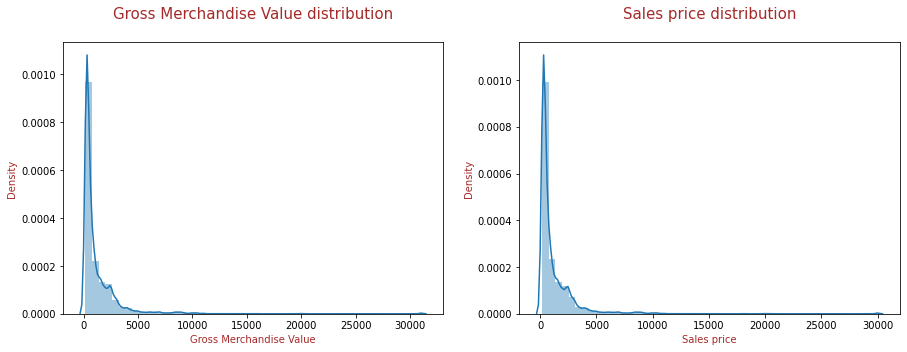

In [225]:
# Plotting histogram of gmv and sales_price

plt.figure(figsize=[15,5])

plt.subplot(1,2,1)
sns.distplot(analysis_df.gmv)
plt.title("Gross Merchandise Value distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Gross Merchandise Value", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1,2,2)
sns.distplot(analysis_df.sales_price)
plt.title("Sales price distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Sales price", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

**We can see that gmv has sales price distribution seems to be skewed and the distribution seems to be maximum between 0 to 5000.**

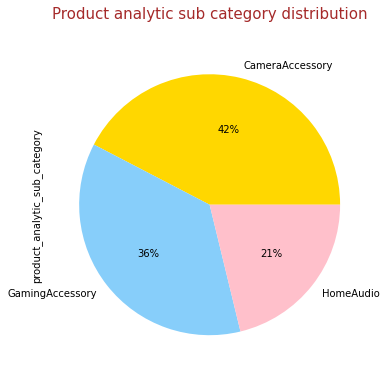

In [226]:
# Plotting Pie chart of Product categories

plt.figure(figsize=[10,6])

analysis_df.product_analytic_sub_category.value_counts().plot.pie(autopct = "%1.0f%%", colors=['gold','lightskyblue','pink'])
plt.title("Product analytic sub category distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

Camera accessory and Gaming accessory have more number of orders than Home Audio

**Periodic Analysis**

In [227]:
# Creating a monthwise statitsics for gmv 

gmv_df = analysis_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"gmv":"sum"})
gmv_df["Month"] = gmv_df["Month"].apply(lambda x: calendar.month_name[x])
gmv_df["Date"] = gmv_df["Month"].astype("str") + " " +gmv_df["Year"].astype("str")
gmv_df

,Year,Month,gmv,Date
0,2015,July,4.180229e+07,July 2015
1,2015,August,5.684600e+04,August 2015
2,2015,September,4.741531e+07,September 2015
3,2015,October,7.891773e+07,October 2015
4,2015,November,5.302896e+07,November 2015
5,2015,December,6.371626e+07,December 2015
6,2016,January,6.269433e+07,January 2016
7,2016,February,5.915279e+07,February 2016
8,2016,March,6.020768e+07,March 2016
9,2016,April,5.245621e+07,April 2016


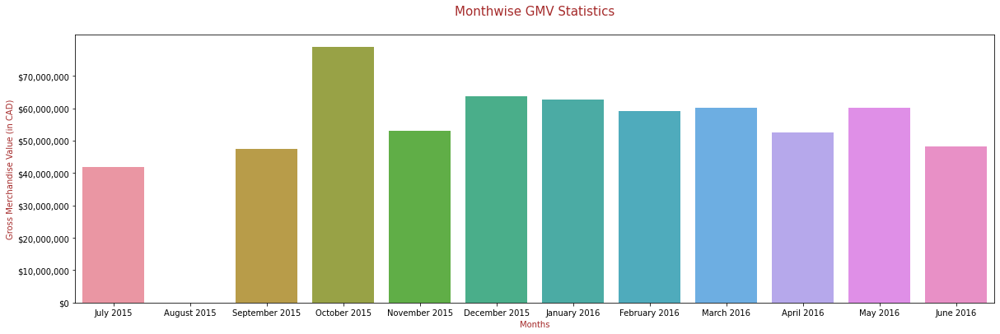

In [228]:
# Plotting barplot for months vs gmv

plt.figure(figsize=[20,6])

sns.barplot(gmv_df["Date"], gmv_df["gmv"])
plt.title("Monthwise GMV Statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Gross Merchandise Value (in CAD)", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,80000000,10000000)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

* October and December months contribute to highest gmv as these are the festive and holiday months
* The gmv is lowest in the month of August

In [229]:
# Creating a monthwise statitsics for product quantity 

unit_df = analysis_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"units":"sum"})
unit_df["Month"] = unit_df["Month"].apply(lambda x: calendar.month_name[x])
unit_df["Date"] = unit_df["Month"].astype("str") + " " +unit_df["Year"].astype("str")
unit_df

,Year,Month,units,Date
0,2015,July,28965,July 2015
1,2015,August,54,August 2015
2,2015,September,35892,September 2015
3,2015,October,60158,October 2015
4,2015,November,41804,November 2015
5,2015,December,47356,December 2015
6,2016,January,50202,January 2016
7,2016,February,53326,February 2016
8,2016,March,51112,March 2016
9,2016,April,46089,April 2016


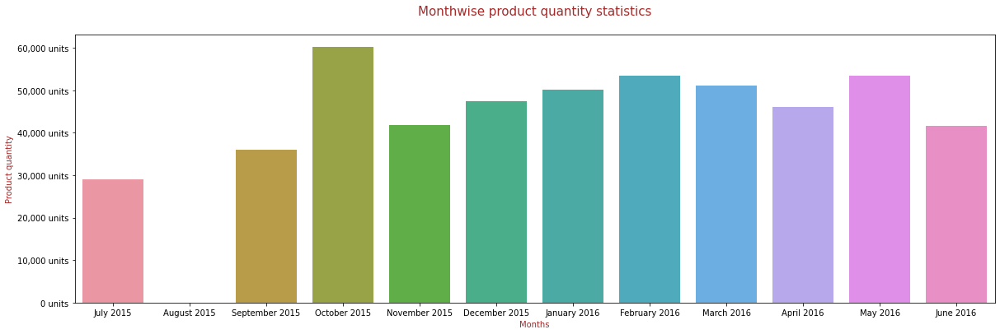

In [230]:
# Plotting barplot for months vs product quantity

plt.figure(figsize=[20,6])

sns.barplot(unit_df["Date"], unit_df["units"])
plt.title("Monthwise product quantity statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product quantity", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,70000,10000)
ytick_label = ["{:,} units".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

* The sales was highest during October, February and May month as these are the months when company provided special sale in respective weeks.
* The sales was lowest in the month of August

In [231]:
# Creating a monthwise statitsics for discount

discount_df = analysis_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"discount":"mean"})
discount_df["Month"] = discount_df["Month"].apply(lambda x: calendar.month_name[x])
discount_df["Date"] = discount_df["Month"].astype("str") + " " +discount_df["Year"].astype("str")
discount_df

,Year,Month,discount,Date
0,2015,July,40.536244,July 2015
1,2015,August,40.814231,August 2015
2,2015,September,43.416132,September 2015
3,2015,October,46.409537,October 2015
4,2015,November,44.010707,November 2015
5,2015,December,46.246959,December 2015
6,2016,January,45.846031,January 2016
7,2016,February,47.794398,February 2016
8,2016,March,46.092240,March 2016
9,2016,April,48.017088,April 2016


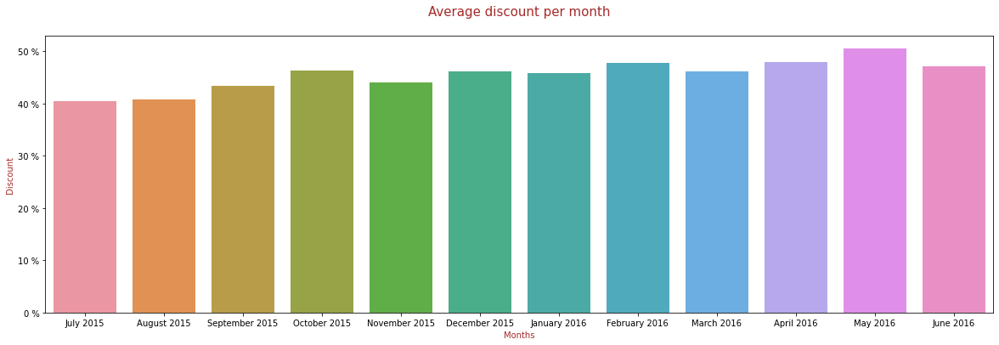

In [232]:
# Plotting barplot for months vs product quantity

plt.figure(figsize=[20,6])

sns.barplot(discount_df["Date"], discount_df["discount"])
plt.title("Average discount per month\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Discount", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,60,10)
ytick_label = ["{:,} %".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

We can see that the discount provided over the products is between 40% to 60%. April, May and June month have highest discount.

**Discount Analysis**

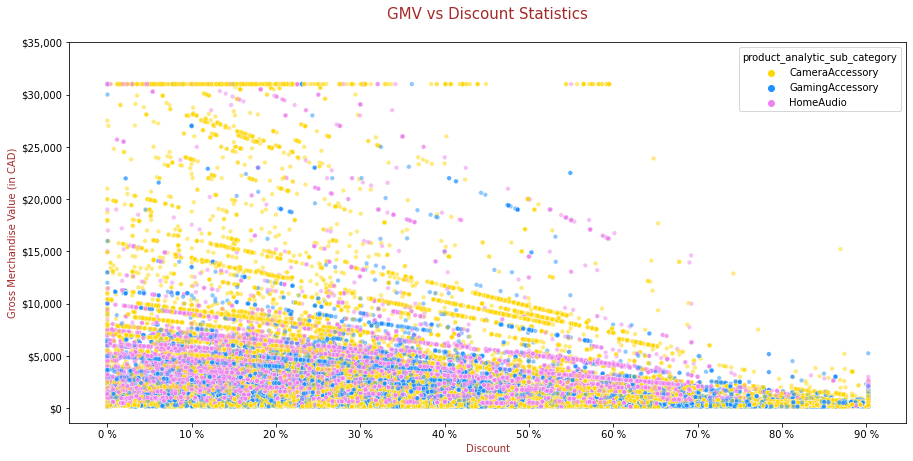

In [233]:

plt.figure(figsize=[15,7])

sns.scatterplot(analysis_df["discount"], analysis_df["gmv"], color="pink", hue=analysis_df["product_analytic_sub_category"], alpha=0.5, s=20, palette=['gold','dodgerblue','violet'])
plt.title("GMV vs Discount Statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Gross Merchandise Value (in CAD)", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Discount", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,40000,5000)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

xtick_values = np.arange(0,100,10)
xtick_label = ["{:,} %".format(j) for j in xtick_values]
plt.xticks(xtick_values, xtick_label)

plt.show()

* The revenue GMV is high for discount range 0% to 60%
* As discount increases above 60% the GMV starts decreasing
* For discounted products the gmv ranges between 0 to 15,000 CAD

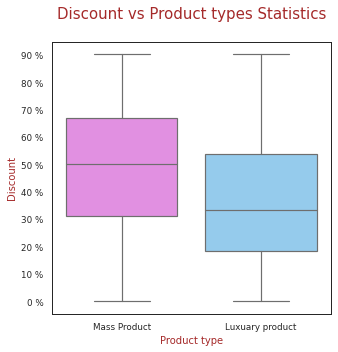

In [234]:
# Plotting discount for luxuary products
plt.figure(figsize=(5, 5))
sns.set_style("white") 
sns.set_context("paper") 

sns.boxplot(x='luxuary_product', y='discount', palette=['violet', 'lightskyblue'], data=analysis_df)
plt.title("Discount vs Product types Statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Discount", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.xticks([0,1], ["Mass Product", "Luxuary product"])
ytick_values = np.arange(0,100,10)
ytick_label = ["{:,} %".format(j) for j in xtick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

* Mass products have higher discount rate than luxuary products
* Majority of the mass products are sold upto 50% discount
* Majority of luxuary products are sold upto 40% discount

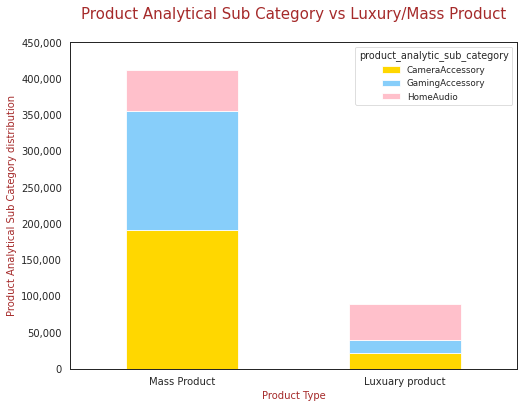

In [235]:
analysis_df.groupby(["luxuary_product", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,6), fontsize = 10, color=['gold','lightskyblue','pink']) 

plt.title("Product Analytical Sub Category vs Luxury/Mass Product\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product Analytical Sub Category distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,500000,50000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks([0,1], ["Mass Product", "Luxuary product"], rotation=0)

plt.show()                                                                                             

* Orders for Mass products are much higher than order for luxuary products.
* In mass products Camera accessory hold high share 
* In luxuary products Home Audio hold high share

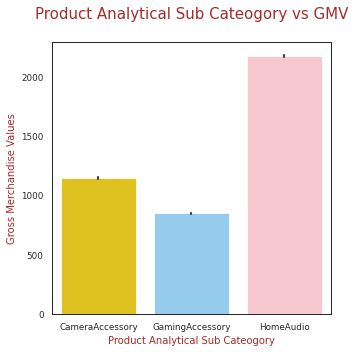

In [487]:
# Plotting for Product Analytical Sub Cateogory and GMV
plt.figure(figsize=(5, 5))
sns.barplot(analysis_df["product_analytic_sub_category"], analysis_df["gmv"], palette=['gold','lightskyblue','pink'])
plt.title("Product Analytical Sub Cateogory vs GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Cateogory", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Gross Merchandise Values", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

Revenue generated from Home Audio products is much higher than Camera accessory and Gaming accessory products



In [237]:
# Creating monthwise number of orders

cprod_demand_df = analysis_df.groupby(by=["Year", "Month", "product_analytic_sub_category"], sort=["Year","Month"] , as_index=False).agg({"order_id":"count"})
cprod_demand_df["Month"] = cprod_demand_df["Month"].apply(lambda x: calendar.month_name[x])
cprod_demand_df["Date"] = cprod_demand_df["Month"].astype("str") + " " +cprod_demand_df["Year"].astype("str")
cprod_demand_df

,Year,Month,product_analytic_sub_category,order_id,Date
0,2015,July,CameraAccessory,10713,July 2015
1,2015,July,GamingAccessory,9469,July 2015
2,2015,July,HomeAudio,8076,July 2015
3,2015,August,CameraAccessory,17,August 2015
4,2015,August,GamingAccessory,26,August 2015
5,2015,August,HomeAudio,9,August 2015
6,2015,September,CameraAccessory,15299,September 2015
7,2015,September,GamingAccessory,11204,September 2015
8,2015,September,HomeAudio,8611,September 2015
9,2015,October,CameraAccessory,22906,October 2015


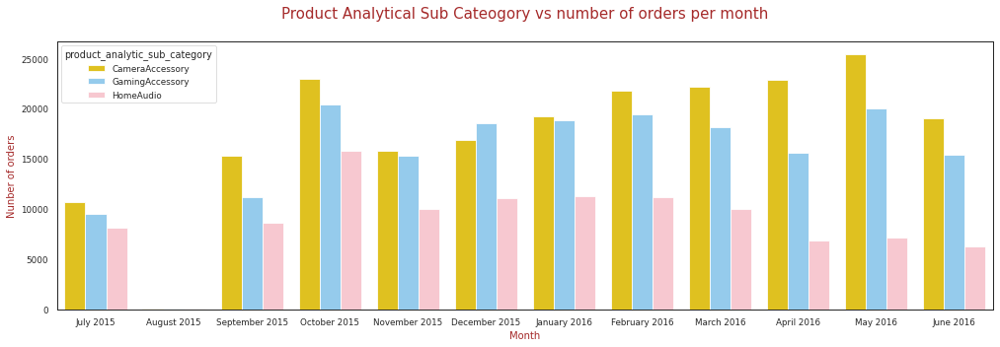

In [489]:
# Plotting monthwise number of orders

plt.figure(figsize=(17, 5))
sns.barplot(cprod_demand_df["Date"], cprod_demand_df["order_id"], hue=cprod_demand_df["product_analytic_sub_category"], palette=['gold','lightskyblue','pink'])
plt.title("Product Analytical Sub Cateogory vs number of orders per month\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Nunber of orders", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Month", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

* For most of the months orders for Camera and Gaming accessory is higher than Home Audio products
* In December month Gaming products have higher sales than other two categories
* Number of orders for Home Audio are very low in April, May and June
* Number of Orders for Camera accessory are highest in October and MAy 

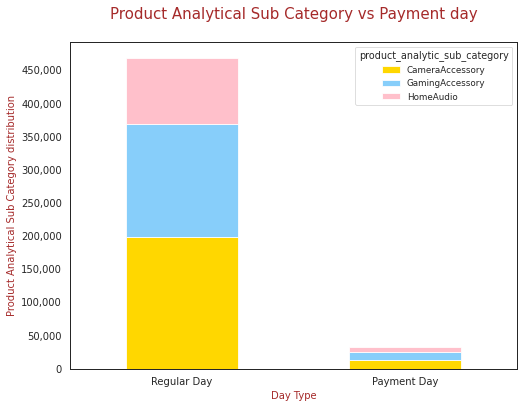

In [239]:
# Plotting Product Analytical Sub Category vs Payment day

analysis_df.groupby(["pay_date", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,6), fontsize = 10, color=['gold','lightskyblue','pink']) 

plt.title("Product Analytical Sub Category vs Payment day\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product Analytical Sub Category distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Day Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,500000,50000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks([0,1], ["Regular Day", "Payment Day"], rotation=0)

plt.show()                                                      

Orders for Camera accessory, Gaming accessory and Home Audio are much higher on Regualr days compared to Payment days


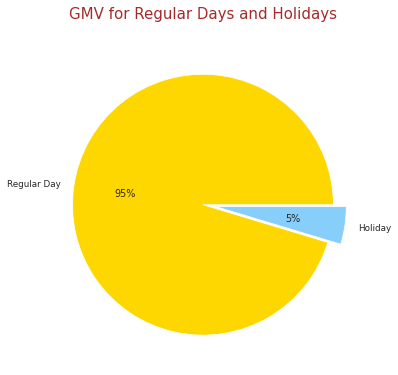

In [240]:
# Plotting GMV for Regular Days and Holidays

holiday_df = analysis_df.groupby(analysis_df["holiday"]).agg({"gmv":"sum"})

plt.figure(figsize=[10,6])

plt.pie(holiday_df, autopct = "%1.0f%%", explode = (0.0,0.1), colors = ["gold", "lightskyblue"], labels = ["Regular Day", "Holiday"])
plt.title("GMV for Regular Days and Holidays\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

95% of orders are placed on regular days and only 5% are placed during holidays.

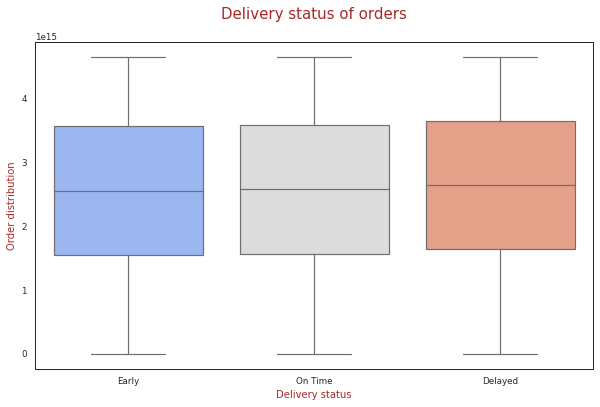

In [241]:
# Plotting Delivery status vs orders

plt.figure(figsize=[10,6])
sns.boxplot(analysis_df["delivery_status"], analysis_df["order_id"], palette='coolwarm')
plt.title("Delivery status of orders\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Order distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Delivery status", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

Average number of delayed orders are slightly higher than early and on time orders

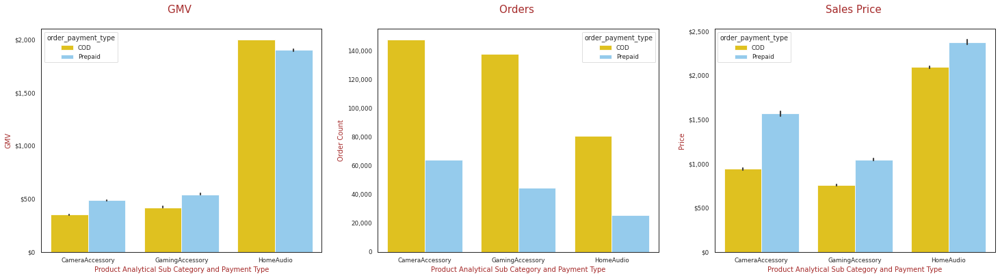

In [491]:
plt.figure(figsize=[25,6])

plt.subplot(1,3,1)
sns.barplot(x = analysis_df["product_analytic_sub_category"], y =analysis_df["gmv"], hue =analysis_df["order_payment_type"], palette = ["gold", "lightskyblue"], estimator=np.median)
plt.title("GMV \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,2500,500)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.subplot(1,3,2)
sns.countplot(analysis_df["product_analytic_sub_category"], hue = analysis_df["order_payment_type"], palette = ["gold", "lightskyblue"])
plt.title("Orders \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Order Count", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
ytick_values = np.arange(0,160000,20000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.subplot(1,3,3)
sns.barplot(analysis_df["product_analytic_sub_category"], analysis_df["sales_price"], hue = analysis_df["order_payment_type"], palette = ["gold", "lightskyblue"])
plt.title("Sales Price \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Price", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,3000,500)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()


* As seen above the sales for camera and gaming accessory is higher whereas the highest revenue is genearted from Home Audio product sub category.
* For Home Audio most of the ordered products are luxuary products the preferred payment mode for them is cash on delivery
* Prepaid products contribute to higher revenue in Camera and Gaming accessory
* Cash on delivery orders are much higher compared to prepaid orders in all the three product sub category
* Price of prepaid order is higher compared to cash on delivery orders in all the three product sub category

In [243]:
# Top 10 products according to revenue and sales of the company

prod_type_df = analysis_df.groupby(by=["product_analytic_vertical", "product_analytic_sub_category"], as_index=False).agg({"gmv":"sum", "units":"sum"}).sort_values(by="gmv", ascending=False).head(10)
prod_type_df["category"] = prod_type_df["product_analytic_vertical"].astype("str") + " in " + prod_type_df["product_analytic_sub_category"].astype("str")
prod_type_df

,product_analytic_vertical,product_analytic_sub_category,gmv,units,category
35,HomeAudioSpeaker,HomeAudio,1.846343e+08,75954,HomeAudioSpeaker in HomeAudio
38,Lens,CameraAccessory,1.018343e+08,31872,Lens in CameraAccessory
24,GamePad,GamingAccessory,6.123373e+07,53235,GamePad in GamingAccessory
28,GamingHeadset,GamingAccessory,3.158910e+07,59826,GamingHeadset in GamingAccessory
31,GamingMouse,GamingAccessory,2.600887e+07,35765,GamingMouse in GamingAccessory
0,Binoculars,CameraAccessory,2.511300e+07,12982,Binoculars in CameraAccessory
4,CameraBattery,CameraAccessory,2.278596e+07,35863,CameraBattery in CameraAccessory
3,CameraBag,CameraAccessory,2.229111e+07,15813,CameraBag in CameraAccessory
21,Flash,CameraAccessory,2.210304e+07,48197,Flash in CameraAccessory
13,CameraTripod,CameraAccessory,1.960863e+07,31379,CameraTripod in CameraAccessory


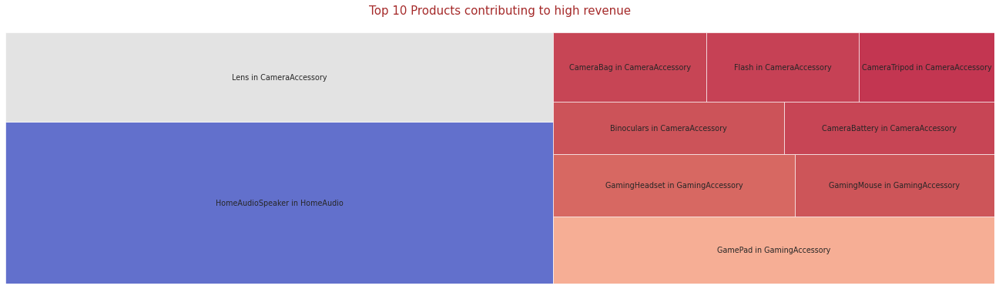

In [507]:
# Plotting Top 10 products according to revenue of the company

plt.figure(figsize=(23, 6))

# Create a dataset
my_values=list(prod_type_df['gmv'])
# create a color palette, mapped to these values
cmap = matplotlib.cm.coolwarm_r
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

squarify.plot(label=prod_type_df["category"], sizes=prod_type_df["gmv"], alpha=.8, color=colors )
plt.title("Top 10 Products contributing to high revenue\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.axis('off')
plt.show()

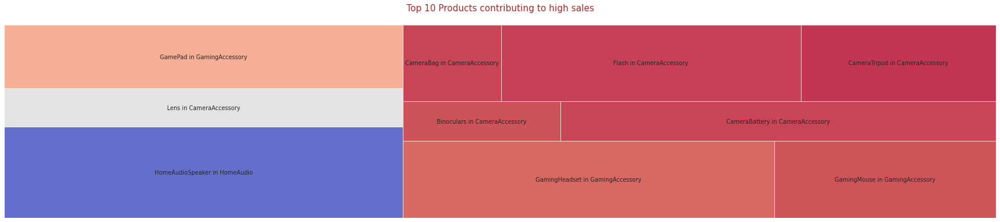

In [508]:
# Plotting Top 10 products according to revenue of the company

plt.figure(figsize=(30, 6))

# Create a dataset
my_values=list(prod_type_df['gmv'])
# create a color palette, mapped to these values
cmap = matplotlib.cm.coolwarm_r
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]

squarify.plot(label=prod_type_df["category"], sizes=prod_type_df["units"], alpha=.8, color=colors )
plt.title("Top 10 Products contributing to high sales\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.axis('off')
plt.show()

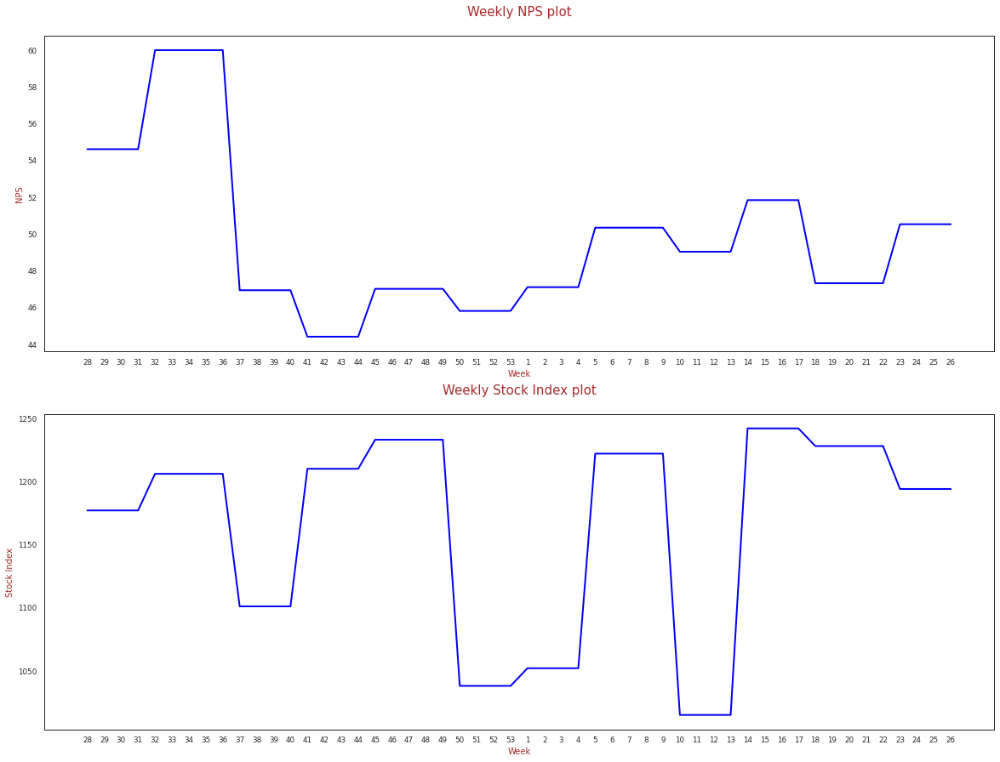

In [246]:
# Plotting NPS and Stock index 
nps_plot = monthly_nps.copy()
nps_plot["week"] = nps_plot["week"].astype("str")

plt.figure(figsize=(20, 15))

plt.subplot(2,1,1)
plt.plot(nps_plot.iloc[:,0], nps_plot.iloc[:,1], 'b-', linewidth=2)
plt.title("Weekly NPS plot\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("NPS", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Week", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(2,1,2)
plt.plot(nps_plot["week"], nps_plot["Stock Index"], 'b-', linewidth=2)
plt.title("Weekly Stock Index plot\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Stock Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Week", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()


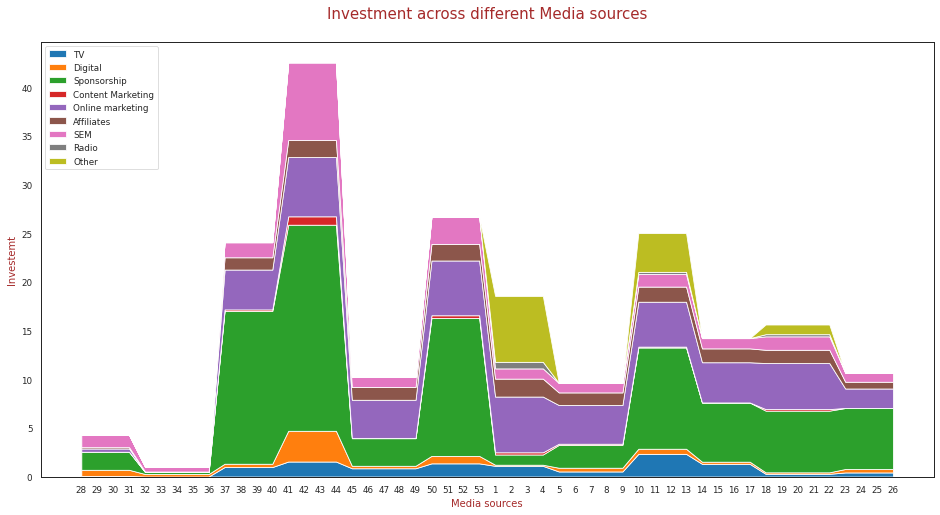

In [247]:
# Investment across different Media sources

media_plot = media_inv_df.copy()
media_plot["week"] = media_plot["week"].astype("str")

plt.figure(figsize=(16, 8))

# Basic stacked area chart.
plt.stackplot(media_plot["week"], media_plot["TV"], media_plot["Digital"], media_plot["Sponsorship"], media_plot["Content Marketing"], media_plot["Online marketing"], media_plot["Affiliates"], media_plot["SEM"], media_plot["Radio"], media_plot["Other"], 
              labels=["TV","Digital","Sponsorship","Content Marketing","Online marketing","Affiliates","SEM","Radio","Other"])
plt.title("Investment across different Media sources\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Investemt", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Media sources", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.legend(loc='upper left')
plt.show()

## Step 3: Model Building

**We will be using Market Mix Modelling on our pre-processed data. The following models will be built and evaluated.**
1. Additive Model
2. Multiplicative Model
3. Koyck Model
4. Distributive Lag Model (Additive)
5. Distributive Lag Model (Multiplicative)

In [248]:
# Copying the datasets for preparing model data

cameraaccessory_model_df = camera_accessory_df.copy()
gamingaccessory_model_df = gaming_accessory_df.copy()
homeaudio_model_df = home_audio_df.copy()

In [249]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


As week column was used to build the data at weekly level so now we will be dropping it as it is not significat feature for predition.

In [250]:
cameraaccessory_model_df.drop(columns="week", axis=1, inplace=True)
gamingaccessory_model_df.drop(columns="week", axis=1, inplace=True)
homeaudio_model_df.drop(columns="week", axis=1, inplace=True)

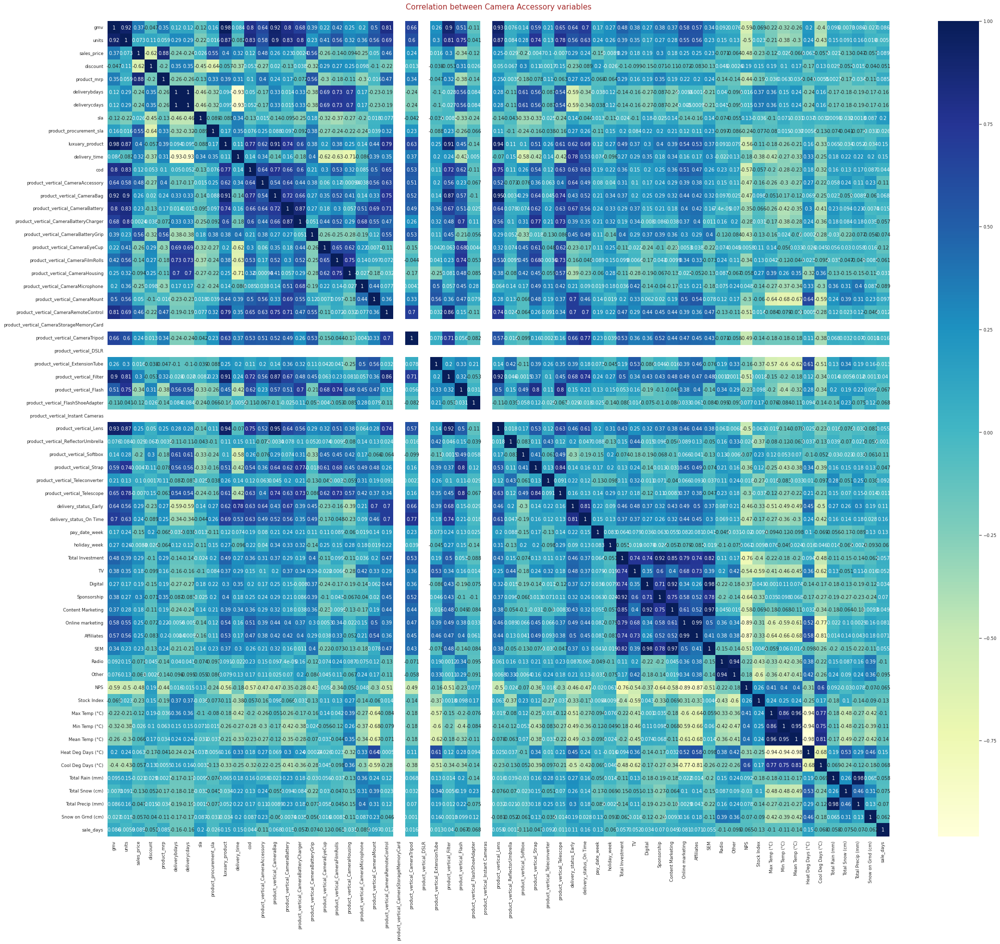

In [251]:
# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(cameraaccessory_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Camera Accessory variables\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

In [252]:
cameraaccessory_model_df.head(1)

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
0,4864060.0,5259,925.056673,50.238925,1761.009284,0.0,0.0,5.86383,2.879497,398,15429,4198,43,276.0,524.0,248.0,3,3,31,0,0,29,87.0,0,775.0,0,2,211.0,2021.0,0,0,618.0,0,0,26,0,31,4024.0,454.0,0,0,18.549,1.095,0.114,1.05,0.225,5.725,1.842,1.05,0.675,6.773,47.093031,1052.0,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.2,0.0,0.0


In [253]:
# Dropping the columns that have high correlation

cameraaccessory_model_df.drop(columns = ["luxuary_product","Total Precip (mm)", "Max Temp (°C)", "Other", "Affiliates", "Content Marketing", "Sponsorship", "product_vertical_CameraStorageMemoryCard", "product_vertical_DSLR", "product_vertical_Instant Cameras","product_vertical_Telescope", "units"], axis=1, inplace=True)

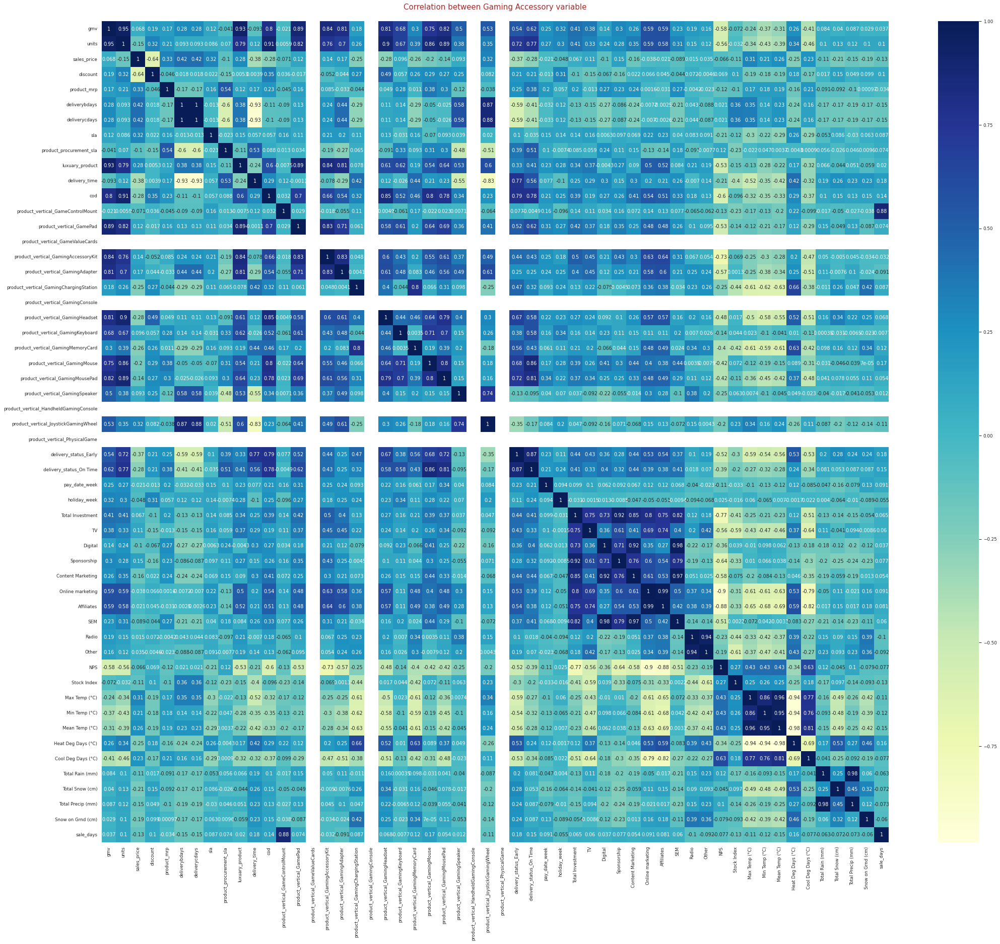

In [254]:
# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(gamingaccessory_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Gaming Accessory variable\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

In [255]:
gamingaccessory_model_df.head(1)

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
25,2655848.0,2923,903.029339,40.802595,1876.143514,0.0,0.0,5.383528,3.231884,363,6087,2093,0,891.0,0,102.0,49,0,0,206.0,422.0,36.0,954.0,55,0,0,14,0,1735.0,223.0,0,1,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0,54.599588,1177.0,28.0,12.5,20.1,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0.0


In [256]:
# Dropping the columns that have high correlation

gamingaccessory_model_df.drop(columns = ["luxuary_product","product_vertical_GameValueCards","product_vertical_GamingConsole","product_vertical_HandheldGamingConsole","product_vertical_PhysicalGame","product_vertical_GameControlMount","Total Investment","Digital","Content Marketing","Radio","Total Precip (mm)","units"], axis=1, inplace=True)

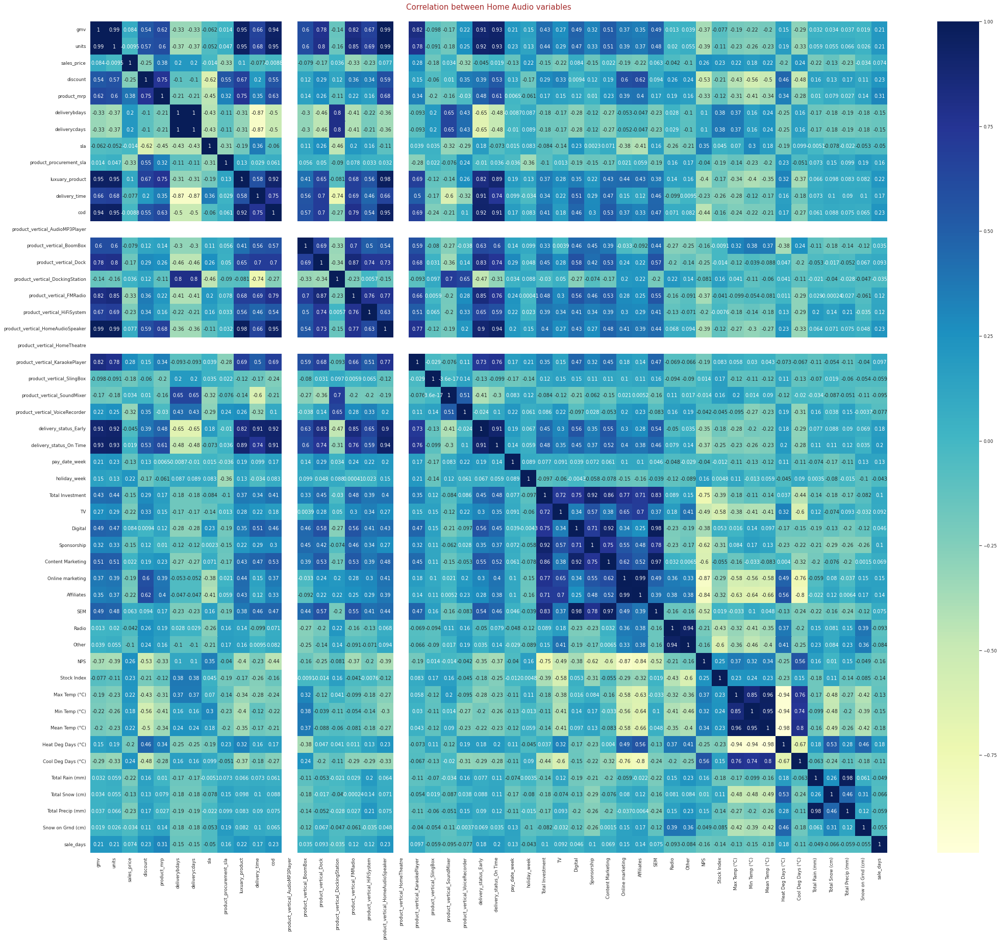

In [257]:
# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(homeaudio_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Home Audio variables\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})


plt.show()

In [258]:
homeaudio_model_df.head(1)

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
25,4.483267e+06,2038,2199.149128,32.448944,3462.995064,0.0,0.0,7.331194,2.863277,873,9052,1539,0,72,30,1,471.0,23,1358.0,0,0,0,0,63,1649.0,87.0,0,1,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0,54.599588,1177.0,28.0,12.5,20.1,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0.0


In [259]:
homeaudio_model_df.drop(columns=["luxuary_product","delivery_status_Early","product_vertical_AudioMP3Player","product_vertical_HomeTheatre","Total Investment","Digital","Content Marketing","Radio","Max Temp (°C)","Min Temp (°C)","Total Precip (mm)","units"], axis=1, inplace=True)

### Model 1: Additive Model



#### Linear model assumes an additive relationship between the different KPIs. Hence their impacts are also additive towards the dependent Y variable.

#### The equation can be represented as:

						Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ

Train Test Split

In [260]:
# Train test split

cameraaccessory_model1_train, cameraaccessory_model1_test = train_test_split(cameraaccessory_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                             
gamingaccessory_model1_train, gamingaccessory_model1_test = train_test_split(gamingaccessory_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                              
homeaudio_model1_train, homeaudio_model1_test = train_test_split(homeaudio_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [261]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model1_train = cameraaccessory_model1_train.pop('gmv')
X_cameraaccessory_model1_train = cameraaccessory_model1_train

y_gamingaccessory_model1_train = gamingaccessory_model1_train.pop('gmv')
X_gamingaccessory_model1_train = gamingaccessory_model1_train

y_homeaudio_model1_train = homeaudio_model1_train.pop('gmv')
X_homeaudio_model1_train = homeaudio_model1_train

In [262]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model1_test = cameraaccessory_model1_test.pop('gmv')
X_cameraaccessory_model1_test = cameraaccessory_model1_test

y_gamingaccessory_model1_test = gamingaccessory_model1_test.pop('gmv')
X_gamingaccessory_model1_test = gamingaccessory_model1_test

y_homeaudio_model1_test = homeaudio_model1_test.pop('gmv')
X_homeaudio_model1_test = homeaudio_model1_test

Re-scalling the features using Standard scaler

In [263]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model1_train[X_cameraaccessory_model1_train.columns]=scaler.fit_transform(X_cameraaccessory_model1_train[X_cameraaccessory_model1_train.columns])
# Transform on test data
X_cameraaccessory_model1_test[X_cameraaccessory_model1_test.columns]=scaler.transform(X_cameraaccessory_model1_test[X_cameraaccessory_model1_test.columns])

In [264]:
X_cameraaccessory_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Online marketing,SEM,Radio,NPS,Stock Index,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.93099,-1.33659,-3.75550,-0.68710,-0.68721,-1.97888,-3.88052,-2.12696,-1.83456,-2.46018,-2.38539,-2.27773,-1.85848,-1.55120,-0.71484,-1.30365,-0.44652,-0.56408,-1.46823,-2.27652,-1.91905,-0.92108,-2.48631,-1.21104,-0.24618,-2.30012,-0.23285,-0.42060,-1.98786,-0.17150,-1.57686,-1.64284,-0.81650,-0.67700,-1.38743,-1.23602,-0.61273,-1.75664,-0.66586,-0.45114,-1.35662,-1.90624,-2.47905,-2.24231,-0.94529,-0.74520,-0.78624,-0.27106,-0.24016,-0.36591
25%,-0.60383,-0.68265,-0.46404,-0.68710,-0.68721,-0.60074,-0.40291,-0.85859,-0.43639,-0.34407,-0.23041,-0.20356,-0.40431,-0.83995,-0.71484,-0.61809,-0.44652,-0.56408,-0.90311,-0.44039,-0.40281,-0.92108,-0.24394,-0.91946,-0.24618,-0.38232,-0.23285,-0.42060,-0.54106,-0.17150,-0.86672,-0.43380,-0.81650,-0.67700,-0.55682,-0.83272,-0.43076,-0.75846,-0.38188,-0.45114,-0.75030,-0.81851,-0.72904,-0.55435,-0.94529,-0.74520,-0.68261,-0.27106,-0.24016,-0.36591
50%,0.14703,-0.13411,-0.04098,-0.68560,-0.68572,-0.05863,-0.05995,0.54164,0.06654,0.23305,-0.01051,0.09534,-0.25962,0.10838,-0.39408,-0.00871,-0.44652,-0.56408,-0.03660,0.16359,0.14907,-0.42512,0.15105,-0.25909,-0.24618,-0.06007,-0.23285,-0.42060,-0.05879,-0.17150,0.09548,-0.15344,-0.81650,-0.67700,-0.11219,0.00933,-0.25473,0.30822,-0.33375,-0.45114,0.00089,0.50954,0.00484,-0.03212,-0.20103,-0.74520,-0.46572,-0.27106,-0.24016,-0.36591
75%,0.73530,0.39863,0.76836,1.42902,1.42103,0.35616,0.47753,0.74446,0.74235,0.69474,0.30934,0.38336,0.34086,0.81963,0.24745,0.20077,-0.44652,0.00000,0.64154,0.77966,0.40523,0.56682,0.38805,0.71949,-0.24618,0.38008,-0.23285,-0.42060,0.68069,-0.17150,0.75172,0.30213,1.22474,1.47710,0.83968,0.68444,-0.00221,0.63045,-0.13701,-0.45114,0.34438,0.74985,0.9927

Building a Linear Model for cameraaccessory 

In [265]:
cameraaccessory_model1 = LinearRegression().fit(X_cameraaccessory_model1_train, y_cameraaccessory_model1_train)
y_cameraaccessory_model1_test_pred = cameraaccessory_model1.predict(X_cameraaccessory_model1_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred)))

R2 Score: 0.782481117559374
Mean Squared Error: 999446220619.2748


**During the rescalling of data we have only scaled the dependent variables and as we have not scaled the independent variable GMV. Therefore, the Mean squared error scale is in accordance to the scale of GMV. We will be calculating the Root Mean Squared Error and further normalize it for better understanding.**

In [266]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [267]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.07866226803145367

Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [268]:
cameraaccessory_model1_cvdf = cameraaccessory_model_df.copy()

y_cameraaccessory_model1_cvdf = cameraaccessory_model1_cvdf.pop('gmv')
X_cameraaccessory_model1_cvdf = cameraaccessory_model1_cvdf

In [269]:
cameraaccessory_model1_cv = LinearRegression().fit(X_cameraaccessory_model1_cvdf, y_cameraaccessory_model1_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model1_cv, X_cameraaccessory_model1_cvdf, y_cameraaccessory_model1_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: -0.40950458350473995
Mean Squared Error: 5571562123637.606


In [270]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.1857270829429417

Determining Feature Importance for cameraaccessory from model without cv

In [271]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model1.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model1.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model1_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [272]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
26,product_vertical_Lens,637631.621
23,product_vertical_Filter,335108.698
21,product_vertical_CameraTripod,308956.435
17,product_vertical_CameraHousing,276908.660
32,delivery_status_On Time,270702.662
24,product_vertical_Flash,248261.848
3,product_mrp,219226.882
38,Online marketing,217774.048
6,sla,207788.538
11,product_vertical_CameraBag,202978.620


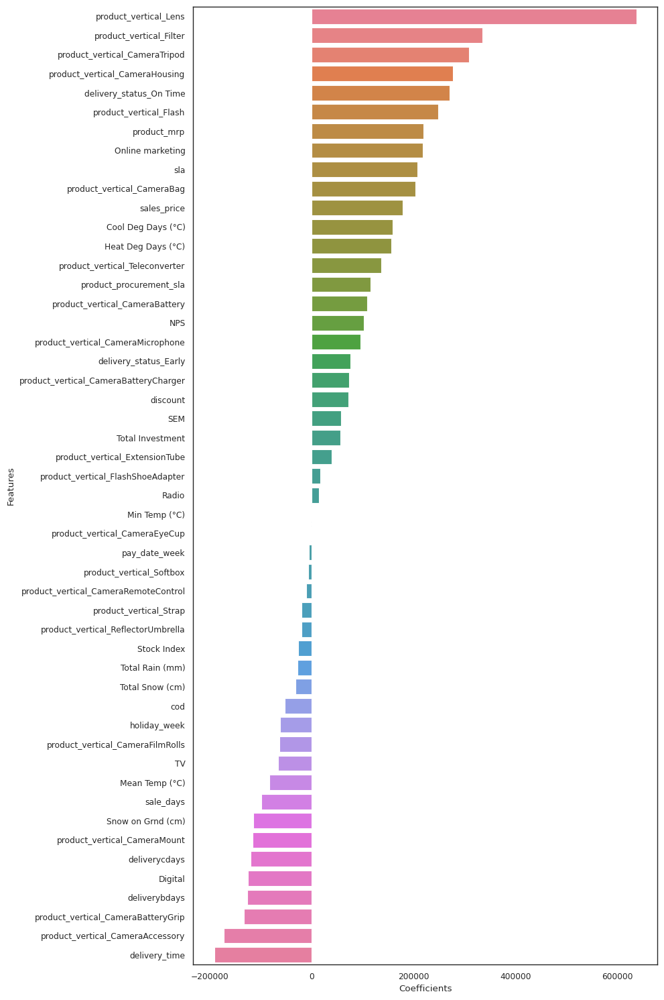

In [273]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [274]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model1_train[X_gamingaccessory_model1_train.columns]=scaler.fit_transform(X_gamingaccessory_model1_train[X_gamingaccessory_model1_train.columns])
# Transform on test data
X_gamingaccessory_model1_test[X_gamingaccessory_model1_test.columns]=scaler.transform(X_gamingaccessory_model1_test[X_gamingaccessory_model1_test.columns])

In [275]:
X_gamingaccessory_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,delivery_time,cod,product_vertical_GamePad,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,TV,Sponsorship,Online marketing,Affiliates,SEM,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.28775,-1.50351,-1.20151,-0.64339,-0.64366,-2.54570,-1.74806,-2.08536,-1.73165,-2.57962,-2.61248,-2.21876,-0.56972,-1.50096,-1.53305,-0.84913,-1.06569,-1.56484,-0.69882,-0.97066,-1.38831,-1.19248,-0.91766,-0.67700,-1.35338,-1.16025,-1.92880,-2.02096,-0.70054,-0.41311,-1.17090,-2.02826,-2.07185,-2.61674,-2.36746,-0.90625,-0.74768,-0.80402,-0.24605,-0.22888,-0.36591
25%,-0.70256,-0.59264,-0.42545,-0.64339,-0.64366,-0.52150,-0.66492,-0.95762,-0.46113,-0.41357,-0.43062,-0.48384,-0.56972,-0.89588,-0.47514,-0.61091,-0.34729,-0.66780,-0.66357,-0.66853,-0.83552,-0.62879,-0.91766,-0.67700,-0.92066,-0.84134,-0.42465,-0.35996,-0.45449,-0.41311,-0.58157,-0.89307,-0.77291,-0.76741,-0.57613,-0.87611,-0.74768,-0.71022,-0.24605,-0.22888,-0.36591
50%,-0.02544,0.03250,-0.31736,-0.64207,-0.64218,-0.01834,0.02103,0.35627,0.09463,-0.07103,0.09550,-0.06897,-0.56972,0.07334,-0.20421,-0.39734,-0.20270,-0.11961,-0.34639,-0.51746,-0.12517,-0.13002,-0.91766,-0.67700,-0.01716,-0.25544,0.18004,0.30376,-0.35808,-0.41311,-0.49260,0.49292,0.13070,0.02516,0.07254,-0.32469,-0.74768,-0.44823,-0.24605,-0.22888,-0.36591
75%,0.73021,0.24323,-0.06071,1.38042,1.37841,0.40366,0.38281,0.79289,0.41363,0.49819,0.60614,0.72306,0.16880,0.43265,0.35055,0.02159,0.02970,0.35383,0.11177,0.27983,0.65101,0.25364,1.08972,1.47710,0.74526,0.92834,0.71920,0.77129,-0.22391,-0.41311,0.40880,0.78332,0.86488,0.72967,0.88793,0.47141,0.74399,0.34744,-0.24605,-0.22888,-0.08750
max,1.77285,3.93935,4.04817,1.70567,1.71766,3.49125,3.03191,1.29346,3.85944,2.47031,2.27735,2.30713,3.12289,3.02257,4.51767,4.00556,5.21745,4.34070,3.45984,2.18495,3.53004,4.71007,1.08972,1.47710,2.33033,1.97421,1.18948,1.13685,2.70095,3.42641,2.46452,0.96812,1.37316,1.55159,1.29869,2.67768,2.17629,3.33608,4.19868,5.64891,5.20229


Building Linear Regression model for gamingaccessory

In [276]:
gamingaccessory_model1 = LinearRegression().fit(X_gamingaccessory_model1_train , y_gamingaccessory_model1_train)
y_gamingaccessory_model1_test_pred = gamingaccessory_model1.predict(X_gamingaccessory_model1_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred)))

R2 Score: 0.7688833119753036
Mean Squared Error: 307855930964.1752


**During the rescalling of data we have only scaled the dependent variables and as we have not scaled the independent variable GMV. Therefore, the Mean squared error scale is in accordance to the scale of GMV. We will be calculating the Root Mean Squared Error and further normalize it for better understanding.**


In [277]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [278]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.07696455230348397

Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [279]:
gamingaccessory_model1_cvdf = gamingaccessory_model_df.copy()

y_gamingaccessory_model1_cvdf = gamingaccessory_model1_cvdf.pop('gmv')
X_gamingaccessory_model1_cvdf = gamingaccessory_model1_cvdf

In [280]:
gamingaccessory_model1_cv = LinearRegression().fit(X_gamingaccessory_model1_cvdf, y_gamingaccessory_model1_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model1_cv, X_gamingaccessory_model1_cvdf, y_gamingaccessory_model1_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: -3.0425552235162687
Mean Squared Error: 6771409629175.884


In [281]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.36095788097164305

Determining Feature Importance for gamingaccessory from model without cv

In [282]:
#Formatting the output 
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model1.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model1.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model1_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [283]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
14,product_vertical_GamingHeadset,409930.256
31,NPS,406580.835
21,delivery_status_Early,318211.177
17,product_vertical_GamingMouse,311189.250
11,product_vertical_GamingAccessoryKit,301648.001
1,sales_price,287944.870
10,product_vertical_GamePad,256851.223
26,Sponsorship,247291.981
30,Other,200818.900
35,Mean Temp (°C),200605.946


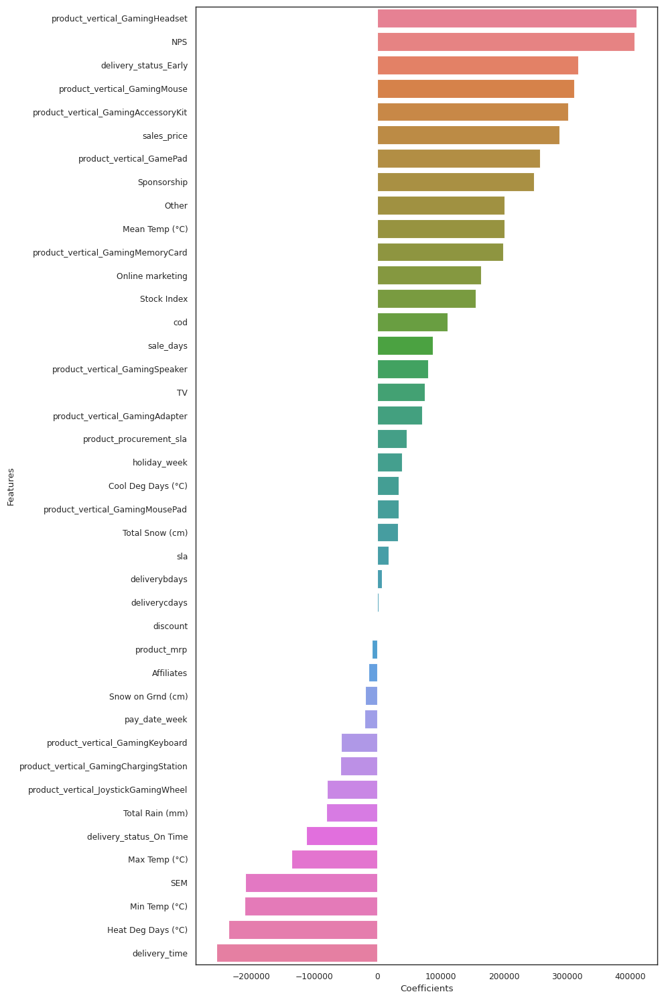

In [284]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [285]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model1_train[X_homeaudio_model1_train.columns]=scaler.fit_transform(X_homeaudio_model1_train[X_homeaudio_model1_train.columns])
# Transform on test data
X_homeaudio_model1_test[X_homeaudio_model1_test.columns]=scaler.transform(X_homeaudio_model1_test[X_homeaudio_model1_test.columns])

In [286]:
X_homeaudio_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,delivery_time,cod,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_On Time,pay_date_week,holiday_week,TV,Sponsorship,Online marketing,Affiliates,SEM,Other,NPS,Stock Index,Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm),sale_days
count,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000
mean,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000
std,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550
min,-1.89602,-4.12435,-1.57692,-0.60878,-0.60932,-1.72232,-3.91560,-2.24188,-2.34815,-2.10624,-2.03124,-1.09251,-2.89303,-2.37420,-2.61892,0.00000,-0.24019,-0.59830,-2.20990,-1.88880,-0.75593,-0.80623,-1.57580,-1.19488,-2.25130,-2.38325,-0.73047,-0.43995,-1.30015,-1.73351,-1.99283,-1.06599,-0.63977,-0.77433,-0.45838,-0.31632,-0.28919
25%,-0.50753,-0.37939,-0.65571,-0.60878,-0.60932,-0.65433,-0.62745,-0.74143,-0.45180,-0.64062,-0.83717,-0.57747,-0.35020,-0.54246,-0.62384,0.00000,-0.24019,-0.59830,-0.67950,-0.78573,-0.75593,-0.80623,-0.87424,-0.86548,-0.04950,-0.01258,-0.45870,-0.43995,-0.57131,-1.27754,-0.95842,-1.01071,-0.63977,-0.68983,-0.45838,-0.31632,-0.28919
50%,-0.11727,-0.04443,-0.16035,-0.60790,-0.60832,-0.05309,0.12448,0.45410,0.18031,-0.32973,0.24835,-0.23411,-0.06077,0.04037,-0.07267,0.00000,-0.24019,-0.59830,-0.04738,0.00413,-0.75593,-0.80623,0.06229,-0.26030,0.07345,0.17784,-0.35220,-0.43995,-0.46127,0.47240,-0.02852,-0.14258,-0.63977,-0.44236,-0.45838,-0.31632,-0.28919
75%,0.30976,0.44635,0.56063,0.60044,0.60566,0.53838,0.63900,0.64857,0.47310,0.95824,0.68256,0.62429,0.69037,0.62320,0.46586,0.00000,-0.24019,0.44085,0.45166,0.48076,1.32288,1.24035,0.70299,0.96242,0.92165,0.83858,-0.20400,-0.43995,0.46448,0.81746,1.01491,0.97592,0.55975,0.22157,-0.45838,-0.31632,-0.28919
max,2.97513,2.08218,2.54771,2.18803,2.19399,3.48667,1.90355,1.25777,1.90549,2.02415,2.36512,3.02780,1.75849,2.45494,2.27479,0.00000,5.04404,3.03871,3.51245,3.19078,1.32288,1.24035,2.35292,2.04270,1.18625,1.09564,3.02664,2.80698,3.19592,1.06393,1.44922,2.22014,2.44920,3.08853,2.80021,5.14522,5.16405


Building Linear Regression model for homeaudio

In [287]:
homeaudio_model1 = LinearRegression().fit(X_homeaudio_model1_train, y_homeaudio_model1_train)
y_homeaudio_model1_test_pred = homeaudio_model1.predict(X_homeaudio_model1_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model1_test, y_homeaudio_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model1_test, y_homeaudio_model1_test_pred)))

R2 Score: 0.9901440566646524
Mean Squared Error: 156358827000.77042


**During the rescalling of data we have only scaled the dependent variables and as we have not scaled the independent variable GMV. Therefore, the Mean squared error scale is in accordance to the scale of GMV. We will be calculating the Root Mean Squared Error and further normalize it for better understanding.**


In [288]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)


Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [289]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_test, y_homeaudio_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.02062644514734729

Building Linear Regression model for homeaudio using K-fold Cross Validation

In [290]:
homeaudio_model1_cvdf = homeaudio_model_df.copy()

y_homeaudio_model1_cvdf = homeaudio_model1_cvdf.pop('gmv')
X_homeaudio_model1_cvdf = homeaudio_model1_cvdf

In [291]:
homeaudio_model1_cv = LinearRegression().fit(X_homeaudio_model1_cvdf, y_homeaudio_model1_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model1_cv, X_homeaudio_model1_cvdf, y_homeaudio_model1_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model1_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.35493817207188083
Mean Squared Error: 4246032345524.7124


In [292]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.10748672569999214

Determining Feature Importance for homeaudio with model without cv

In [293]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_adlr_model_parameters = list(homeaudio_model1.coef_)
homeaudio_adlr_model_parameters.insert(0, homeaudio_model1.intercept_)
homeaudio_adlr_model_parameters = [round(x, 3) for x in homeaudio_adlr_model_parameters]
cols = X_homeaudio_model1_test.columns
cols = cols.insert(0, "constant")
homeaudio_adlr_coef = list(zip(cols, homeaudio_adlr_model_parameters))

In [294]:
# Creating a dataframe of the parameters and coefficients

homeaudio_adlr_coef_df = pd.DataFrame(homeaudio_adlr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.rename(columns=col_rename)
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.iloc[1:,:]
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.loc[homeaudio_adlr_coef_df['Coefficients']!=0.0]
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_adlr_coef_df

,Features,Coefficients
15,product_vertical_HomeAudioSpeaker,867299.674
1,sales_price,816468.372
2,discount,802829.222
13,product_vertical_FMRadio,629291.144
9,cod,334282.906
25,Online marketing,180365.250
27,SEM,152724.999
17,product_vertical_SlingBox,144346.254
23,TV,116730.296
11,product_vertical_Dock,108145.569


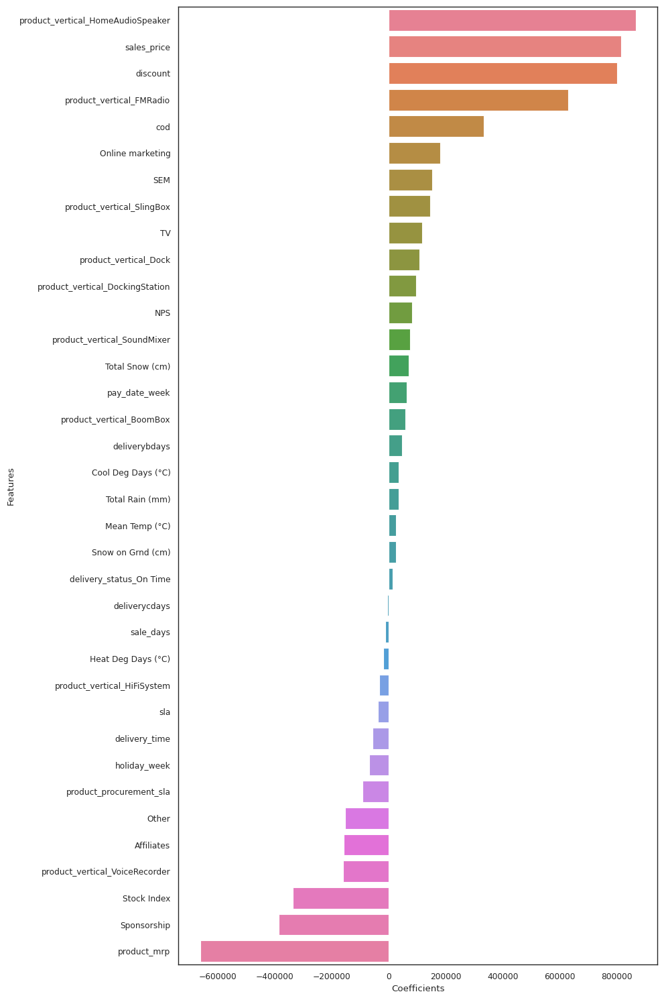

In [295]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_adlr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 2: Multiplicative Model



#### The Linear Regression Model that we built earlier is an additive model that has been an implicit assumption that the different KPIs affect the revenue additively.

  __Y = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ__

#### However when there are interactions between the KPIs, we go for a multiplicative model.

#### To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.

__Y = e^α .X1^β1 . X2^β2 . X3^β3 . X4^β4 . X5^β5 + ϵ__

__lnY = α + β1ln(X1) + β2ln(X2) + β3ln(X3) + β4ln(X4) + β5ln(X5) + ϵ'__

In [296]:
# Copying the data for model 2

cameraaccessory_model2_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model2_df = gaming_accessory_df.drop(columns="week")
#gamingaccessory_model2_df = gamingaccessory_model_df.copy()
homeaudio_model2_df = home_audio_df.drop(columns="week")


In [297]:
# Taking the log of all the features of the three categories

cameraaccessory_model2_df = cameraaccessory_model2_df.applymap(lambda x: np.log(x))
cameraaccessory_model2_df = cameraaccessory_model2_df.replace([np.inf, -np.inf], 0)
cameraaccessory_model2_df = cameraaccessory_model2_df.replace(np.nan, 0)

gamingaccessory_model2_df = gamingaccessory_model2_df.applymap(lambda x: np.log(x))
gamingaccessory_model2_df = gamingaccessory_model2_df.replace([np.inf, -np.inf], 0)
gamingaccessory_model2_df = gamingaccessory_model2_df.replace(np.nan, 0)

homeaudio_model2_df = homeaudio_model2_df.applymap(lambda x: np.log(x))
homeaudio_model2_df = homeaudio_model2_df.replace([np.inf, -np.inf], 0)
homeaudio_model2_df = homeaudio_model2_df.replace(np.nan, 0)

In [298]:
cameraaccessory_model2_df.head()

,gmv,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
0,15.397,8.568,6.830,3.917,7.474,0.000,0.000,1.769,1.058,5.986,9.644,8.342,3.761,5.620,6.261,5.513,1.099,1.099,3.434,0.000,0.000,3.367,4.466,0.000,6.653,0.000,0.693,5.352,7.611,0.000,0.000,6.426,0.000,0.000,3.258,0.000,3.434,8.300,6.118,0.000,0.000,2.920,0.091,-2.172,0.049,-1.492,1.745,0.611,0.049,-0.393,1.913,3.852,6.958,2.398,0.000,-2.708,2.887,0.000,2.063,0.847,2.322,0.000,0.000
1,15.238,8.239,7.004,3.904,7.610,-5.921,-5.825,1.881,0.982,5.892,9.580,7.985,3.761,5.568,6.057,5.352,1.946,0.693,3.689,0.000,0.000,3.045,4.317,0.000,6.358,0.000,0.693,5.380,7.000,0.000,0.000,6.205,0.000,0.000,3.555,0.000,3.296,8.099,5.323,0.000,0.000,2.920,0.091,-2.172,0.049,-1.492,1.745,0.611,0.049,-0.393,1.913,3.852,6.958,1.504,0.000,0.000,3.079,0.000,0.930,0.000,0.930,2.335,0.000
2,15.389,8.156,7.236,3.811,7.776,0.000,0.000,1.897,0.970,6.105,9.535,7.907,3.912,5.768,6.360,5.371,2.303,0.000,3.401,0.000,0.000,3.497,4.159,0.000,5.922,0.000,1.386,5.323,6.447,0.000,0.000,6.400,0.000,0.000,3.401,0.000,3.638,8.039,5.075,0.000,0.000,2.920,0.091,-2.172,0.049,-1.492,1.745,0.611,0.049,-0.393,1.913,3.852,6.958,1.705,0.000,0.000,2.986,0.000,0.000,0.000,0.000,0.000,0.000
3,15.420,8.607,6.820,3.952,7.509,-6.100,-5.877,1.848,1.004,5.976,9.870,8.358,3.584,5.832,6.827,5.434,1.609,0.000,3.611,0.000,0.000,3.912,4.344,0.000,6.335,0.000,1.386,5.513,7.550,0.000,0.000,6.346,0.000,0.000,3.584,0.000,3.761,8.471,5.587,0.000,0.000,2.263,-0.660,-0.960,0.852,-2.129,1.381,0.257,-0.025,0.000,0.000,3.919,7.108,2.565,0.000,1.163,2.695,0.000,1.224,0.000,1.224,0.000,0.693
4,15.304,8.260,7.047,3.832,7.654,0.000,0.000,1.842,0.964,5.943,9.543,7.983,3.807,5.694,6.702,5.278,0.693,0.000,3.555,0.000,0.000,3.555,4.477,0.000,6.178,0.000,1.609,5.481,6.564,0.000,0.000,6.280,0.000,0.000,3.738,0.000,3.664,8.124,5.242,0.000,0.000,2.263,-0.660,-0.960,0.852,-2.129,1.381,0.257,-0.025,0.000,0.000,3.919,7.108,1.609,0.000,0.000,3.229,0.000,0.000,0.981,0.981,0.693,0.693


In [299]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model2_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model2_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model2_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Train Test Splitting

In [300]:
# Train test split

cameraaccessory_model2_train, cameraaccessory_model2_test = train_test_split(cameraaccessory_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                             
gamingaccessory_model2_train, gamingaccessory_model2_test = train_test_split(gamingaccessory_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                              
homeaudio_model2_train, homeaudio_model2_test = train_test_split(homeaudio_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [301]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model2_train = cameraaccessory_model2_train.pop('gmv')
X_cameraaccessory_model2_train = cameraaccessory_model2_train

y_gamingaccessory_model2_train = gamingaccessory_model2_train.pop('gmv')
X_gamingaccessory_model2_train = gamingaccessory_model2_train

y_homeaudio_model2_train = homeaudio_model2_train.pop('gmv')
X_homeaudio_model2_train = homeaudio_model2_train

In [302]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model2_test = cameraaccessory_model2_test.pop('gmv')
X_cameraaccessory_model2_test = cameraaccessory_model2_test

y_gamingaccessory_model2_test = gamingaccessory_model2_test.pop('gmv')
X_gamingaccessory_model2_test = gamingaccessory_model2_test

y_homeaudio_model2_test = homeaudio_model2_test.pop('gmv')
X_homeaudio_model2_test = homeaudio_model2_test

Re-scalling the features using Standard scaler

In [303]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model2_train[X_cameraaccessory_model2_train.columns]=scaler.fit_transform(X_cameraaccessory_model2_train[X_cameraaccessory_model2_train.columns])
# Transform on test data
X_cameraaccessory_model2_test[X_cameraaccessory_model2_test.columns]=scaler.transform(X_cameraaccessory_model2_test[X_cameraaccessory_model2_test.columns])

In [304]:
X_cameraaccessory_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-3.39191,-3.80011,-1.64922,-4.76936,-2.18739,-2.15203,-2.36054,-4.83666,-3.22705,-1.28908,-3.03786,-3.14465,-3.23293,-3.21944,-3.18610,-2.08433,-0.75193,-2.07973,-0.37205,-0.46690,-2.37186,-3.13170,0.00000,-3.14991,0.00000,-0.84206,-3.22691,-2.70300,0.00000,0.00000,-3.42685,-0.17150,-0.17150,-3.03858,0.00000,-2.94874,-3.24097,-3.13408,0.00000,0.00000,-2.33862,-2.52161,-1.57946,-2.21316,-1.57845,-2.49454,-2.48648,-1.49420,-2.17845,-0.40685,-1.45166,-1.93813,-2.68128,-1.15988,-2.11830,-1.92229,-3.44266,-2.28596,-2.65189,-2.33697,-0.26711,-0.49179
25%,0.18218,-0.35625,-0.76428,-0.26378,-0.28252,-0.26218,-0.61319,-0.25414,0.21178,-1.28908,0.22579,0.09678,0.20480,0.22861,0.13476,-0.68629,-0.75193,-0.06124,-0.37205,-0.46690,-0.52093,0.11262,0.00000,0.17022,0.00000,-0.84206,0.19560,-0.21815,0.00000,0.00000,0.16688,-0.17150,-0.17150,-0.03571,0.00000,-0.10321,-0.02304,0.10018,0.00000,0.00000,-0.11852,-0.05861,-0.59441,-0.46730,-0.77312,0.03991,0.03705,-0.40928,0.49666,-0.40155,-0.76049,-0.77942,-0.40263,-1.15988,-0.15213,-0.96608,-0.54404,-0.48965,-0.14727,-0.55260,-0.26711,-0.49179
50%,0.27344,0.24170,-0.08958,0.06933,0.36773,0.33441,-0.00701,0.03471,0.2

Building a Linear Model for cameraaccessory

In [305]:
cameraaccessory_model2 = LinearRegression().fit(X_cameraaccessory_model2_train, y_cameraaccessory_model2_train)
y_cameraaccessory_model2_test_pred = cameraaccessory_model2.predict(X_cameraaccessory_model2_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred)))

R2 Score: 0.5370110304461431
Mean Squared Error: 0.045591979653765


In [306]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [307]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000002


Building Linear Regression Model for cameraccesory using K-fold Cross Validation

In [308]:
cameraaccessory_model2_cvdf = cameraaccessory_model2_df.copy()

y_cameraaccessory_model2_cvdf = cameraaccessory_model2_cvdf.pop('gmv')
X_cameraaccessory_model2_cvdf = cameraaccessory_model2_cvdf

In [309]:
cameraaccessory_model2_cv = LinearRegression().fit(X_cameraaccessory_model2_cvdf, y_cameraaccessory_model2_cvdf)
cameraaccessory_predictions_mcv = cross_val_predict(cameraaccessory_model2_cv, X_cameraaccessory_model2_cvdf, y_cameraaccessory_model2_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv)))

Cross-Predicted Accuracy: 0.9636399418482061
Mean Squared Error: 0.16741714907069116


In [310]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000003


Determining Feature Importance for cameraaccessory from model with cv

In [311]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_mul_lr_model_parameters = list(cameraaccessory_model2_cv.coef_)
cameraaccessory_mul_lr_model_parameters.insert(0, cameraaccessory_model2_cv.intercept_)
cameraaccessory_mul_lr_model_parameters = [round(x, 3) for x in cameraaccessory_mul_lr_model_parameters]
cols = X_cameraaccessory_model2_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_mul_lr_coef = list(zip(cols, cameraaccessory_mul_lr_model_parameters))

In [312]:
# Creating a dataframe of parameter coefficients

cameraaccessory_mul_lr_coef_df = pd.DataFrame(cameraaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.rename(columns=col_rename)
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.iloc[1:,:]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.loc[cameraaccessory_mul_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_mul_lr_coef_df

,Features,Coefficients
1,units,0.875
2,sales_price,0.826
6,deliverycdays,0.225
32,product_vertical_ReflectorUmbrella,0.132
9,luxuary_product,0.124
52,Stock Index,0.117
51,NPS,0.103
37,delivery_status_Early,0.088
4,product_mrp,0.086
58,Total Rain (mm),0.077


Plotting the Features in descending order of Importance for cameraaccessory

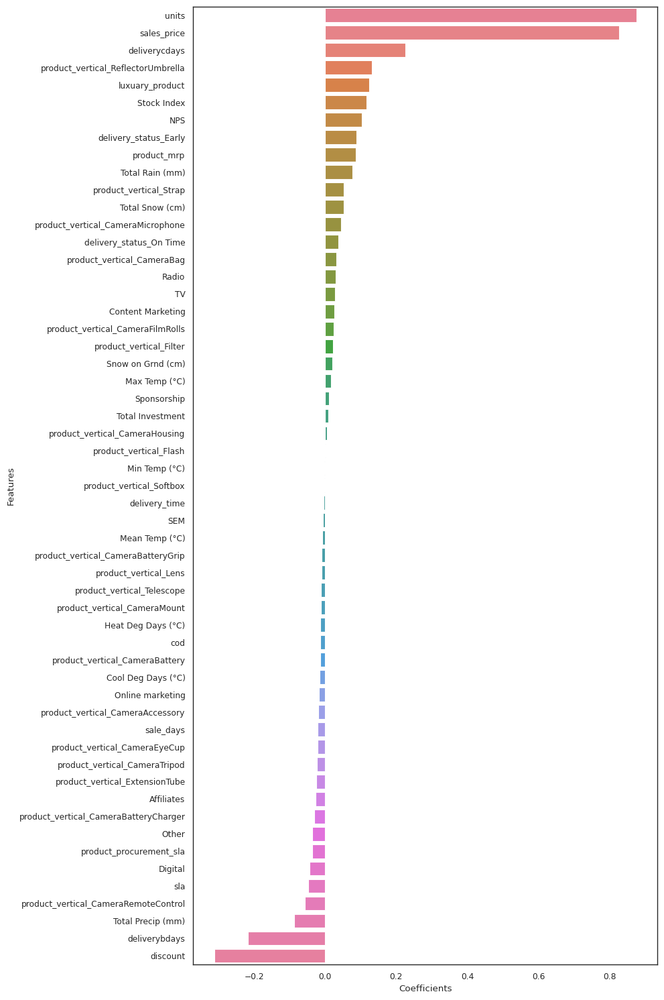

In [313]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [314]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model2_train[X_gamingaccessory_model2_train.columns]=scaler.fit_transform(X_gamingaccessory_model2_train[X_gamingaccessory_model2_train.columns])
# Transform on test data
X_gamingaccessory_model2_test[X_gamingaccessory_model2_test.columns]=scaler.transform(X_gamingaccessory_model2_test[X_gamingaccessory_model2_test.columns])

In [315]:
X_gamingaccessory_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-3.96073,-2.56145,-1.68312,-2.05125,-1.70115,-1.72372,-2.83785,-1.97917,-3.98586,-1.47388,-3.65965,0.00000,-4.12745,0.00000,-3.94339,-3.76877,-0.50549,0.00000,-3.74994,-3.78966,-2.90201,-3.86689,-3.66925,-1.14214,0.00000,-2.77879,0.00000,-3.59303,-3.66838,0.00000,0.00000,-2.58424,-2.88353,-1.40605,-2.41769,-1.77180,-2.84552,-2.83801,-1.48193,-2.18108,-0.35900,-1.24510,-2.06932,-2.72771,-1.23723,-2.28155,-1.71950,-3.35584,-2.25512,-0.24603,-2.26423,-0.25012,-0.49179
25%,0.03815,-0.63690,-0.59948,-0.46406,-1.19436,-1.19032,-0.50172,-0.65784,0.10247,-1.47388,0.12080,0.00000,0.10614,0.00000,0.07997,-0.00094,-0.50549,0.00000,-0.21506,-0.04194,-0.43555,0.05281,-0.25217,-1.14214,0.00000,-0.46080,0.00000,-0.23901,-0.24099,0.00000,0.00000,-0.21121,-0.15783,-0.59855,-0.53259,-0.60642,0.13891,0.14465,-0.46732,0.49669,-0.35335,-0.57968,-0.85652,-0.43173,-1.23723,-0.18141,-1.01977,-0.48832,-0.51231,-0.24603,-0.54650,-0.25012,-0.49179
50%,0.24951,0.04573,0.08421,-0.29076,0.53126,0.50202,0.01976,0.08320,0.24043,0.62499,0.33199,0.00000,0.20873,0.00000,0.25562,0.21031,-0.50549,0.00000,0.33987,0.15204,0.03326,0.16946,0.20261,0.08621,0.00000,-0.13422,0.00000,0.27620,0.23607,0.00000,0.00000,0.22098,0.38847,-0.19505,0.23930,0.05067,0.38855,0.41613,-0.21045,0.49669,-0.35335,-0.48234,0.50182,0.30215,0.12147,0.33409,0.13409,-0.48832,-0.35141,-0.24603,-0.16080,-0.25012,-0.49179
75%,0.34098,0.73535,0.30488,0.08919,0.91030,0.93564,0.44165,0.44829,0.35502,0.76560,0.42568,0.00000,0.35120,0.00000,0.39606,0.51892,-0.50549,0.00000,0.45674,0.44713,0.50643,0.32110,0.47249,0.72117,0.00000,0.67493,0.00000,0.57511,0.46778,0.00000,0.00000,0.684

Building Linear Regression model for gamingaccessory

In [316]:
gamingaccessory_model2 = LinearRegression().fit(X_gamingaccessory_model2_train, y_gamingaccessory_model2_train)
y_gamingaccessory_model2_test_pred = gamingaccessory_model2.predict(X_gamingaccessory_model2_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred)))

R2 Score: 0.9830955537164292
Mean Squared Error: 0.10657108522713417


In [317]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [318]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000005


Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [319]:
gamingaccessory_model2_cvdf = gamingaccessory_model2_df.copy()

y_gamingaccessory_model2_cvdf = gamingaccessory_model2_cvdf.pop('gmv')
X_gamingaccessory_model2_cvdf = gamingaccessory_model2_cvdf

In [320]:
gamingaccessory_model2_cv = LinearRegression().fit(X_gamingaccessory_model2_cvdf, y_gamingaccessory_model2_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model2_cv, X_gamingaccessory_model2_cvdf, y_gamingaccessory_model2_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv)

print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: -0.11725596251322545
Mean Squared Error: 4.470767570406669


In [321]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.7f}".format(NRMSE))

0.0000003


Determining Feature Importance for gamingaccessory with model without cv

In [322]:
# Fromatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# Linear regression model parameter
gamingaccessory_mul_lr_model_parameters = list(gamingaccessory_model2.coef_)
gamingaccessory_mul_lr_model_parameters.insert(0, gamingaccessory_model2.intercept_)
gamingaccessory_mul_lr_model_parameters = [round(x, 3) for x in gamingaccessory_mul_lr_model_parameters]
cols = X_gamingaccessory_model2_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_mul_lr_coef = list(zip(cols, gamingaccessory_mul_lr_model_parameters))

In [323]:
# Creating dataframe with parameters and coeffiecients

gamingaccessory_mul_lr_coef_df = pd.DataFrame(gamingaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.rename(columns=col_rename)
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.iloc[1:,:]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.loc[gamingaccessory_mul_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_GamePad,0.426
1,units,0.348
19,product_vertical_GamingHeadset,0.294
9,luxuary_product,0.199
16,product_vertical_GamingAdapter,0.139
28,delivery_status_Early,0.137
2,sales_price,0.088
45,Min Temp (°C),0.086
29,delivery_status_On Time,0.086
44,Max Temp (°C),0.072


Plotting the Features in descending order of Importance for gamongaccessory

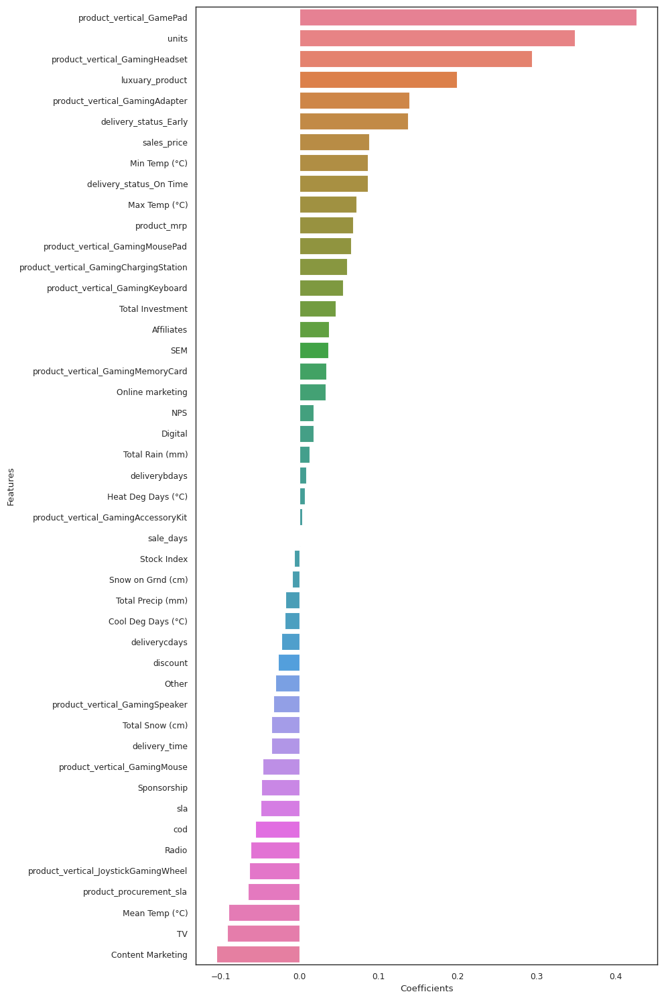

In [324]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [325]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model2_train[X_homeaudio_model2_train.columns]=scaler.fit_transform(X_homeaudio_model2_train[X_homeaudio_model2_train.columns])
# Transform on test data
X_homeaudio_model2_test[X_homeaudio_model2_test.columns]=scaler.transform(X_homeaudio_model2_test[X_homeaudio_model2_test.columns])

In [326]:
X_homeaudio_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000
mean,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550
min,-5.51635,-2.04163,-4.82858,-1.72858,-2.49359,-2.34682,-2.02180,-4.19680,-5.44990,-1.55852,-4.67060,0.00000,-4.71163,-4.09547,-1.48838,-5.31524,-4.49182,-5.45193,0.00000,0.00000,-0.17678,-0.56280,-5.05305,-4.59934,-4.79195,0.00000,0.00000,-3.46921,-4.27811,-1.49205,-2.91731,-1.73911,-4.10602,-4.07790,-1.67987,-2.63177,-0.42140,-1.37479,-1.77097,-3.70388,-1.01403,-3.32957,-1.84807,-0.65572,-2.31263,-1.87694,-2.31600,-0.36163,-0.35511
25%,0.03979,-0.49380,-0.24194,-0.64622,0.12436,0.15253,-0.64351,-0.57026,-0.03916,-1.55852,0.10685,0.00000,-0.23554,-0.38145,-0.35415,0.07423,-0.14911,-0.01952,0.00000,0.00000,-0.17678,-0.56280,-0.25323,-0.20389,-0.30145,0.00000,0.00000,-0.43880,-0.21854,-0.54516,-0.70711,-0.86210,0.24886,0.24874,-0.54459,0.44383,-0.41654,-0.56775,-1.27266,-0.47412,-1.01403,-0.77317,-1.17905,-0.65572,-0.47724,-0.27641,-0.55829,-0.36163,-0.35511
50%,0.21115,-0.08626,0.03632,-0.11215,0.41692,0.38852,0.02193,0.14867,0.12788,0.62554,0.29931,0.00000,0.01072,0.39550,0.17323,0.17252,0.23900,0.16943,0.00000,0.00000,-0.17678,-0.56280,0.18021,0.40502,0.25038,0.00000,0.00000,0.11311,0.35136,-0.15603,0.19790,0.13033,0.29576,0.32332,-0.25716,0.44383,-0.41654,-0.44969,0.48954,0.38371,0.09346,0.35009,0.35348,-0.65572,-0.38503,-0.27641,-0.05582,-0.36163,-0.35511
75%,0.28932,0.34726,0.42164,0.61447,0.60640,0.64389,0.61692,0.62142,0.32374,0.66962,0.37261,0.00000,0.70870,0.60499,0.88885,0.38701,0.54278,0.31806,0.00000,0.00000,-0.17678,0.57667,0.44052,0.53968,0.47987,0.00000,0.00000,0.73020,0.57338,0.52421,0.95073,0.49773,0.56447,0.54523,0.07083,0.44383,-0.41654,0.50737,0.81215,0.67879,0.97619,0.80788,0.97394,0.73966,0.67784,-0.27641,0.65889,-0.36163,-0.35511
max,0.53139,2.80024,1.54950,2.36658,0.90761,0.95257,2.97566,1.72359,0.75833,0.77203,0.64730,0.00000,1.09082,1.18465,1.79270,0.62488,1.21283,0.67564,0.00000,0.00000,5.65685,2.63608,1.40016,0.71637,1.25906,0.00000,0.00000,1.42609,0.93981,2.

Building Linear Regression model for homeaudio

In [327]:
homeaudio_model2 = LinearRegression().fit(X_homeaudio_model2_train, y_homeaudio_model2_train)
y_homeaudio_model2_test_pred = homeaudio_model2.predict(X_homeaudio_model2_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model2_test, y_homeaudio_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model2_test, y_homeaudio_model2_test_pred)))

R2 Score: 0.9170049456476003
Mean Squared Error: 0.02363903733703025


In [328]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [329]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model2_test, y_homeaudio_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000001


Building Linear Regression model for homeaudio using K-fold Cross Validation

In [330]:
homeaudio_model2_cvdf = homeaudio_model2_df.copy()

y_homeaudio_model2_cvdf = homeaudio_model2_cvdf.pop('gmv')
X_homeaudio_model2_cvdf = homeaudio_model2_cvdf

In [331]:
homeaudio_model2_cv = LinearRegression().fit(X_homeaudio_model2_cvdf, y_homeaudio_model2_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model2_cv, X_homeaudio_model2_cvdf, y_homeaudio_model2_cvdf, cv=10)
accuracy = metrics.r2_score(y_homeaudio_model2_cvdf, homeaudio_predictions_cv)

print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model2_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: -3351901959901.0044
Mean Squared Error: 4266281062851.9688


In [332]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model2_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.10774271523338837

Determining Feature Importance for homeaudio with model without cv

In [333]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# Linear regression model parameters
homeaudio_mul_lr_model_parameters = list(homeaudio_model2.coef_)
homeaudio_mul_lr_model_parameters.insert(0, homeaudio_model2.intercept_)
homeaudio_mul_lr_model_parameters = [round(x, 3) for x in homeaudio_mul_lr_model_parameters]
cols = X_homeaudio_model2_test.columns
cols = cols.insert(0, "constant")
homeaudio_mul_lr_coef = list(zip(cols, homeaudio_mul_lr_model_parameters))

In [334]:
# Creating a dataframe of parameters and coefficients

homeaudio_mul_lr_coef_df = pd.DataFrame(homeaudio_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.rename(columns=col_rename)
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.iloc[1:,:]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.loc[homeaudio_mul_lr_coef_df['Coefficients']!=0.0]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_mul_lr_coef_df

,Features,Coefficients
1,units,0.309
16,product_vertical_FMRadio,0.279
9,luxuary_product,0.261
18,product_vertical_HomeAudioSpeaker,0.237
2,sales_price,0.122
24,delivery_status_Early,0.122
25,delivery_status_On Time,0.109
44,Cool Deg Days (°C),0.093
43,Heat Deg Days (°C),0.073
41,Min Temp (°C),0.070


Plotting the Features in descending order of Importance for honeaudio

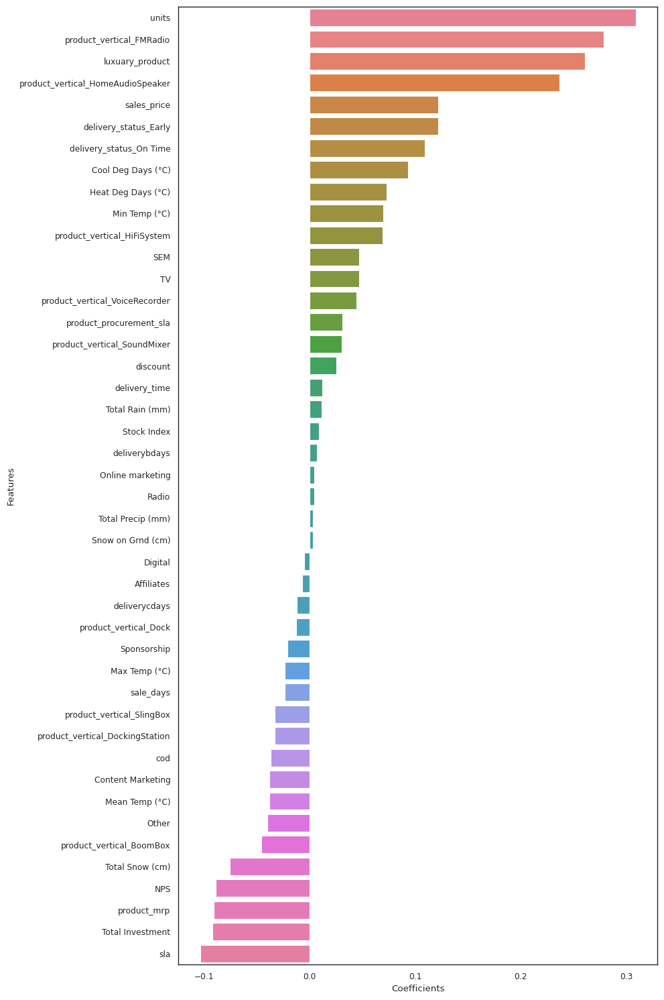

In [335]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 3: Koyck Model

#### The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.

#### The Koyck tells us that the current revenue generated is not just influenced by the different independent attributes, but also because of the revenue generated over the last periods. ie. Current revenue(Yt) is also dependent on the past revenue values(Yt-1).


  __Yt__ = __α__ +             __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__
  
  __Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

#### If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).

#### Therefore the total effect of advertising  = Current effect + Carry over effect

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

In [336]:
# Copying the datasets for preparing model data

cameraaccessory_model3_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model3_df = gaming_accessory_df.drop(columns="week")
homeaudio_model3_df = home_audio_df.drop(columns="week")

In [337]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model3_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model3_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model3_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [338]:
# Creating a function lag_variables that return a column gmv lag 
GMV_Lag = ['gmv']
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [339]:
# Calling above function

cameraaccessory_model3_df = lag_variables(cameraaccessory_model3_df,GMV_Lag,1) 
gamingaccessory_model3_df = lag_variables(gamingaccessory_model3_df,GMV_Lag,1) 
homeaudio_model3_df = lag_variables(homeaudio_model3_df,GMV_Lag,1) 

In [340]:
cameraaccessory_model3_df.head()

,gmv,gmv_lag1,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
0,4864060.000,NaN,5259,925.057,50.239,1761.009,0.000,0.000,5.864,2.879,398,15429,4198,43,276.000,524.000,248.000,3,3,31,0,0,29,87.000,0,775.000,0,2,211.000,2021.000,0,0,618.000,0,0,26,0,31,4024.000,454.000,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,11.000,-14.000,0.067,17.933,0.000,7.867,2.333,10.200,0.000,0.000
1,4148275.000,4864060.000,3787,1100.597,49.616,2018.785,0.003,0.003,6.557,2.669,362,14468,2938,43,262.000,427.000,211.000,7,2,40,0,0,21,75.000,0,577.000,0,2,217.000,1097.000,0,0,495.000,0,0,35,0,27,3291.000,205.000,1,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,4.500,-12.000,-3.733,21.733,0.000,2.533,0.000,2.533,10.333,0.000
2,4821065.000,4148275.000,3485,1388.394,45.209,2383.678,0.000,0.000,6.663,2.637,448,13837,2717,50,320.000,578.000,215.000,10,0,30,0,0,33,64.000,0,373.000,0,4,205.000,631.000,0,0,602.000,0,0,30,0,38,3100.000,160.000,0,0,18.549,1.095,0.114,1.050,0.225,5.725,1.842,1.050,0.675,6.773,47.093,1052.000,5.500,-9.000,-1.800,19.800,0.000,0.000,0.000,0.000,0.000,0.000
3,4976995.000,4821065.000,5468,915.918,52.036,1824.268,0.002,0.003,6.348,2.728,394,19348,4266,36,341.000,922.000,229.000,5,1,37,0,0,50,77.000,0,564.000,0,4,248.000,1900.000,0,0,570.000,0,0,36,0,43,4772.000,267.000,1,0,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327,1222.000,13.000,-5.500,3.200,14.800,0.000,3.400,0.000,3.400,0.000,2.000
4,4430402.000,4976995.000,3867,1149.143,46.151,2109.731,0.000,0.000,6.309,2.623,381,13952,2931,45,297.000,814.000,196.000,2,1,35,0,1,35,88.000,0,482.000,0,5,240.000,709.000,0,0,534.000,0,0,42,0,39,3373.000,189.000,0,1,9.610,0.517,0.383,2.345,0.119,3.978,1.293,0.975,0.000,0.000,50.327,1222.000,5.000,-18.000,-7.267,25.267,0.000,0.000,2.667,2.667,2.000,2.000


In [341]:
# Imputing the null value with 0

cameraaccessory_model3_df.fillna(value=0, inplace=True)
gamingaccessory_model3_df.fillna(value=0, inplace=True)
homeaudio_model3_df.fillna(value=0, inplace=True)

In [342]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model3_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model3_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model3_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Train Test Split

In [343]:
# Train test split

cameraaccessory_model3_train, cameraaccessory_model3_test = train_test_split(cameraaccessory_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                             
gamingaccessory_model3_train, gamingaccessory_model3_test = train_test_split(gamingaccessory_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                              
homeaudio_model3_train, homeaudio_model3_test = train_test_split(homeaudio_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [344]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model3_train = cameraaccessory_model3_train.pop('gmv')
X_cameraaccessory_model3_train = cameraaccessory_model3_train

y_gamingaccessory_model3_train = gamingaccessory_model3_train.pop('gmv')
X_gamingaccessory_model3_train = gamingaccessory_model3_train

y_homeaudio_model3_train = homeaudio_model3_train.pop('gmv')
X_homeaudio_model3_train = homeaudio_model3_train

In [345]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model3_test = cameraaccessory_model3_test.pop('gmv')
X_cameraaccessory_model3_test = cameraaccessory_model3_test

y_gamingaccessory_model3_test = gamingaccessory_model3_test.pop('gmv')
X_gamingaccessory_model3_test = gamingaccessory_model3_test

y_homeaudio_model3_test = homeaudio_model3_test.pop('gmv')
X_homeaudio_model3_test = homeaudio_model3_test

Re-scalling the features using Standard scaler

In [346]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model3_train[X_cameraaccessory_model3_train.columns]=scaler.fit_transform(X_cameraaccessory_model3_train[X_cameraaccessory_model3_train.columns])
# Transform on test data
X_cameraaccessory_model3_test[X_cameraaccessory_model3_test.columns]=scaler.transform(X_cameraaccessory_model3_test[X_cameraaccessory_model3_test.columns])

In [347]:
X_cameraaccessory_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.04056,-2.19587,-2.93099,-1.33659,-3.75550,-0.68710,-0.68721,-1.97888,-3.88052,-2.34122,-2.12696,-1.83456,-2.46018,-2.38539,-2.27773,-1.85848,-1.55120,-0.71484,-1.30365,-0.44652,-0.56408,-1.46823,-2.27652,0.00000,-1.91905,0.00000,-0.92108,-2.48631,-1.21104,-0.24618,0.00000,-2.30012,-0.23285,-0.42060,-1.98786,-0.17150,-1.78583,-1.57686,-1.64284,-0.81650,-0.67700,-1.38743,-1.23602,-0.61273,-1.12911,-0.64747,-1.75664,-1.82637,-0.66586,-0.45114,-0.44117,-1.35662,-1.90624,-1.95524,-2.47905,-2.24231,-0.94529,-0.74520,-0.78624,-0.27106,-0.84707,-0.24016,-0.36591
25%,-0.25049,-0.45357,-0.60383,-0.68265,-0.46404,-0.68710,-0.68721,-0.60074,-0.40291,-0.22792,-0.85859,-0.43639,-0.34407,-0.23041,-0.20356,-0.40431,-0.83995,-0.71484,-0.61809,-0.44652,-0.56408,-0.90311,-0.44039,0.00000,-0.40281,0.00000,-0.92108,-0.24394,-0.91946,-0.24618,0.00000,-0.38232,-0.23285,-0.42060,-0.54106,-0.17150,-0.62737,-0.86672,-0.43380,-0.81650,-0.67700,-0.55682,-0.83272,-0.43076,-0.80437,-0.60252,-0.75846,-0.70162,-0.38188,-0.45114,-0.44117,-0.75030,-0.81851,-0.71049,-0.72904,-0.55435,-0.94529,-0.74520,-0.68261,-0.27106,-0.70652,-0.24016,-0.36591
50

Building a Linear Model for cameraaccessory

In [348]:
cameraaccessory_model3 = LinearRegression().fit(X_cameraaccessory_model3_train, y_cameraaccessory_model3_train)
y_cameraaccessory_model3_test_pred = cameraaccessory_model3.predict(X_cameraaccessory_model3_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred)))

R2 Score: 0.905229271276028
Mean Squared Error: 435448387678.9989


In [349]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [350]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.05192243991717374

Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [351]:
cameraaccessory_model3_cvdf = cameraaccessory_model3_df.copy()

y_cameraaccessory_model3_cvdf = cameraaccessory_model3_cvdf.pop('gmv')
X_cameraaccessory_model3_cvdf = cameraaccessory_model3_cvdf

In [352]:
cameraaccessory_model3_cv = LinearRegression().fit(X_cameraaccessory_model3_cvdf, y_cameraaccessory_model3_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model3_cv, X_cameraaccessory_model3_cvdf, y_cameraaccessory_model3_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.869190789804509
Mean Squared Error: 517069365702.91565


In [353]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.05657976680800248

Determining Feature Importance for cameraaccessory from model without cv

In [354]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model3.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model3.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model3_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [355]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
10,luxuary_product,428275.077
32,product_vertical_Lens,382691.561
39,delivery_status_On Time,242475.533
20,product_vertical_CameraHousing,211491.436
25,product_vertical_CameraTripod,209512.580
28,product_vertical_Filter,199237.121
2,units,187228.180
14,product_vertical_CameraBag,160772.335
3,sales_price,147659.034
47,Online marketing,140624.735


Determining Total Effect of KPIs from Koyck model

In [356]:
# Calculating the coefficient of lag variable

cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   -32688.546
Name: Coefficients, dtype: float64

In [357]:
cameraaccessory_lr_coef_df['Total Effect'] = cameraaccessory_lr_coef_df['Coefficients']/(1-(-32688.546))
cameraaccessory_lr_coef_df

,Features,Coefficients,Total Effect
10,luxuary_product,428275.077,13.101
32,product_vertical_Lens,382691.561,11.707
39,delivery_status_On Time,242475.533,7.418
20,product_vertical_CameraHousing,211491.436,6.470
25,product_vertical_CameraTripod,209512.580,6.409
28,product_vertical_Filter,199237.121,6.095
2,units,187228.180,5.727
14,product_vertical_CameraBag,160772.335,4.918
3,sales_price,147659.034,4.517
47,Online marketing,140624.735,4.302


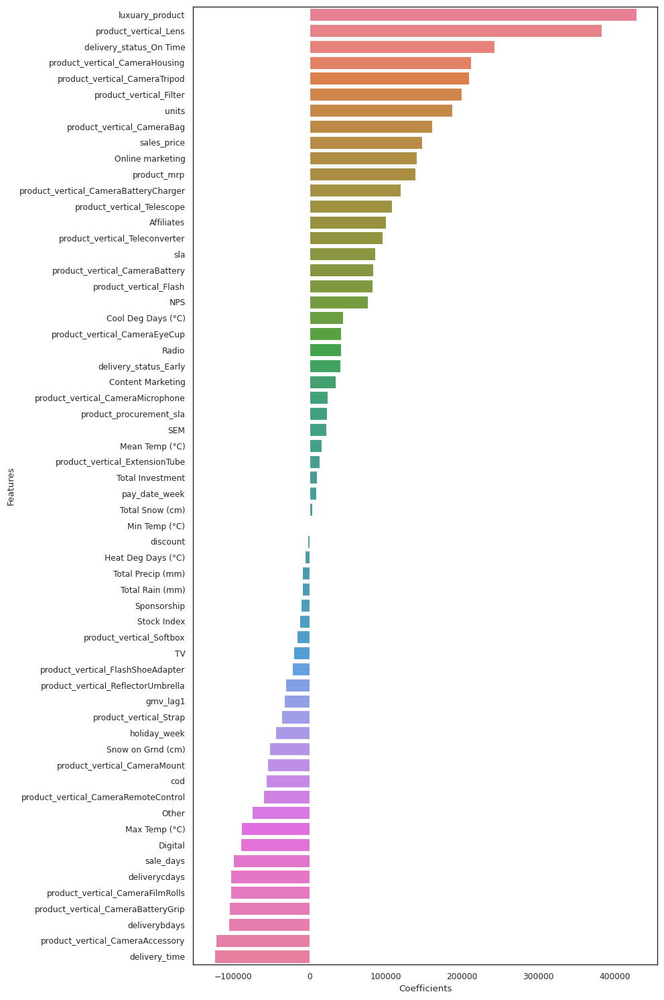

In [358]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [359]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model3_train[X_gamingaccessory_model3_train.columns]=scaler.fit_transform(X_gamingaccessory_model3_train[X_gamingaccessory_model3_train.columns])
# Transform on test data
X_gamingaccessory_model3_test[X_gamingaccessory_model3_test.columns]=scaler.transform(X_gamingaccessory_model3_test[X_gamingaccessory_model3_test.columns])

In [360]:
X_gamingaccessory_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.28401,-1.91774,-2.28775,-1.50351,-1.20151,-0.64339,-0.64366,-2.54570,-1.74806,-2.57226,-2.08536,-1.73165,-0.17150,-2.57962,0.00000,-2.61248,-2.21876,-0.56972,0.00000,-1.50096,-1.53305,-0.84913,-1.06569,-1.56484,-0.69882,0.00000,-0.97066,0.00000,-1.38831,-1.19248,-0.91766,-0.67700,-1.40587,-1.35338,-0.62119,-1.16025,-0.70408,-1.92880,-2.02096,-0.70054,-0.45135,-0.41311,-1.17090,-2.02826,-2.07185,-2.61674,-2.36746,-0.90625,-0.74768,-0.80402,-0.24605,-0.84746,-0.22888,-0.36591
25%,-0.44743,-0.55685,-0.70256,-0.59264,-0.42545,-0.64339,-0.64366,-0.52150,-0.66492,-0.41005,-0.95762,-0.46113,-0.17150,-0.41357,0.00000,-0.43062,-0.48384,-0.56972,0.00000,-0.89588,-0.47514,-0.61091,-0.34729,-0.66780,-0.66357,0.00000,-0.66853,0.00000,-0.83552,-0.62879,-0.91766,-0.67700,-0.61882,-0.92066,-0.48641,-0.84134,-0.66541,-0.42465,-0.35996,-0.45449,-0.45135,-0.41311,-0.58157,-0.89307,-0.77291,-0.76741,-0.57613,-0.87611,-0.74768,-0.71022,-0.24605,-0.74019,-0.22888,-0.36591
50%,-0.02228,-0.00130,-0.02544,0.03250,-0.31736,-0.64207,-0.64218,-0.01834,0.02103,0.04706,0.35627,0.09463,-0.17150,-0.07103,0.00000,0.09550,-0.06897,-0.56972,0.00000,0.07334,-0.20421,-0.39734,-0.20270,-0.11961,-0.34639,0.00000,-0.51746,0.00000,-0.12517,-0.13002,-0.91766,-0.67700,-0.16109,-0.01716,-0.37363,-0.25544,-0.24387,0.18004,0.30376,-0.35808,-0.45135,-0.41311,-0.49260,0.49292,0.13070,0.02516,0.07254,-0.32469,-0.74768,-0.44823,-0.24605,-0.39693,-0.22888,-0.36591
75%,0.36317,0.30473,0.73021,0.24323,-0.06071,1.38042,1.37841,0.40366,0.38281,0.50054,0.79289,0.41363,-0.17150,0.49819,0.00000,0.60614,0.72306,0.16880,0.00000

Building Linear Regression model for gamingaccessory

In [361]:
gamingaccessory_model3 = LinearRegression().fit(X_gamingaccessory_model3_train , y_gamingaccessory_model3_train)
y_gamingaccessory_model3_test_pred = gamingaccessory_model3.predict(X_gamingaccessory_model3_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred)))

R2 Score: 0.8720025477903368
Mean Squared Error: 170497315221.295


In [362]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [363]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.057276405797977784

Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [364]:
gamingaccessory_model3_cvdf = gamingaccessory_model3_df.copy()

y_gamingaccessory_model3_cvdf = gamingaccessory_model3_cvdf.pop('gmv')
X_gamingaccessory_model3_cvdf = gamingaccessory_model3_cvdf

In [365]:
gamingaccessory_model3_cv = LinearRegression().fit(X_gamingaccessory_model3_cvdf, y_gamingaccessory_model3_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model3_cv, X_gamingaccessory_model3_cvdf, y_gamingaccessory_model3_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: -8.375505640037664
Mean Squared Error: 15704272584833.959


In [366]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.549700203150233

Determining Feature Importance for gamingaccessory from model without cv

In [367]:
#Formatting the output 
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model3.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model3.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model3_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [368]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
10,luxuary_product,287794.652
20,product_vertical_GamingHeadset,285384.925
43,NPS,249823.726
2,units,212537.462
22,product_vertical_GamingMemoryCard,199252.686
47,Mean Temp (°C),148302.857
54,sale_days,136477.446
34,TV,134302.091
16,product_vertical_GamingAccessoryKit,130346.550
29,delivery_status_Early,115866.222


Determining Total Effect of KPIs from Koyck model

In [369]:
# Calculating the coefficient of lag variable
gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients


1   -5813.471
Name: Coefficients, dtype: float64

In [370]:
gamingaccessory_lr_coef_df['Total Effect'] = gamingaccessory_lr_coef_df['Coefficients']/(1-(-5813.471))
gamingaccessory_lr_coef_df

,Features,Coefficients,Total Effect
10,luxuary_product,287794.652,49.496
20,product_vertical_GamingHeadset,285384.925,49.082
43,NPS,249823.726,42.966
2,units,212537.462,36.553
22,product_vertical_GamingMemoryCard,199252.686,34.268
47,Mean Temp (°C),148302.857,25.506
54,sale_days,136477.446,23.472
34,TV,134302.091,23.098
16,product_vertical_GamingAccessoryKit,130346.550,22.418
29,delivery_status_Early,115866.222,19.927


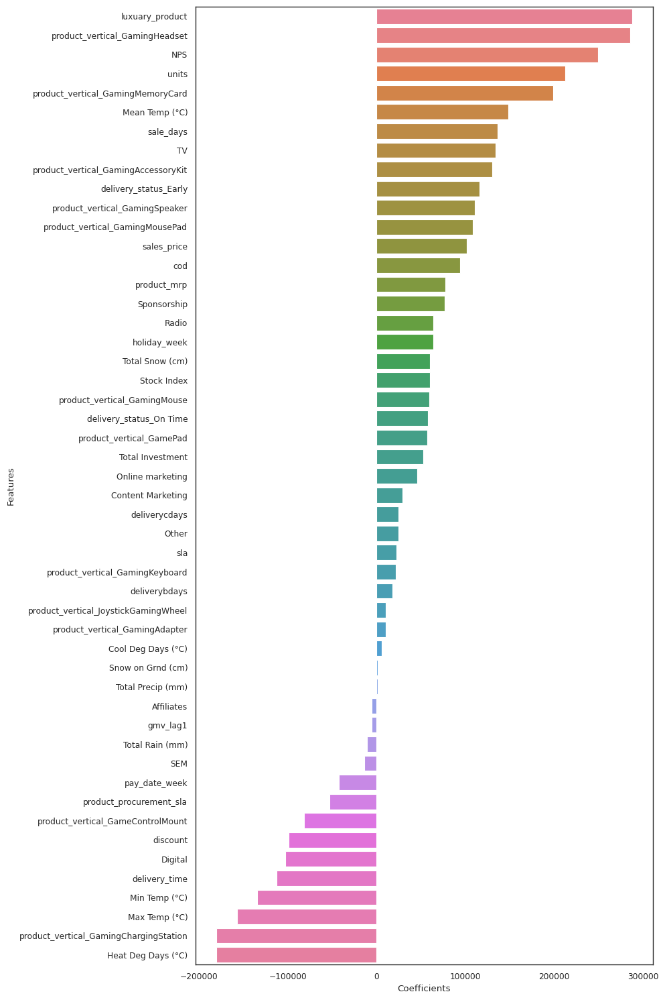

In [371]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [372]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model3_train[X_homeaudio_model3_train.columns]=scaler.fit_transform(X_homeaudio_model3_train[X_homeaudio_model3_train.columns])
# Transform on test data
X_homeaudio_model3_test[X_homeaudio_model3_test.columns]=scaler.transform(X_homeaudio_model3_test[X_homeaudio_model3_test.columns])

In [373]:
X_homeaudio_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,units,sales_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,luxuary_product,delivery_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,delivery_status_Early,delivery_status_On Time,pay_date_week,holiday_week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000
mean,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000
std,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550
min,-1.21177,-3.08179,-1.89602,-4.12435,-1.57692,-0.60878,-0.60932,-1.72232,-3.91560,-2.54669,-2.24188,-2.34815,0.00000,-2.10624,-2.03124,-1.09251,-2.89303,-2.37420,-2.61892,0.00000,0.00000,-0.24019,-0.59830,-2.20990,-1.85063,-1.88880,-0.75593,-0.80623,-1.58079,-1.57580,-0.63791,-1.19488,-0.74846,-2.25130,-2.38325,-0.73047,-0.44228,-0.43995,-1.30015,-1.73351,-1.95646,-2.25260,-1.99283,-1.06599,-0.63977,-0.77433,-0.45838,-0.80150,-0.31632,-0.28919
25%,-0.57506,-0.52839,-0.50753,-0.37939,-0.65571,-0.60878,-0.60932,-0.65433,-0.62745,-0.62227,-0.74143,-0.45180,0.00000,-0.64062,-0.83717,-0.57747,-0.35020,-0.54246,-0.62384,0.00000,0.00000,-0.24019,-0.59830,-0.67950,-0.96380,-0.78573,-0.75593,-0.80623,-0.71811,-0.87424,-0.46609,-0.86548,-0.70166,-0.04950,-0.01258,-0.45870,-0.44228,-0.43995,-0.57131,-1.27754,-0.87784,-0.70163,-0.95842,-1.01071,-0.63977,-0.68983,-0.45838,-0.70314,-0.31632,-0.28919
50%,-0.19527,0.13151,-0.11727,-0.04443,-0.16035,-0.60790,-0.60832,-0.05309,0.12448,-0.18756,0.45410,0.18031,0.00000,-0.32973,0.24835,-0.23411,-0.06077,0.04037,-0.07267,0.00000,0.00000,-0.24019,-0.59830,-0.04738,0.31874,0.00413,-0.75593,-0.80623,-0.21639,0.06229,-0.34423,-0.26030,-0.24222,0.07345,0.17784,-0.35220,-0.44228,-0.43995,-0.46127,0.47240,0.20078,0.12925,-0.02852,-0.14258,-0.63977,-0.44236,-0.45838,-0.34010,-0.31632,-0.28919
75%,0.23776,0.48673,0.30976,0.44635,0.56063,0.60044,0.60566,0.53838,0.63900,0.44861,0.64857,0.47310,0.00000,0.95824,0.68256,0.62429,0.69037,0.62320,0.46586,0.00000,0.00000,-0.24019,0.44085,0.45166,0.79303,0.48076,1.32288,1.24035,0.66171,0.70299,-0.00547,0.96242,0.20871,0.92165,0.83858,-0.20400,-0.44228,-0.43995,0.46448,0.81746,0.76578,0.79395,1.01491,0.97592,0.55975,0.22157,-0.45838,0.19641,-0.31632,-0.28919
max,4.97700,1.85558,2.97513,2.08218,2.54771,2.18803,2.19399,3.48667,1.90355,2.54002,1.25777,1.90549,0.00000,2.02415,2.36512,3.027

Building Linear Regression model for homeaudio

In [374]:
homeaudio_model3 = LinearRegression().fit(X_homeaudio_model3_train, y_homeaudio_model3_train)
y_homeaudio_model3_test_pred = homeaudio_model3.predict(X_homeaudio_model3_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model3_test, y_homeaudio_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model3_test, y_homeaudio_model3_test_pred)))

R2 Score: 0.9736153352746513
Mean Squared Error: 418577409274.3074


In [375]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [376]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model3_test, y_homeaudio_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.033748235978067184

Building Linear Regression model for homeaudio using K-fold Cross Validation

In [377]:
homeaudio_model3_cvdf = homeaudio_model3_df.copy()

y_homeaudio_model3_cvdf = homeaudio_model3_cvdf.pop('gmv')
X_homeaudio_model3_cvdf = homeaudio_model3_cvdf

In [378]:
homeaudio_model3_cv = LinearRegression().fit(X_homeaudio_model3_cvdf, y_homeaudio_model3_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model3_cv, X_homeaudio_model3_cvdf, y_homeaudio_model3_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model3_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model3_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7549562232038987
Mean Squared Error: 1612967559540.2395


In [379]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.06624849257662922

Determining Feature Importance for homeaudio with model without cv

In [380]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model3.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model3.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model3_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))

In [381]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
19,product_vertical_HomeAudioSpeaker,381659.904
2,units,351138.389
10,luxuary_product,214784.106
5,product_mrp,208381.007
25,delivery_status_Early,189434.152
17,product_vertical_FMRadio,172145.748
4,discount,153868.089
12,cod,122742.807
23,product_vertical_SoundMixer,114004.857
42,Min Temp (°C),113773.049


Determining Total Effect of KPIs from Koyck model

In [382]:
# Calculating the coefficient of lag variable

homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   67433.863
Name: Coefficients, dtype: float64

In [383]:
homeaudio_lr_coef_df['Total Effect'] = homeaudio_lr_coef_df['Coefficients']/(1-(67433.863))
homeaudio_lr_coef_df

,Features,Coefficients,Total Effect
19,product_vertical_HomeAudioSpeaker,381659.904,-5.660
2,units,351138.389,-5.207
10,luxuary_product,214784.106,-3.185
5,product_mrp,208381.007,-3.090
25,delivery_status_Early,189434.152,-2.809
17,product_vertical_FMRadio,172145.748,-2.553
4,discount,153868.089,-2.282
12,cod,122742.807,-1.820
23,product_vertical_SoundMixer,114004.857,-1.691
42,Min Temp (°C),113773.049,-1.687


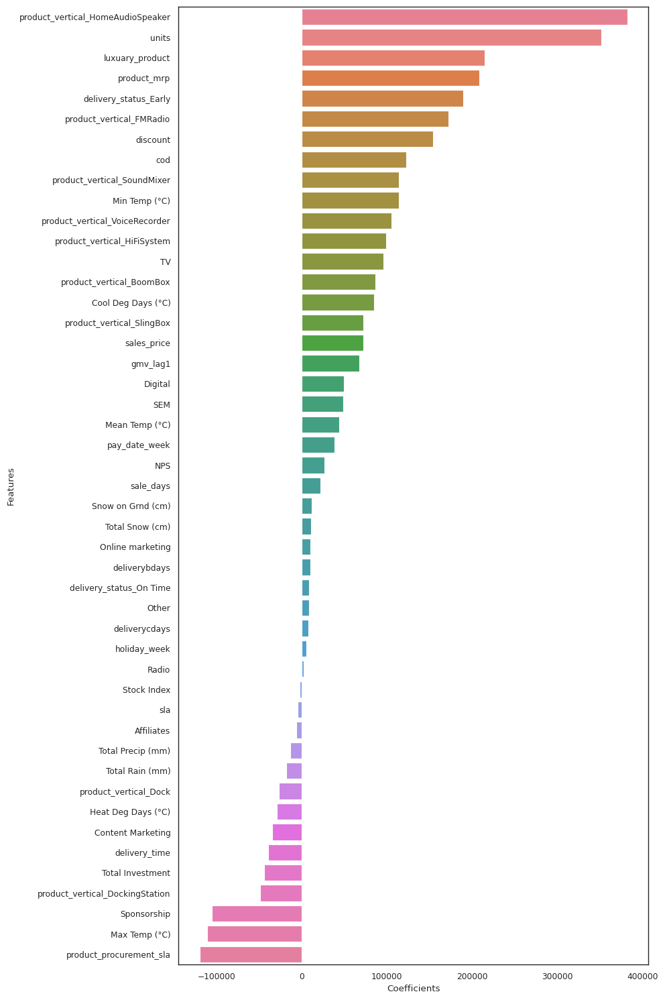

In [384]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 4: Distributive Lag Model (Additive)

#### The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.

#### In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables.

__Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ

In [385]:
# Copying the datasets for preparing model data

cameraaccessory_model4_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model4_df = gaming_accessory_df.drop(columns="week")
homeaudio_model4_df = home_audio_df.drop(columns="week")

In [386]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model4_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model4_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model4_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [387]:
cameraaccessory_model4_df_columns = cameraaccessory_model4_df.columns
gamingaccessory_model4_df_columns = gamingaccessory_model4_df.columns
homeaudio_model4_df_columns = homeaudio_model4_df.columns

In [388]:
# Caling the user defined function lag_variables

cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,3)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,3)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,3)

In [389]:
cameraaccessory_model4_df.head()

,gmv,gmv_lag3,units,units_lag3,sales_price,sales_price_lag3,discount,discount_lag3,product_mrp,product_mrp_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag3,delivery_time,delivery_time_lag3,cod,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag3,product_vertical_Telescope,product_vertical_Telescope_lag3,delivery_status_Early,delivery_status_Early_lag3,delivery_status_On Time,delivery_status_On Time_lag3,pay_date_week,pay_date_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,TV,TV_lag3,Digital,Digital_lag3,Sponsorship,Sponsorship_lag3,Content Marketing,Content Marketing_lag3,Online marketing,Online marketing_lag3,Affiliates,Affiliates_lag3,SEM,SEM_lag3,Radio,Radio_lag3,Other,Other_lag3,NPS,NPS_lag3,Stock Index,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,sale_days,sale_days_lag3
0,4864060.000,NaN,5259,NaN,925.057,NaN,50.239,NaN,1761.009,NaN,0.000,NaN,0.000,NaN,5.864,NaN,2.879,NaN,398,NaN,15429,NaN,4198,NaN,43,NaN,276.000,NaN,524.000,NaN,248.000,NaN,3,NaN,3,NaN,31,NaN,0,NaN,0,NaN,29,NaN,87.000,NaN,0,NaN,775.000,NaN,0,NaN,2,NaN,211.000,NaN,2021.000,NaN,0,NaN,0,NaN,618.000,NaN,0,NaN,0,NaN,26,NaN,0,NaN,31,NaN,4024.000,NaN,454.000,NaN,0,NaN,0,NaN,18.549,NaN,1.095,NaN,0.114,NaN,1.050,NaN,0.225,NaN,5.725,NaN,1.842,NaN,1.050,NaN,0.675,NaN,6.773,NaN,47.093,NaN,1052.000,NaN,11.000,NaN,-14.000,NaN,0.067,NaN,17.933,NaN,0.000,NaN,7.867,NaN,2.333,NaN,10.200,NaN,0.000,NaN,0.000,NaN
1,4148275.000,NaN,3787,NaN,1100.597,NaN,49.616,NaN,2018.785,NaN,0.003,NaN,0.003,NaN,6.557,NaN,2.669,NaN,362,NaN,14468,NaN,2938,NaN,43,NaN,262.000,NaN,427.000,NaN,211.000,NaN,7,NaN,2,NaN,40,NaN,0,NaN,0,NaN,21,NaN,75.000,NaN,0,NaN,577.000,NaN,0,NaN,2,NaN,217.000,NaN,1097.000,NaN,0,NaN,0,NaN,495.000,NaN,0,NaN,0,NaN,35,NaN,0,NaN,27,NaN,3291.000,NaN,205.000,NaN,1,NaN,0,NaN,18.549,NaN,1.095,NaN,0.114,NaN,1.050,NaN,0.225,NaN,5.725,NaN,1.842,NaN,1.050,NaN,0.675,NaN,6.773,NaN,47.093,NaN,1052.000,NaN,4.500,NaN,-12.000,NaN,-3.733,NaN,21.733,NaN,0.000,NaN,2.533,NaN,0.000,NaN,2.533,NaN,10.333,NaN,0.000,NaN

Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [390]:
cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,2)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,2)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,2)

In [391]:
cameraaccessory_model4_df.head()

,gmv,gmv_lag2,gmv_lag3,units,units_lag2,units_lag3,sales_price,sales_price_lag2,sales_price_lag3,discount,discount_lag2,discount_lag3,product_mrp,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag2,delivery_time_lag3,cod,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,product_vertical_Telescope,product_vertical_Telescope_lag2,product_vertical_Telescope_lag3,delivery_status_Early,delivery_status_Early_lag2,delivery_status_Early_lag3,delivery_status_On Time,delivery_status_On Time_lag2,delivery_status_On Time_lag3,pay_date_week,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,TV,TV_lag2,TV_lag3,Digital,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag2,SEM_lag3,Radio,Radio_lag2,Radio_lag3,Other,Other_lag2,Other_lag3,NPS,NPS_lag2,NPS_lag3,Stock Index,Stock Index_lag2,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag2,Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag2,Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag2,Heat Deg Days (°C)

Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [392]:
cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,1)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,1)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,1)

In [393]:
cameraaccessory_model4_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag1,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag1,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag1,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag1,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag1,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag1,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag1,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag1,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag1,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag1,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag1,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag1,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag1,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag1,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag1,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag1,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag1,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag1,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag1,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag1,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag1,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag1,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag1,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag1,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3

In [394]:
# Imputing the null values with 0

cameraaccessory_model4_df.fillna(value=0, inplace=True)
gamingaccessory_model4_df.fillna(value=0, inplace=True)
homeaudio_model4_df.fillna(value=0, inplace=True)

In [395]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model4_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model4_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model4_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Train Test Split

In [396]:
# Train test split

cameraaccessory_model4_train, cameraaccessory_model4_test = train_test_split(cameraaccessory_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                             
gamingaccessory_model4_train, gamingaccessory_model4_test = train_test_split(gamingaccessory_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                              
homeaudio_model4_train, homeaudio_model4_test = train_test_split(homeaudio_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [397]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model4_train = cameraaccessory_model4_train.pop('gmv')
X_cameraaccessory_model4_train = cameraaccessory_model4_train

y_gamingaccessory_model4_train = gamingaccessory_model4_train.pop('gmv')
X_gamingaccessory_model4_train = gamingaccessory_model4_train

y_homeaudio_model4_train = homeaudio_model4_train.pop('gmv')
X_homeaudio_model4_train = homeaudio_model4_train

In [398]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model4_test = cameraaccessory_model4_test.pop('gmv')
X_cameraaccessory_model4_test = cameraaccessory_model4_test

y_gamingaccessory_model4_test = gamingaccessory_model4_test.pop('gmv')
X_gamingaccessory_model4_test = gamingaccessory_model4_test

y_homeaudio_model4_test = homeaudio_model4_test.pop('gmv')
X_homeaudio_model4_test = homeaudio_model4_test

Re-scalling the features using Standard scaler

In [399]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model4_train[X_cameraaccessory_model4_train.columns]=scaler.fit_transform(X_cameraaccessory_model4_train[X_cameraaccessory_model4_train.columns])
# Transform on test data
X_cameraaccessory_model4_test[X_cameraaccessory_model4_test.columns]=scaler.transform(X_cameraaccessory_model4_test[X_cameraaccessory_model4_test.columns])

In [400]:
X_cameraaccessory_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag1,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag1,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag1,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag1,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag1,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag1,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag1,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag1,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag1,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag1,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag1,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag1,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag1,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag1,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag1,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag1,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag1,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag1,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag1,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag1,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag1,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag1,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag1,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag1,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,pro

Building a Linear Model for cameraaccessory

In [401]:
cameraaccessory_model4 = LinearRegression().fit(X_cameraaccessory_model4_train, y_cameraaccessory_model4_train)
y_cameraaccessory_model4_test_pred = cameraaccessory_model4.predict(X_cameraaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred)))

R2 Score: 0.9451092655208699
Mean Squared Error: 252209539266.81442


In [402]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [403]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.039515501989625904

Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [404]:
cameraaccessory_model4_cvdf = cameraaccessory_model4_df.copy()

y_cameraaccessory_model4_cvdf = cameraaccessory_model4_cvdf.pop('gmv')
X_cameraaccessory_model4_cvdf = cameraaccessory_model4_cvdf

In [405]:
cameraaccessory_model4_cv = LinearRegression().fit(X_cameraaccessory_model4_cvdf, y_cameraaccessory_model4_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model4_cv, X_cameraaccessory_model4_cvdf, y_cameraaccessory_model4_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.8506765495889823
Mean Squared Error: 590253405499.5548


In [406]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.0604513494127978

Determining Feature Importance for cameraaccessory from model without cv

In [407]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model4.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model4.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model4_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [408]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
36,luxuary_product,152226.885
124,product_vertical_Lens,135096.313
52,product_vertical_CameraBag,117710.257
108,product_vertical_Filter,114322.883
88,product_vertical_CameraRemoteControl,107586.905
4,units,106733.498
96,product_vertical_CameraTripod,102484.707
56,product_vertical_CameraBattery,100823.108
76,product_vertical_CameraHousing,100618.980
144,product_vertical_Telescope,92772.100


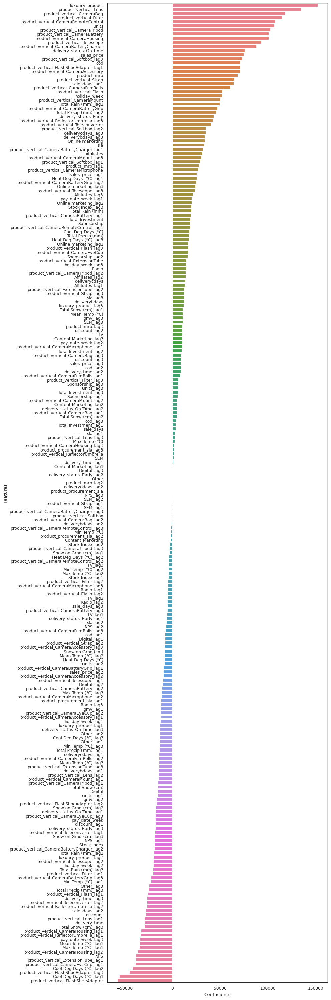

In [409]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [410]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model4_train[X_gamingaccessory_model4_train.columns]=scaler.fit_transform(X_gamingaccessory_model4_train[X_gamingaccessory_model4_train.columns])
# Transform on test data
X_gamingaccessory_model4_test[X_gamingaccessory_model4_test.columns]=scaler.transform(X_gamingaccessory_model4_test[X_gamingaccessory_model4_test.columns])

In [411]:
X_gamingaccessory_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_GameControlMount,product_vertical_GameControlMount_lag1,product_vertical_GameControlMount_lag2,product_vertical_GameControlMount_lag3,product_vertical_GamePad,product_vertical_GamePad_lag1,product_vertical_GamePad_lag2,product_vertical_GamePad_lag3,product_vertical_GameValueCards,product_vertical_GameValueCards_lag1,product_vertical_GameValueCards_lag2,product_vertical_GameValueCards_lag3,product_vertical_GamingAccessoryKit,product_vertical_GamingAccessoryKit_lag1,product_vertical_GamingAccessoryKit_lag2,product_vertical_GamingAccessoryKit_lag3,product_vertical_GamingAdapter,product_vertical_GamingAdapter_lag1,product_vertical_GamingAdapter_lag2,product_vertical_GamingAdapter_lag3,product_vertical_GamingChargingStation,product_vertical_GamingChargingStation_lag1,product_vertical_GamingChargingStation_lag2,product_vertical_GamingChargingStation_lag3,product_vertical_GamingConsole,product_vertical_GamingConsole_lag1,product_vertical_GamingConsole_lag2,product_vertical_GamingConsole_lag3,product_vertical_GamingHeadset,product_vertical_GamingHeadset_lag1,product_vertical_GamingHeadset_lag2,product_vertical_GamingHeadset_lag3,product_vertical_GamingKeyboard,product_vertical_GamingKeyboard_lag1,product_vertical_GamingKeyboard_lag2,product_vertical_GamingKeyboard_lag3,product_vertical_GamingMemoryCard,product_vertical_GamingMemoryCard_lag1,product_vertical_GamingMemoryCard_lag2,product_vertical_GamingMemoryCard_lag3,product_vertical_GamingMouse,product_vertical_GamingMouse_lag1,product_vertical_GamingMouse_lag2,product_vertical_GamingMouse_lag3,product_vertical_GamingMousePad,product_vertical_GamingMousePad_lag1,product_vertical_GamingMousePad_lag2,product_vertical_GamingMousePad_lag3,product_vertical_GamingSpeaker,product_vertical_GamingSpeaker_lag1,product_vertical_GamingSpeaker_lag2,product_vertical_GamingSpeaker_lag3,product_vertical_HandheldGamingConsole,product_vertical_HandheldGamingConsole_lag1,product_vertical_HandheldGamingConsole_lag2,product_vertical_HandheldGamingConsole_lag3,product_vertical_JoystickGamingWheel,product_vertical_JoystickGamingWheel_lag1,product_vertical_JoystickGamingWheel_lag2,product_vertical_JoystickGamingWheel_lag3,product_vertical_PhysicalGame,product_vertical_PhysicalGame_lag1,product_vertical_PhysicalGame_lag2,product_vertical_PhysicalGame_lag3,delivery_status_Early,delivery_status_Early_lag1,delivery_status_Early_lag2,delivery_status_Early_lag3,delivery_status_On Time,delivery_status_On Time_lag1,delivery_status_On Time_lag2,delivery_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock Index,Stock 

Building Linear Regression model for gamingaccessory

In [412]:
gamingaccessory_model4 = LinearRegression().fit(X_gamingaccessory_model4_train , y_gamingaccessory_model4_train)
y_gamingaccessory_model4_test_pred = gamingaccessory_model4.predict(X_gamingaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))

R2 Score: 0.9239750936369818
Mean Squared Error: 101267972143.7954


In [413]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [414]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.04414210523295493

Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [415]:
gamingaccessory_model4_cvdf = gamingaccessory_model4_df.copy()

y_gamingaccessory_model4_cvdf = gamingaccessory_model4_cvdf.pop('gmv')
X_gamingaccessory_model4_cvdf = gamingaccessory_model4_cvdf

In [416]:
gamingaccessory_model4_cv = LinearRegression().fit(X_gamingaccessory_model4_cvdf, y_gamingaccessory_model4_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model4_cv, X_gamingaccessory_model4_cvdf, y_gamingaccessory_model4_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.8969211790522298
Mean Squared Error: 172660330443.84927


In [417]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.05763857947319085

Determining Feature Importance for gamingaccessory from model without cv

In [418]:
#Formatting the output 
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model4.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model4.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model4_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [419]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
36,luxuary_product,153240.264
52,product_vertical_GamePad,133995.722
4,units,116939.614
80,product_vertical_GamingKeyboard,104747.488
76,product_vertical_GamingHeadset,103679.335
60,product_vertical_GamingAccessoryKit,101053.799
64,product_vertical_GamingAdapter,94078.919
44,cod,84093.295
88,product_vertical_GamingMouse,81309.284
96,product_vertical_GamingSpeaker,80395.813


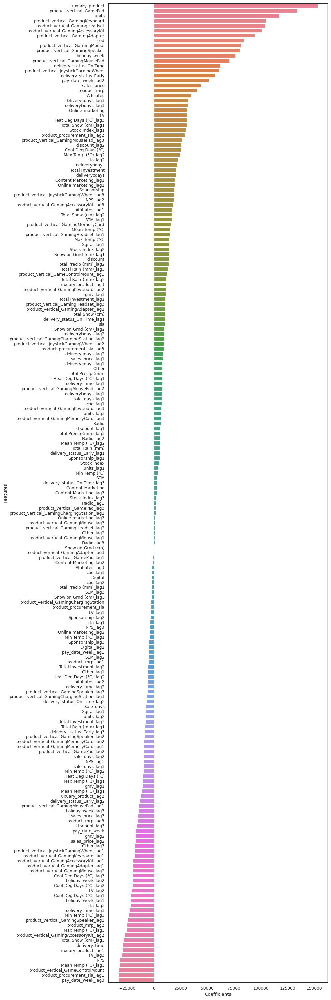

In [420]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [421]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model4_train[X_homeaudio_model4_train.columns]=scaler.fit_transform(X_homeaudio_model4_train[X_homeaudio_model4_train.columns])
# Transform on test data
X_homeaudio_model4_test[X_homeaudio_model4_test.columns]=scaler.transform(X_homeaudio_model4_test[X_homeaudio_model4_test.columns])

In [422]:
X_homeaudio_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_AudioMP3Player,product_vertical_AudioMP3Player_lag1,product_vertical_AudioMP3Player_lag2,product_vertical_AudioMP3Player_lag3,product_vertical_BoomBox,product_vertical_BoomBox_lag1,product_vertical_BoomBox_lag2,product_vertical_BoomBox_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_HomeTheatre,product_vertical_HomeTheatre_lag1,product_vertical_HomeTheatre_lag2,product_vertical_HomeTheatre_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,delivery_status_Early,delivery_status_Early_lag1,delivery_status_Early_lag2,delivery_status_Early_lag3,delivery_status_On Time,delivery_status_On Time_lag1,delivery_status_On Time_lag2,delivery_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag1,Heat Deg Days (°C)_lag2,Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag1,Cool Deg Days (°C)_lag2,Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag1,Total Rain (mm)_lag2,Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag1,Total Snow (cm)_lag2,Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag1,Total Precip (mm)_lag2,Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag1,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag3,sale

Building Linear Regression model for homeaudio

In [423]:
homeaudio_model4 = LinearRegression().fit(X_homeaudio_model4_train, y_homeaudio_model4_train)
y_homeaudio_model4_test_pred = homeaudio_model4.predict(X_homeaudio_model4_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model4_test, y_homeaudio_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model4_test, y_homeaudio_model4_test_pred)))

R2 Score: 0.765115555001161
Mean Squared Error: 3726305544902.0083


In [424]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [425]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model4_test, y_homeaudio_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.10069372698128506

Building Linear Regression model for homeaudio using K-fold Cross Validation

In [426]:
homeaudio_model4_cvdf = homeaudio_model4_df.copy()

y_homeaudio_model4_cvdf = homeaudio_model4_cvdf.pop('gmv')
X_homeaudio_model4_cvdf = homeaudio_model4_cvdf

In [427]:
homeaudio_model4_cv = LinearRegression().fit(X_homeaudio_model4_cvdf, y_homeaudio_model4_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model4_cv, X_homeaudio_model4_cvdf, y_homeaudio_model4_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model4_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model4_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.9035080419356579
Mean Squared Error: 635145279546.5449


In [428]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model4_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.041571885427929806

Determining Feature Importance for homeaudio with model with cv

In [429]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model4_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model4_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model4_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))

In [430]:
# Creating dataframe of parameter and coefficient

homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
96,delivery_status_Early,1460.890
4,units,1370.594
58,product_vertical_Dock_lag2,1108.548
97,delivery_status_Early_lag1,1016.583
103,delivery_status_On Time_lag3,971.796
8,sales_price,904.628
52,product_vertical_BoomBox,802.445
55,product_vertical_BoomBox_lag3,796.291
68,product_vertical_HiFiSystem,716.389
67,product_vertical_FMRadio_lag3,622.635


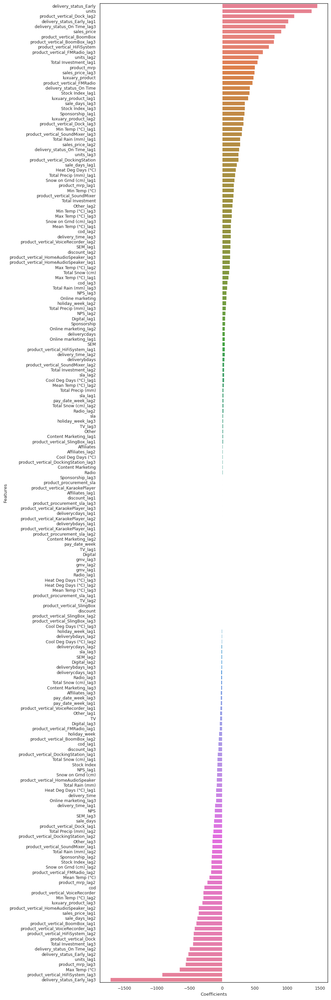

In [431]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 5: Distributive Lag Model (Multiplicative)

#### The Distributive Lag Model(Multiplicative) will help us capture the interactions between current and carry over effects of the KPIs.

#### To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.

  __Yt__ = α+ µ1ln(Yt-1) + µ2ln(Yt-2) + µ3ln(Yt-3) + ....

        + β1ln(X1t) + β1ln(X1t-1) + β1ln(X1t-2) + ....

        + β2ln(X2t) + β2ln(X2t-1) + β2ln(X2t-2) + ....

        + β3ln(X3t) + β3ln(X3t-1) + β3ln(X3t-2) + ....

        + β4ln(X4t) + β4ln(X4t-1) + β4ln(X4t-2) + ....

        + β5ln(X5t) + β5ln(X5t-1) + β5ln(X5t-2) + ....

        + ϵ'

In [432]:
# Copying the datasets for preparing model data

cameraaccessory_model5_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model5_df = gaming_accessory_df.drop(columns="week")
homeaudio_model5_df = home_audio_df.drop(columns="week")

In [433]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [434]:
cameraaccessory_model5_df_columns = cameraaccessory_model5_df.columns
gamingaccessory_model5_df_columns = gamingaccessory_model5_df.columns
homeaudio_model5_df_columns = homeaudio_model5_df.columns

In [435]:
# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,3)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,3)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,3)

Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [436]:
# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,2)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,2)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,2)

Creating new lag(Lag of 1 weeks) variables for the dependent variable (GMV) as well as independent variables

In [437]:
# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,1)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,1)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,1)

In [438]:
# Imputing the null values with 0

cameraaccessory_model5_df.fillna(value=0, inplace=True)
gamingaccessory_model5_df.fillna(value=0, inplace=True)
homeaudio_model5_df.fillna(value=0, inplace=True)

In [439]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Taking Logarithm of both the Dependent and the independent variables

In [440]:
cameraaccessory_model5_df = cameraaccessory_model5_df.applymap(lambda x: np.log(x))
cameraaccessory_model5_df = cameraaccessory_model5_df.replace([np.inf, -np.inf], 0)
cameraaccessory_model5_df = cameraaccessory_model5_df.replace(np.nan, 0)

gamingaccessory_model5_df = gamingaccessory_model5_df.applymap(lambda x: np.log(x))
gamingaccessory_model5_df = gamingaccessory_model5_df.replace([np.inf, -np.inf], 0)
gamingaccessory_model5_df = gamingaccessory_model5_df.replace(np.nan, 0)

homeaudio_model5_df = homeaudio_model5_df.applymap(lambda x: np.log(x))
homeaudio_model5_df = homeaudio_model5_df.replace([np.inf, -np.inf], 0)
homeaudio_model5_df = homeaudio_model5_df.replace(np.nan, 0)

In [441]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


Train Test Split

In [442]:
# Train test split

cameraaccessory_model5_train, cameraaccessory_model5_test = train_test_split(cameraaccessory_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                             
gamingaccessory_model5_train, gamingaccessory_model5_test = train_test_split(gamingaccessory_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)                                                              
homeaudio_model5_train, homeaudio_model5_test = train_test_split(homeaudio_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [443]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model5_train = cameraaccessory_model5_train.pop('gmv')
X_cameraaccessory_model5_train = cameraaccessory_model5_train

y_gamingaccessory_model5_train = gamingaccessory_model5_train.pop('gmv')
X_gamingaccessory_model5_train = gamingaccessory_model5_train

y_homeaudio_model5_train = homeaudio_model5_train.pop('gmv')
X_homeaudio_model5_train = homeaudio_model5_train

In [444]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model5_test = cameraaccessory_model5_test.pop('gmv')
X_cameraaccessory_model5_test = cameraaccessory_model5_test

y_gamingaccessory_model5_test = gamingaccessory_model5_test.pop('gmv')
X_gamingaccessory_model5_test = gamingaccessory_model5_test

y_homeaudio_model5_test = homeaudio_model5_test.pop('gmv')
X_homeaudio_model5_test = homeaudio_model5_test

Re-scalling the features using Standard scaler

In [445]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model5_train[X_cameraaccessory_model5_train.columns]=scaler.fit_transform(X_cameraaccessory_model5_train[X_cameraaccessory_model5_train.columns])
# Transform on test data
X_cameraaccessory_model5_test[X_cameraaccessory_model5_test.columns]=scaler.transform(X_cameraaccessory_model5_test[X_cameraaccessory_model5_test.columns])

In [446]:
X_cameraaccessory_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag1,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag1,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag1,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag1,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag1,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag1,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag1,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag1,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag1,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag1,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag1,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag1,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag1,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag1,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag1,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag1,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag1,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag1,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag1,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag1,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag1,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag1,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag1,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag1,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,pro

Building a Linear Model for cameraaccessory

In [447]:
cameraaccessory_model5 = LinearRegression().fit(X_cameraaccessory_model5_train, y_cameraaccessory_model5_train)
y_cameraaccessory_model5_test_pred = cameraaccessory_model5.predict(X_cameraaccessory_model5_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred)))

R2 Score: -0.18586035014478175
Mean Squared Error: 0.11677539749619967


In [448]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [449]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000003


Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [450]:
cameraaccessory_model5_cvdf = cameraaccessory_model5_df.copy()

y_cameraaccessory_model5_cvdf = cameraaccessory_model5_cvdf.pop('gmv')
X_cameraaccessory_model5_cvdf = cameraaccessory_model5_cvdf

In [451]:
cameraaccessory_model5_cv = LinearRegression().fit(X_cameraaccessory_model5_cvdf, y_cameraaccessory_model5_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model5_cv, X_cameraaccessory_model5_cvdf, y_cameraaccessory_model5_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9570076882798639
Mean Squared Error: 0.19795486107572516


In [452]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000004


Determining Feature Importance for cameraaccessory from model with cv

In [453]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model5_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model5_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model5_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [454]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
4,units,0.162
124,product_vertical_Lens,0.132
36,luxuary_product,0.112
148,delivery_status_Early,0.108
56,product_vertical_CameraBattery,0.106
52,product_vertical_CameraBag,0.097
60,product_vertical_CameraBatteryCharger,0.093
44,cod,0.088
108,product_vertical_Filter,0.074
96,product_vertical_CameraTripod,0.073


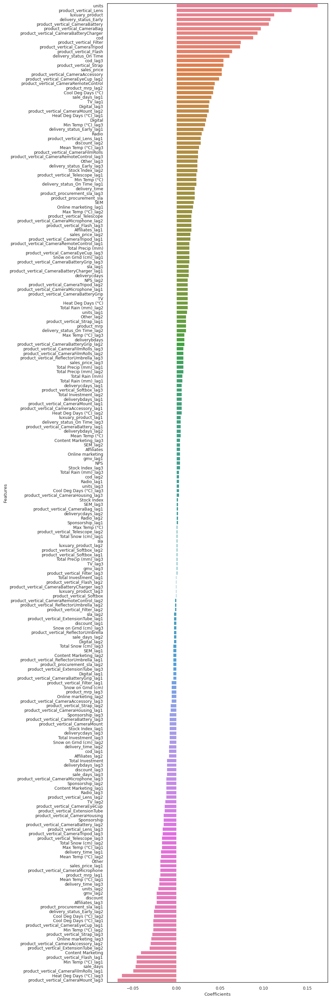

In [455]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [456]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model5_train[X_gamingaccessory_model5_train.columns]=scaler.fit_transform(X_gamingaccessory_model5_train[X_gamingaccessory_model5_train.columns])
# Transform on test data
X_gamingaccessory_model5_test[X_gamingaccessory_model5_test.columns]=scaler.transform(X_gamingaccessory_model5_test[X_gamingaccessory_model5_test.columns])

In [457]:
X_gamingaccessory_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_GameControlMount,product_vertical_GameControlMount_lag1,product_vertical_GameControlMount_lag2,product_vertical_GameControlMount_lag3,product_vertical_GamePad,product_vertical_GamePad_lag1,product_vertical_GamePad_lag2,product_vertical_GamePad_lag3,product_vertical_GameValueCards,product_vertical_GameValueCards_lag1,product_vertical_GameValueCards_lag2,product_vertical_GameValueCards_lag3,product_vertical_GamingAccessoryKit,product_vertical_GamingAccessoryKit_lag1,product_vertical_GamingAccessoryKit_lag2,product_vertical_GamingAccessoryKit_lag3,product_vertical_GamingAdapter,product_vertical_GamingAdapter_lag1,product_vertical_GamingAdapter_lag2,product_vertical_GamingAdapter_lag3,product_vertical_GamingChargingStation,product_vertical_GamingChargingStation_lag1,product_vertical_GamingChargingStation_lag2,product_vertical_GamingChargingStation_lag3,product_vertical_GamingConsole,product_vertical_GamingConsole_lag1,product_vertical_GamingConsole_lag2,product_vertical_GamingConsole_lag3,product_vertical_GamingHeadset,product_vertical_GamingHeadset_lag1,product_vertical_GamingHeadset_lag2,product_vertical_GamingHeadset_lag3,product_vertical_GamingKeyboard,product_vertical_GamingKeyboard_lag1,product_vertical_GamingKeyboard_lag2,product_vertical_GamingKeyboard_lag3,product_vertical_GamingMemoryCard,product_vertical_GamingMemoryCard_lag1,product_vertical_GamingMemoryCard_lag2,product_vertical_GamingMemoryCard_lag3,product_vertical_GamingMouse,product_vertical_GamingMouse_lag1,product_vertical_GamingMouse_lag2,product_vertical_GamingMouse_lag3,product_vertical_GamingMousePad,product_vertical_GamingMousePad_lag1,product_vertical_GamingMousePad_lag2,product_vertical_GamingMousePad_lag3,product_vertical_GamingSpeaker,product_vertical_GamingSpeaker_lag1,product_vertical_GamingSpeaker_lag2,product_vertical_GamingSpeaker_lag3,product_vertical_HandheldGamingConsole,product_vertical_HandheldGamingConsole_lag1,product_vertical_HandheldGamingConsole_lag2,product_vertical_HandheldGamingConsole_lag3,product_vertical_JoystickGamingWheel,product_vertical_JoystickGamingWheel_lag1,product_vertical_JoystickGamingWheel_lag2,product_vertical_JoystickGamingWheel_lag3,product_vertical_PhysicalGame,product_vertical_PhysicalGame_lag1,product_vertical_PhysicalGame_lag2,product_vertical_PhysicalGame_lag3,delivery_status_Early,delivery_status_Early_lag1,delivery_status_Early_lag2,delivery_status_Early_lag3,delivery_status_On Time,delivery_status_On Time_lag1,delivery_status_On Time_lag2,delivery_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock Index,Stock 

Building Linear Regression model for gamingaccessory

In [458]:
gamingaccessory_model5 = LinearRegression().fit(X_gamingaccessory_model5_train , y_gamingaccessory_model5_train)
y_gamingaccessory_model5_test_pred = gamingaccessory_model5.predict(X_gamingaccessory_model5_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred)))

R2 Score: 0.8688650665216591
Mean Squared Error: 0.8267169440241959


In [459]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [460]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000013


Building Linear Regression model for gamingaccessory using K-fold Cross Validation

In [461]:
gamingaccessory_model5_cvdf = gamingaccessory_model5_df.copy()

y_gamingaccessory_model5_cvdf = gamingaccessory_model5_cvdf.pop('gmv')
X_gamingaccessory_model5_cvdf = gamingaccessory_model5_cvdf

In [462]:
gamingaccessory_model5_cv = LinearRegression().fit(X_gamingaccessory_model5_cvdf, y_gamingaccessory_model5_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model5_cv, X_gamingaccessory_model5_cvdf, y_gamingaccessory_model5_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9083685808731984
Mean Squared Error: 0.3666686872191087


In [463]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000008


Determining Feature Importance for gamingaccessory from model with cv

In [464]:
#Formatting the output 
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model5_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model5_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model5_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [465]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
52,product_vertical_GamePad,0.157
4,units,0.144
112,delivery_status_Early,0.124
36,luxuary_product,0.119
88,product_vertical_GamingMouse,0.108
60,product_vertical_GamingAccessoryKit,0.086
76,product_vertical_GamingHeadset,0.083
80,product_vertical_GamingKeyboard,0.077
8,sales_price,0.074
192,Cool Deg Days (°C),0.073


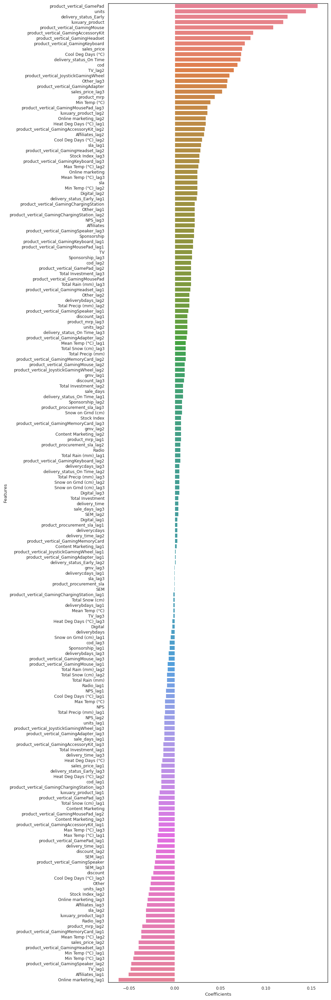

In [466]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

Re-scalling the features using Standard scaler

In [467]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model5_train[X_homeaudio_model5_train.columns]=scaler.fit_transform(X_homeaudio_model5_train[X_homeaudio_model5_train.columns])
# Transform on test data
X_homeaudio_model5_test[X_homeaudio_model5_test.columns]=scaler.transform(X_homeaudio_model5_test[X_homeaudio_model5_test.columns])

In [468]:
X_homeaudio_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sales_price,sales_price_lag1,sales_price_lag2,sales_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,luxuary_product,luxuary_product_lag1,luxuary_product_lag2,luxuary_product_lag3,delivery_time,delivery_time_lag1,delivery_time_lag2,delivery_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_AudioMP3Player,product_vertical_AudioMP3Player_lag1,product_vertical_AudioMP3Player_lag2,product_vertical_AudioMP3Player_lag3,product_vertical_BoomBox,product_vertical_BoomBox_lag1,product_vertical_BoomBox_lag2,product_vertical_BoomBox_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_HomeTheatre,product_vertical_HomeTheatre_lag1,product_vertical_HomeTheatre_lag2,product_vertical_HomeTheatre_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,delivery_status_Early,delivery_status_Early_lag1,delivery_status_Early_lag2,delivery_status_Early_lag3,delivery_status_On Time,delivery_status_On Time_lag1,delivery_status_On Time_lag2,delivery_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag1,Heat Deg Days (°C)_lag2,Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag1,Cool Deg Days (°C)_lag2,Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag1,Total Rain (mm)_lag2,Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag1,Total Snow (cm)_lag2,Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag1,Total Precip (mm)_lag2,Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag1,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)_lag3,sale

Building Linear Regression model for homeaudio

In [469]:
homeaudio_model5 = LinearRegression().fit(X_homeaudio_model5_train, y_homeaudio_model5_train)
y_homeaudio_model5_test_pred = homeaudio_model5.predict(X_homeaudio_model5_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model5_test, y_homeaudio_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model5_test, y_homeaudio_model5_test_pred)))

R2 Score: -2.2193014663990422
Mean Squared Error: 0.9169364145511019


In [470]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [471]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model5_test, y_homeaudio_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000005


Building Linear Regression model for homeaudio using K-fold Cross Validation

In [472]:
homeaudio_model5_cvdf = homeaudio_model5_df.copy()

y_homeaudio_model5_cvdf = homeaudio_model5_cvdf.pop('gmv')
X_homeaudio_model5_cvdf = homeaudio_model5_cvdf

In [473]:
homeaudio_model5_cv = LinearRegression().fit(X_homeaudio_model5_cvdf, y_homeaudio_model5_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model5_cv, X_homeaudio_model5_cvdf, y_homeaudio_model5_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model5_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model5_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7181448988597647
Mean Squared Error: 0.3587435118472162


In [474]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model5_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000003


Determining Feature Importance for homeaudio with model with cv

In [475]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model5_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model5_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model5_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))

In [476]:
# Creating dataframe of parameters and coefficients

homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
4,units,0.157
72,product_vertical_HomeAudioSpeaker,0.151
36,luxuary_product,0.145
96,delivery_status_Early,0.130
44,cod,0.111
64,product_vertical_FMRadio,0.107
100,delivery_status_On Time,0.082
92,product_vertical_VoiceRecorder,0.079
52,product_vertical_BoomBox,0.061
56,product_vertical_Dock,0.043


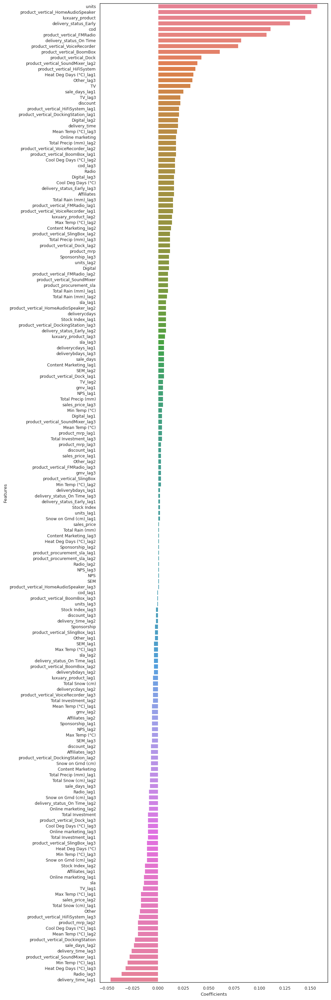

In [477]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

## Step 4: Model Selection and Evalualtion

### Model Selection

We will be checking the statistics of the each Model scores for the Camera Accessory, Gaming Accessory and Home Audio.

Camera Accessory

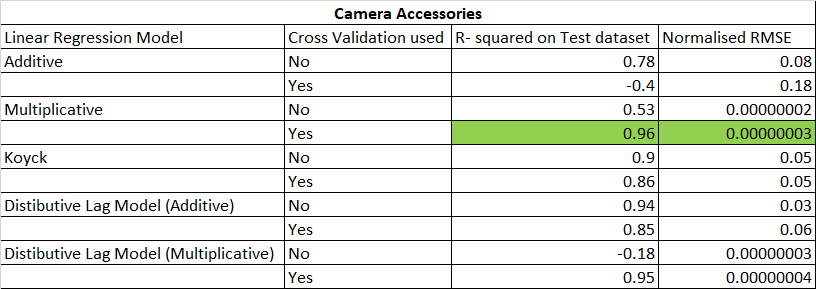

For Camera Accessory we will be slecting the Multiplicative Model with Cross Validation as it gives high accuracy than all other models. Let us check the KPI received from this Model.


In [509]:
# Top 5 postively correlated KPI

cam_p = cameraaccessory_mul_lr_coef_df.iloc[:5,:]
cam_p

,Features,Coefficients
1,units,0.875
2,sales_price,0.826
6,deliverycdays,0.225
32,product_vertical_ReflectorUmbrella,0.132
9,luxuary_product,0.124


In [511]:
# Top 5 negatively correlated KPI

cam_n = cameraaccessory_mul_lr_coef_df.iloc[-1:-6:-1,:]
cam_n

,Features,Coefficients
3,discount,-0.312
5,deliverybdays,-0.217
60,Total Precip (mm),-0.087
22,product_vertical_CameraRemoteControl,-0.056
7,sla,-0.048


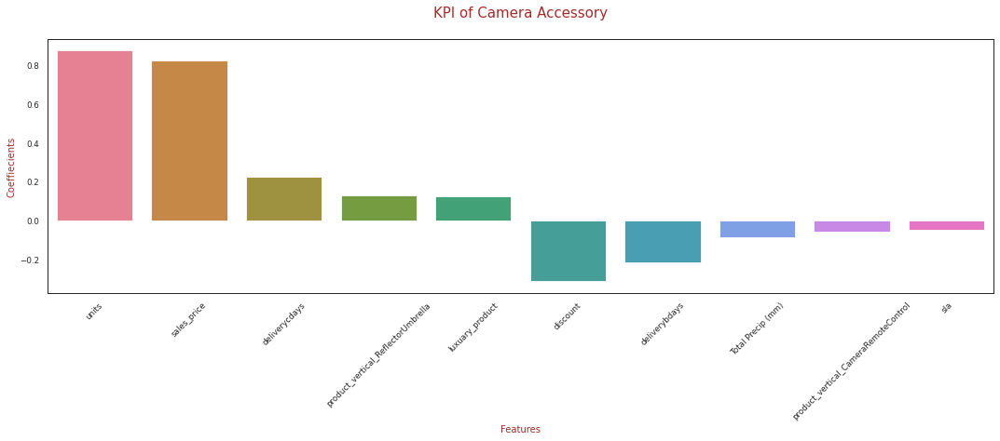

In [534]:
# Plotting the KPI
cam = pd.concat([cam_p,cam_n], axis=0)
cam.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=cam, estimator=np.sum)
plt.title("KPI of Camera Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

Gaming Accessory

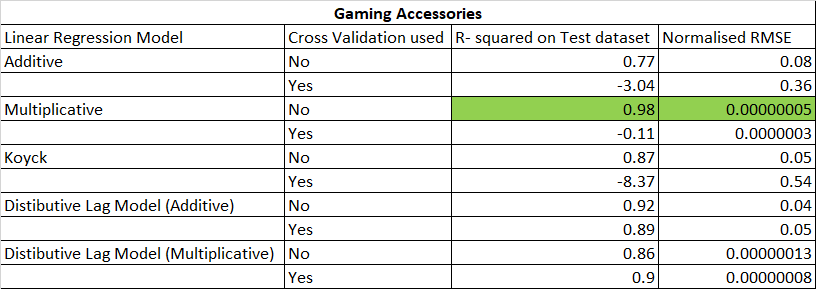

For Camera Accessory we will be slecting the Multiplicative Model as it gives high accuracy than all other models. Let us check the KPI received from this Model.

In [535]:
# Top 5 postively correlated KPI

game_p = gamingaccessory_mul_lr_coef_df.iloc[:5,:]
game_p

,Features,Coefficients
13,product_vertical_GamePad,0.426
1,units,0.348
19,product_vertical_GamingHeadset,0.294
9,luxuary_product,0.199
16,product_vertical_GamingAdapter,0.139


In [536]:
# Top 5 negatively correlated KPI

game_n = gamingaccessory_mul_lr_coef_df.iloc[-1:-6:-1,:]
game_n

,Features,Coefficients
36,Content Marketing,-0.105
33,TV,-0.092
46,Mean Temp (°C),-0.090
8,product_procurement_sla,-0.065
26,product_vertical_JoystickGamingWheel,-0.064


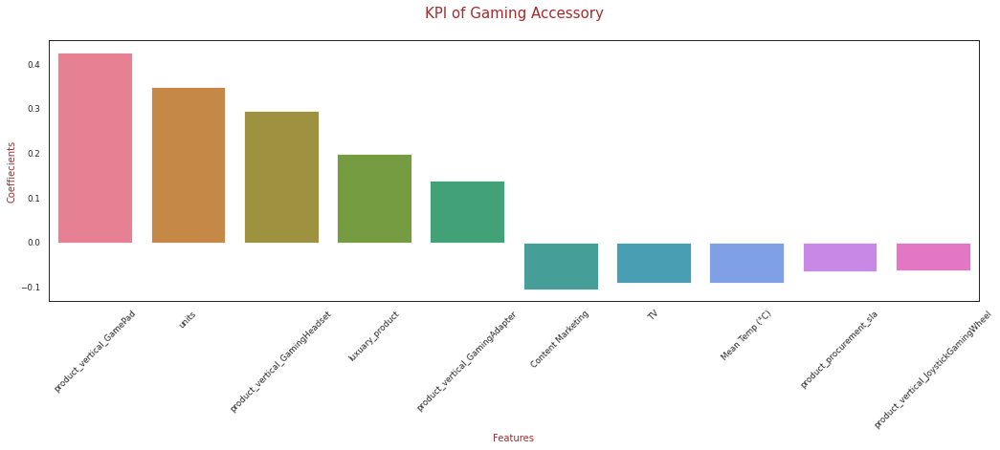

In [538]:
# Plotting the KPI
game = pd.concat([game_p,game_n], axis=0)
game.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=game, estimator=np.sum)
plt.title("KPI of Gaming Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

Home Audio

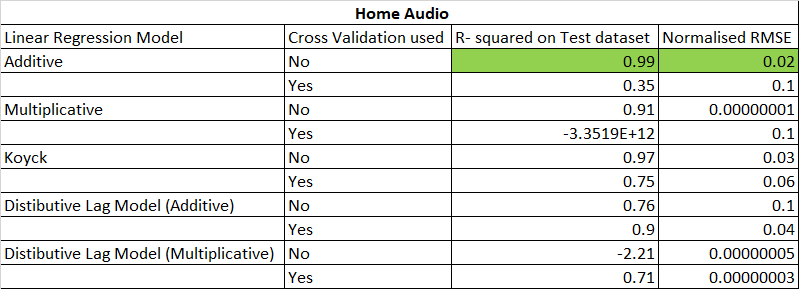

For Camera Accessory we will be slecting the Additive Model as it gives high accuracy than all other models. Let us check the KPI received from this Model.

In [539]:
# Top 5 postively correlated KPI

aud_p = homeaudio_adlr_coef_df.iloc[:5,:]
aud_p

,Features,Coefficients
15,product_vertical_HomeAudioSpeaker,867299.674
1,sales_price,816468.372
2,discount,802829.222
13,product_vertical_FMRadio,629291.144
9,cod,334282.906


In [540]:
# Top 5 negatively correlated KPI

aud_n = homeaudio_adlr_coef_df.iloc[-1:-6:-1,:]
aud_n

,Features,Coefficients
3,product_mrp,-663277.019
24,Sponsorship,-387736.604
30,Stock Index,-337136.544
19,product_vertical_VoiceRecorder,-160880.199
26,Affiliates,-159545.335


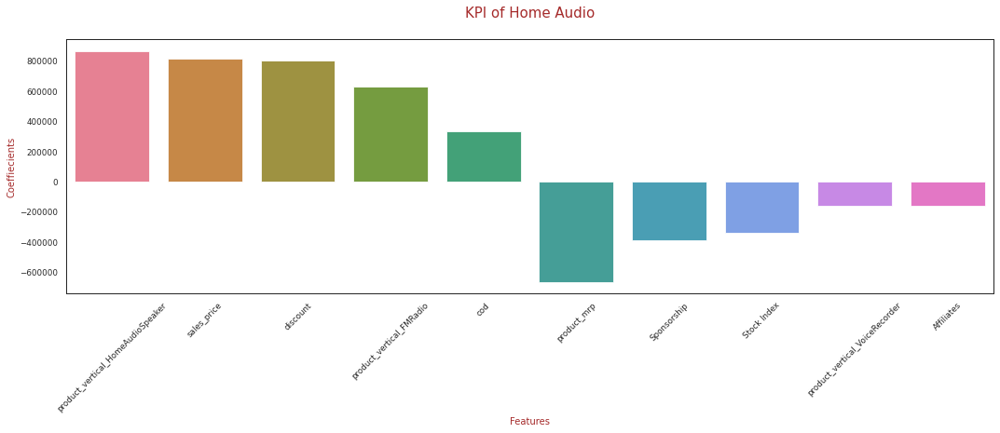

In [541]:
# Plotting the KPI
aud = pd.concat([aud_p,aud_n], axis=0)
aud.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=aud, estimator=np.sum)
plt.title("KPI of Home Audio\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

From the above Models we can follow that:
* There are interactions between KPIs of Camera Accessory and Gaming Accessory
* KPI of Home Audio data have an additive respeonse towards the GMV

The multiplicative models tell us about the growth of revenue vs the interactive growth of the KPIs

### Model Evaluation

**Residual Analysis**

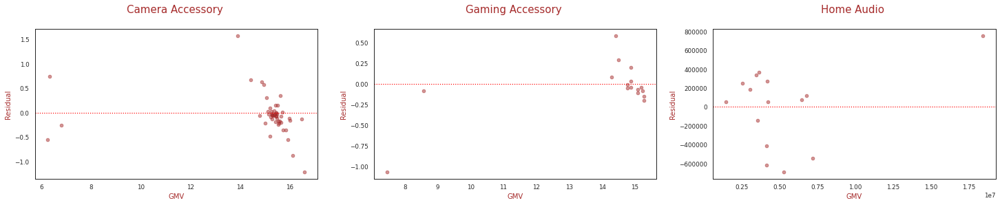

In [484]:
# Residual v/s predictions plot
plt.figure(figsize=[25,4])

plt.subplot(1,3,1)
y_cam_res = y_cameraaccessory_model2_cvdf - cameraaccessory_predictions_mcv
plt.scatter( cameraaccessory_predictions_mcv, y_cam_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Camera Accessory \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,2)
y_game_res = y_gamingaccessory_model2_test - y_gamingaccessory_model2_test_pred
plt.scatter( y_gamingaccessory_model2_test_pred, y_game_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Gaming Accessory \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,3)
y_aud_res = y_homeaudio_model1_test - y_homeaudio_model1_test_pred
plt.scatter( y_homeaudio_model1_test_pred, y_aud_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Home Audio \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

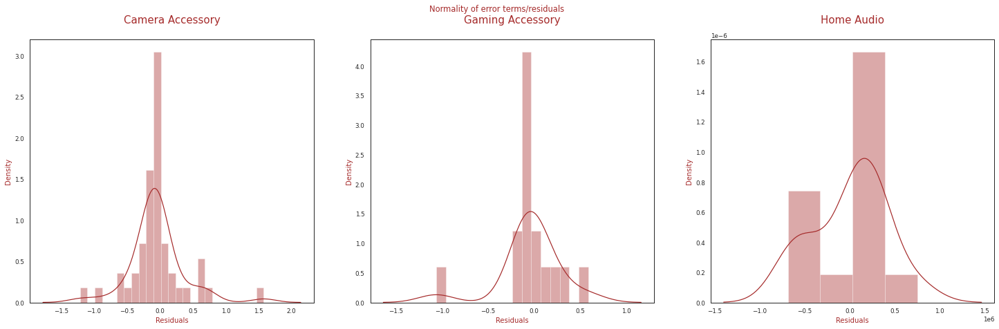

In [485]:
# Distribution of errors
plt.figure(figsize=[25,7])

plt.subplot(1,3,1)
p = sns.distplot(y_cam_res,kde=True, color="brown")
p = plt.xlabel("Residuals", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.title("Camera Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,2)
p = sns.distplot(y_game_res,kde=True, color="brown")
p = plt.xlabel("Residuals", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.title("Gaming Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,3)
p = sns.distplot(y_aud_res,kde=True, color="brown")
p = plt.xlabel("Residuals", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.title("Home Audio\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.suptitle("Normality of error terms/residuals\n", fontdict={"fontsize":25, "fontweight":10, "color":"brown"})
plt.show()

From above residual analysis the linear regression assumptions are satified.

* Error terms are normally distributed
* Error terma are independent of each other
* Error terms have constant variance

**Actual vs Predicted Analysis**

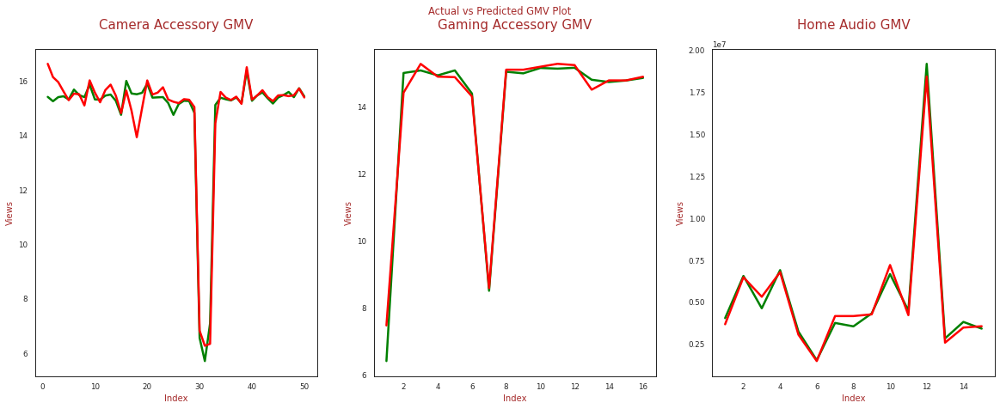

In [486]:
# Plotting Actual vs Predicted

plt.figure(figsize=(20, 7))

plt.subplot(1, 3, 1)
c = [i for i in range(1,51,1)]
plt.plot(c,y_cameraaccessory_model2_cvdf, color="green", linewidth=2.5, linestyle="solid")
plt.plot(c,cameraaccessory_predictions_mcv, color="red",  linewidth=2.5, linestyle="solid")
plt.title("Camera Accessory GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Views", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1, 3, 2)
c = [i for i in range(1,17,1)]
plt.plot(c,y_gamingaccessory_model2_test, color="green", linewidth=2.5, linestyle="solid")
plt.plot(c,y_gamingaccessory_model2_test_pred, color="red",  linewidth=2.5, linestyle="solid")
plt.title("Gaming Accessory GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Views", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1, 3, 3)
c = [i for i in range(1,16,1)]
plt.plot(c,y_homeaudio_model1_test, color="green", linewidth=2.5, linestyle="solid")
plt.plot(c,y_homeaudio_model1_test_pred, color="red",  linewidth=2.5, linestyle="solid")
plt.title("Home Audio GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Views", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.suptitle("Actual vs Predicted GMV Plot\n\n\n", fontdict={"fontsize":25, "fontweight":10, "color":"brown"})
plt.show()

### Model Equation

We will selecting top 10 KPIs for each product sub-category (5 highly positive/negative)

The equation for the best fit line for all the three product sub categories is as follows:

* Camera Accessory
gmv = (0.875 X units) + (0.826 X sales_price) + (0.225 X deliverycdays) + (0.132 X product_vertical_ReflectorUmbrella) + (0.124 X luxuary_product) + (-0.312 X discount	) + (-0.217 X deliverybdays) + (-0.087 X Total Precip (mm) + (-0.056 X product_vertical_CameraRemoteControl) + (-0.048 X sla)

* Gaming Accessory
gmv = (0.426 X product_vertical_GamePad) + (0.348 X units) + (0.294 X product_vertical_GamingHeadset) + (0.199 X luxuary_product) + (0.139 X product_vertical_GamingAdapter) + (-0.105 X Content Marketing) + (-0.092 X TV) + (-0.090 X Mean Temp (°C) + (-0.065 X product_procurement_sla) + (-0.064 X product_vertical_JoystickGamingWheel)

* Home Audio
gmv = (867299.674 X product_vertical_HomeAudioSpeaker) + (816468.372 X sales_price) + (802829.222 X discount) + (629291.144 X product_vertical_FMRadio) + (334282.906 X cod) + (-663277.019 X product_mrp) + (-387736.604 X Sponsorship) + (-337136.544 X Stock Index) + (-160880.199 X product_vertical_VoiceRecorder) + (-159545.335 X Affiliates)

### Recommendation

Camera Accessory: 
1. Product Vertical Reflector Umbrella and luxury products with price above 2000 CAD contribute to high revenue. So, company should look after the availability and marketing of these products.
2. Customer tend to order products which minimum sla/ delivery days. So, company should check for the product availability in the nearest warehouse of the region from where the orders are high.
3. During high Precipitation the demand of the camera accessories is low so comapany can provide discount during this period and gain customers.


Gaming Accessory:
1. Products like Game Pad, Gaming Headset, Gaming Adapter and luxury products contribute to high revenue. So, company should look after the availability and marketing of these products.
2. During the winter i.e.(low temp) customer prefer to buy more gaming accessories so comapny can increase the sales price according to the demand.
3. Company should revisit the content marketing stratergies and TV ads as they have negatively impacted the revenue.

Home Audio:
1. Customer prefer opting for Cash on delivery. Providing discounted on home audio products has affected in high revenue.
2. Home Audio and FM Radio are product that positively contribute to the revenue whereas Voice Recorder has negative impact on revenue.
3. Sponsorship and Affiliates have negatively affted the revenue. Also during high stock index the revenue has seen a dip.